In [1]:
import sys
sys.path.append("../") # adding the path to read the utils file
from sklearnex import patch_sklearn
patch_sklearn(global_patch=True)
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, StratifiedKFold
from catboost import CatBoostClassifier
from sklearn import metrics, tree
from shap import TreeExplainer
import fasttreeshap
from shap import plots, Explanation
import graphviz 
from yellowbrick.model_selection import LearningCurve
import time
import shap
from utils import *
import pickle
import glob
from yellowbrick.classifier import ROCAUC
from yellowbrick.contrib.wrapper import wrap

pd.set_option('display.max_columns', None)

Scikit-learn was successfully globally patched by Intel(R) Extension for Scikit-learn


Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


In [2]:
ds = pd.concat([pd.read_csv(csv_file, engine='pyarrow', index_col='id') for csv_file in glob.glob('../datasets/NFS-2023-TE/*.csv')], ignore_index=True)
ds.head()

,expiration_id,src_ip,src_mac,src_oui,src_port,dst_ip,dst_mac,dst_oui,dst_port,protocol,ip_version,vlan_id,bidirectional_first_seen_ms,bidirectional_last_seen_ms,bidirectional_duration_ms,bidirectional_packets,bidirectional_bytes,src2dst_first_seen_ms,src2dst_last_seen_ms,src2dst_duration_ms,src2dst_packets,src2dst_bytes,dst2src_first_seen_ms,dst2src_last_seen_ms,dst2src_duration_ms,dst2src_packets,dst2src_bytes,bidirectional_min_ps,bidirectional_mean_ps,bidirectional_stddev_ps,bidirectional_max_ps,src2dst_min_ps,src2dst_mean_ps,src2dst_stddev_ps,src2dst_max_ps,dst2src_min_ps,dst2src_mean_ps,dst2src_stddev_ps,dst2src_max_ps,bidirectional_min_piat_ms,bidirectional_mean_piat_ms,bidirectional_stddev_piat_ms,bidirectional_max_piat_ms,src2dst_min_piat_ms,src2dst_mean_piat_ms,src2dst_stddev_piat_ms,src2dst_max_piat_ms,dst2src_min_piat_ms,dst2src_mean_piat_ms,dst2src_stddev_piat_ms,dst2src_max_piat_ms,bidirectional_syn_packets,bidirectional_cwr_packets,bidirectional_ece_packets,bidirectional_urg_packets,bidirectional_ack_packets,bidirectional_psh_packets,bidirectional_rst_packets,bidirectional_fin_packets,src2dst_syn_packets,src2dst_cwr_packets,src2dst_ece_packets,src2dst_urg_packets,src2dst_ack_packets,src2dst_psh_packets,src2dst_rst_packets,src2dst_fin_packets,dst2src_syn_packets,dst2src_cwr_packets,dst2src_ece_packets,dst2src_urg_packets,dst2src_ack_packets,dst2src_psh_packets,dst2src_rst_packets,dst2src_fin_packets,label
0,-1,192.168.10.9,b8:ac:6f:1d:1f:6c,b8:ac:6f,1031,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,88,6,4,0,1499428835357,1499428835358,1,6,800,1499428835357,1499428835358,1,4,473,1499428835357,1499428835358,1,2,327,60,133.333333,109.302638,287,60,118.25,112.535550,287,66,163.5,137.885822,261,0,0.200000,0.447214,1,0,0.333333,0.57735,1,1,1.0,0.000000,1,2,0,0,0,5,2,0,1,1,0,0,0,3,1,0,1,1,0,0,0,2,1,0,0,BENIGN
1,-1,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,88,192.168.10.9,b8:ac:6f:1d:1f:6c,b8:ac:6f,1031,6,4,0,1499428835358,1499428835358,0,2,120,1499428835358,1499428835358,0,2,120,0,0,0,0,0,60,60.000000,0.000000,60,60,60.00,0.000000,60,0,0.0,0.000000,0,0,0.000000,0.000000,0,0,0.000000,0.00000,0,0,0.0,0.000000,0,0,0,0,0,2,0,1,0,0,0,0,0,2,0,1,0,0,0,0,0,0,0,0,0,BENIGN
2,-1,192.168.10.9,b8:ac:6f:1d:1f:6c,b8:ac:6f,1032,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,88,6,4,0,1499428835374,1499428835375,1,7,2265,1499428835374,1499428835375,1,5,613,1499428835374,1499428835375,1,2,1652,60,323.571429,568.141372,1586,60,122.60,136.648454,367,66,826.0,1074.802307,1586,0,0.166667,0.408248,1,0,0.250000,0.50000,1,1,1.0,0.000000,1,2,0,0,0,6,2,0,1,1,0,0,0,4,1,0,1,1,0,0,0,2,1,0,0,BENIGN
3,-1,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,88,192.168.10.9,b8:ac:6f:1d:1f:6c,b8:ac:6f,1032,6,4,0,1499428835375,1499428835375,0,2,120,1499428835375,1499428835375,0,2,120,0,0,0,0,0,60,60.000000,0.000000,60,60,60.00,0.000000,60,0,0.0,0.000000,0,0,0.000000,0.000000,0,0,0.000000,0.00000,0,0,0.0,0.000000,0,0,0,0,0,2,0,1,0,0,0,0,0,2,0,1,0,0,0,0,0,0,0,0,0,BENIGN
4,-1,192.168.10.9,b8:ac:6f:1d:1f:6c,b8:ac:6f,1033,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,88,6,4,0,1499428835416,1499428835417,1,8,3550,1499428835416,1499428835417,1,5,1852,1499428835416,1499428835417,1,3,1698,60,443.750000,706.926901,1606,60,370.40,690.726284,1606,60,566.0,871.226721,1572,0,0.142857,0.377964,1,0,0.250000,0.50000,1,0,0.5,0.707107,1,2,0,0,0,7,2,0,1,1,0,0,0,4,1,0,1,1,0,0,0,3,1,0,0,BENIGN


In [3]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3153360 entries, 0 to 3153359
Data columns (total 76 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   expiration_id                 int64  
 1   src_ip                        object 
 2   src_mac                       object 
 3   src_oui                       object 
 4   src_port                      int64  
 5   dst_ip                        object 
 6   dst_mac                       object 
 7   dst_oui                       object 
 8   dst_port                      int64  
 9   protocol                      int64  
 10  ip_version                    int64  
 11  vlan_id                       int64  
 12  bidirectional_first_seen_ms   int64  
 13  bidirectional_last_seen_ms    int64  
 14  bidirectional_duration_ms     int64  
 15  bidirectional_packets         int64  
 16  bidirectional_bytes           int64  
 17  src2dst_first_seen_ms         int64  
 18  src2dst_last_seen_ms  

In [4]:
compute_ratio(ds,'label')

                            Ratio
label                            
BENIGN                      83.71
PortScan                     7.34
DoS Hulk                     5.03
DDoS                         3.03
FTP-Patator                  0.25
DoS GoldenEye                0.25
DoS slowloris                0.16
SSH-Patator                  0.09
DoS Slowhttptest             0.09
Bot                          0.02
Web Attack - Brute Force     0.00
Infiltration                 0.00
Web Attack - XSS             0.00
Web Attack - Sql Injection   0.00
Heartbleed                   0.00


In [5]:
ds.label.value_counts()

label
BENIGN                        2639806
PortScan                       231572
DoS Hulk                       158546
DDoS                            95685
FTP-Patator                      7963
DoS GoldenEye                    7917
DoS slowloris                    5192
SSH-Patator                      2980
DoS Slowhttptest                 2732
Bot                               738
Web Attack - Brute Force          151
Infiltration                       28
Web Attack - XSS                   27
Web Attack - Sql Injection         12
Heartbleed                         11
Name: count, dtype: int64

In [6]:
ds = ds.drop(columns=feature_to_remove_NFS)

In [7]:
sample_weights = ds.label.value_counts().to_dict()

In [8]:
sample_weights['BENIGN'] = 738
sample_weights['PortScan'] = 738
sample_weights['DoS Hulk'] = 738
sample_weights['DDoS'] = 738
sample_weights['FTP-Patator'] = 738
sample_weights['DoS GoldenEye'] = 738
sample_weights['DoS slowloris'] = 738
sample_weights['SSH-Patator'] = 738
sample_weights['DoS Slowhttptest'] = 738

In [9]:
params = {
    'iterations': 40, # 40
    'depth': 9, # 9
    'learning_rate': 0.7, # 0.01
    'loss_function': 'MultiClass',
    'verbose': True
}

cat = CatBoostClassifier(**params)

rus = RandomUnderSampler(random_state=42, sampling_strategy=sample_weights)
X_res, y_res = rus.fit_resample(ds.drop(columns=['label']), ds['label'])

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size = 0.2, random_state=12, shuffle=True, stratify=y_res)

In [11]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
skf.get_n_splits(X_res, y_res)

5

In [12]:
avg_train_f1 = []
avg_test_f1 = []

for i, (train_index, test_index) in enumerate(skf.split(X_res, y_res)):
    print(f"Fold {i}:")
    cat.fit(X_res.iloc[train_index], y_res.iloc[train_index])
    y_predicted_train = cat.predict(X_res.iloc[train_index])
    y_predicted_test = cat.predict(X_res.iloc[test_index])
    train_f1 = metrics.f1_score(y_res.iloc[train_index], y_predicted_train, average='macro')
    test_f1 = metrics.f1_score(y_res.iloc[test_index], y_predicted_test, average='macro')
    print(f"Train F1: {train_f1:.4f}")
    print(f"Test F1: {test_f1:.4f}")
    avg_train_f1.append(train_f1)
    avg_test_f1.append(test_f1)

print(f"Average Train F1: {np.mean(avg_train_f1):.4f}")
print(f"Average Test F1: {np.mean(avg_test_f1):.4f}")

Fold 0:


0:	learn: 0.5477653	total: 534ms	remaining: 20.8s
1:	learn: 0.3398076	total: 882ms	remaining: 16.8s
2:	learn: 0.1790485	total: 1.26s	remaining: 15.6s
3:	learn: 0.1459928	total: 1.63s	remaining: 14.7s
4:	learn: 0.1200922	total: 1.97s	remaining: 13.8s
5:	learn: 0.1036524	total: 2.29s	remaining: 13s
6:	learn: 0.0929523	total: 2.65s	remaining: 12.5s
7:	learn: 0.0849709	total: 2.98s	remaining: 11.9s
8:	learn: 0.0770057	total: 3.32s	remaining: 11.4s
9:	learn: 0.0678901	total: 3.63s	remaining: 10.9s
10:	learn: 0.0646745	total: 3.85s	remaining: 10.2s
11:	learn: 0.0611695	total: 4s	remaining: 9.33s
12:	learn: 0.0588677	total: 4.04s	remaining: 8.39s
13:	learn: 0.0571496	total: 4.18s	remaining: 7.77s
14:	learn: 0.0566500	total: 4.33s	remaining: 7.22s
15:	learn: 0.0564927	total: 4.34s	remaining: 6.52s
16:	learn: 0.0544832	total: 4.49s	remaining: 6.08s
17:	learn: 0.0510850	total: 4.64s	remaining: 5.67s
18:	learn: 0.0492124	total: 4.72s	remaining: 5.21s
19:	learn: 0.0462465	total: 4.86s	remaining: 4

In [13]:
%time cat.fit(X_train, y_train)

0:	learn: 0.5765327	total: 228ms	remaining: 8.9s
1:	learn: 0.7525874	total: 469ms	remaining: 8.91s
2:	learn: 0.1920714	total: 667ms	remaining: 8.23s
3:	learn: 0.1416458	total: 880ms	remaining: 7.92s
4:	learn: 0.1247497	total: 1.08s	remaining: 7.56s
5:	learn: 0.1082826	total: 1.28s	remaining: 7.24s
6:	learn: 0.0971658	total: 1.47s	remaining: 6.95s
7:	learn: 0.0910427	total: 1.69s	remaining: 6.74s
8:	learn: 0.0848407	total: 1.88s	remaining: 6.47s
9:	learn: 0.0791951	total: 2.08s	remaining: 6.24s
10:	learn: 0.0722681	total: 2.28s	remaining: 6.01s
11:	learn: 0.0706842	total: 2.29s	remaining: 5.34s
12:	learn: 0.0692106	total: 2.5s	remaining: 5.19s
13:	learn: 0.0661334	total: 2.72s	remaining: 5.06s
14:	learn: 0.0647353	total: 2.78s	remaining: 4.63s
15:	learn: 0.0623026	total: 2.98s	remaining: 4.47s
16:	learn: 0.0588537	total: 3.17s	remaining: 4.29s
17:	learn: 0.0573033	total: 3.37s	remaining: 4.12s
18:	learn: 0.0552939	total: 3.58s	remaining: 3.95s
19:	learn: 0.0530527	total: 3.79s	remaining

In [14]:
%time y_predicted_train = cat.predict(X_train)
%timeit cat.predict(X_test)
y_predicted_test = cat.predict(X_test)

CPU times: user 8.33 ms, sys: 3.04 ms, total: 11.4 ms
Wall time: 4.52 ms
The slowest run took 4.08 times longer than the fastest. This could mean that an intermediate result is being cached.
3.52 ms ± 1.88 ms per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


In [15]:
performanceMetricsDFWeighted(metrics, y_train, y_predicted_train, y_test, y_predicted_test, 'macro')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.992443,0.982260
1,PRECISION,0.994884,0.915175
2,RECALL,0.991454,0.863396
3,F1 SCORE,0.993094,0.880108


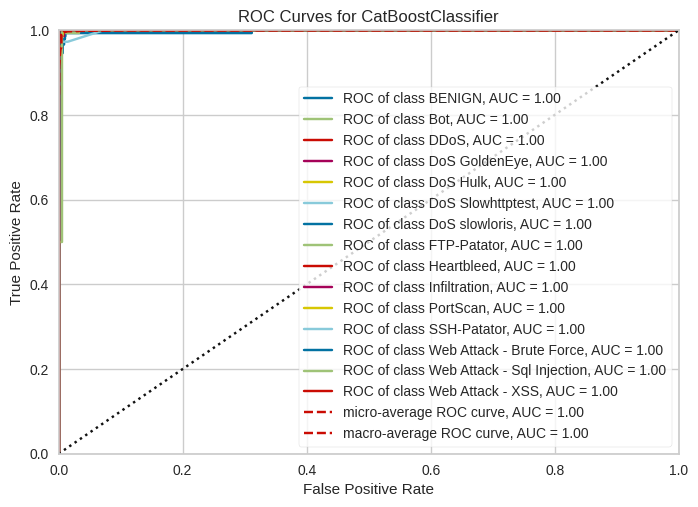

<Axes: title={'center': 'ROC Curves for CatBoostClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [16]:
model = wrap(cat)
visualizer = ROCAUC(model)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()

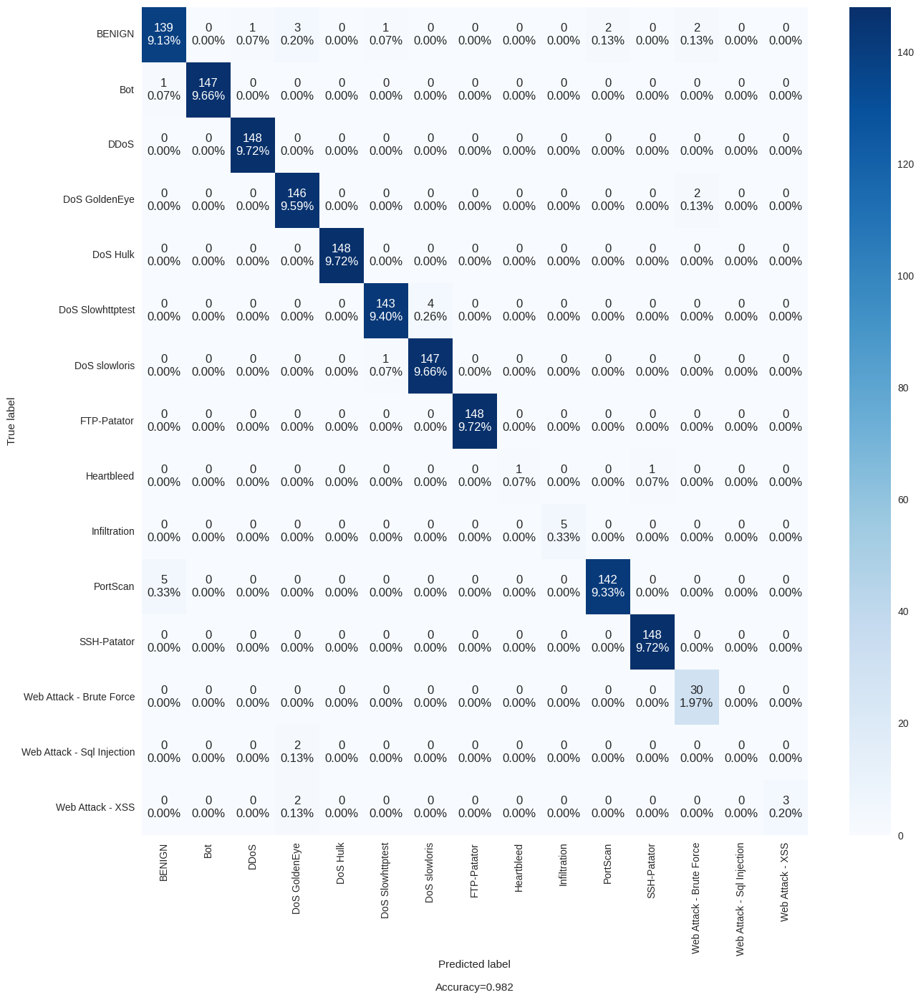

In [17]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(cat.classes_)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

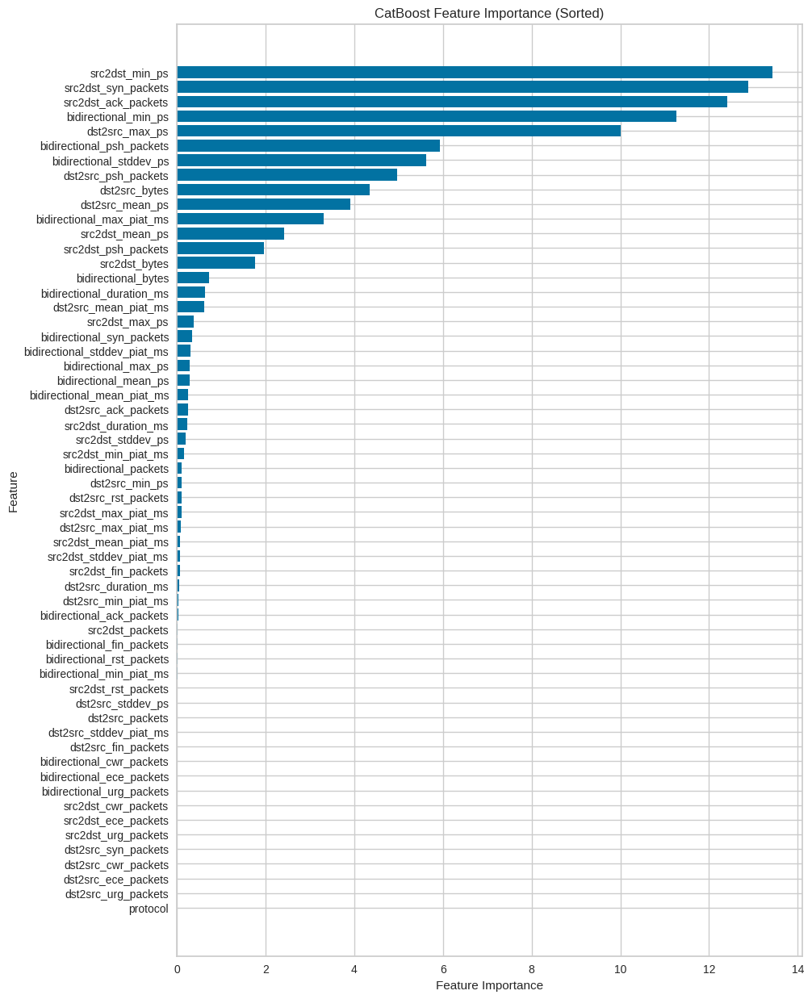

In [18]:
# Retrieve feature importance
feature_importance = model.get_feature_importance(type="FeatureImportance")
feature_names = X_train.columns

# Sort the features and feature importance scores
sorted_indices = np.argsort(feature_importance)
sorted_feature_importance = feature_importance[sorted_indices]
sorted_feature_names = feature_names[sorted_indices]

# Plot the sorted feature importance
plt.figure(figsize=(10, 15))
plt.barh(sorted_feature_names, sorted_feature_importance)
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('CatBoost Feature Importance (Sorted)')
plt.show()

Using interventional to stay "true to the model" since we will use this data to do feature reduction and we want also to understand how things work

In [19]:
%%time

explainer = fasttreeshap.TreeExplainer(cat, algorithm='auto', n_jobs=-1) 
sv = explainer(X_train)

CPU times: user 16.1 s, sys: 199 ms, total: 16.3 s
Wall time: 2.22 s


In [20]:
cat.classes_

array(['BENIGN', 'Bot', 'DDoS', 'DoS GoldenEye', 'DoS Hulk',
       'DoS Slowhttptest', 'DoS slowloris', 'FTP-Patator', 'Heartbleed',
       'Infiltration', 'PortScan', 'SSH-Patator',
       'Web Attack - Brute Force', 'Web Attack - Sql Injection',
       'Web Attack - XSS'], dtype=object)

In [21]:
def make_plot(i):
    exp = Explanation(sv.values[:,:,i], 
                  sv.base_values[:,i], 
                  data=X_train, 
                  feature_names=X_res.columns)

    plots.bar(exp, max_display=20, show=False)
    # plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
    plt.show()
    plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)
    plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)
    plots.bar(exp.abs.cohorts(2).mean(0))
    plots.heatmap(exp, instance_order=exp.sum(1))

## Benign shap

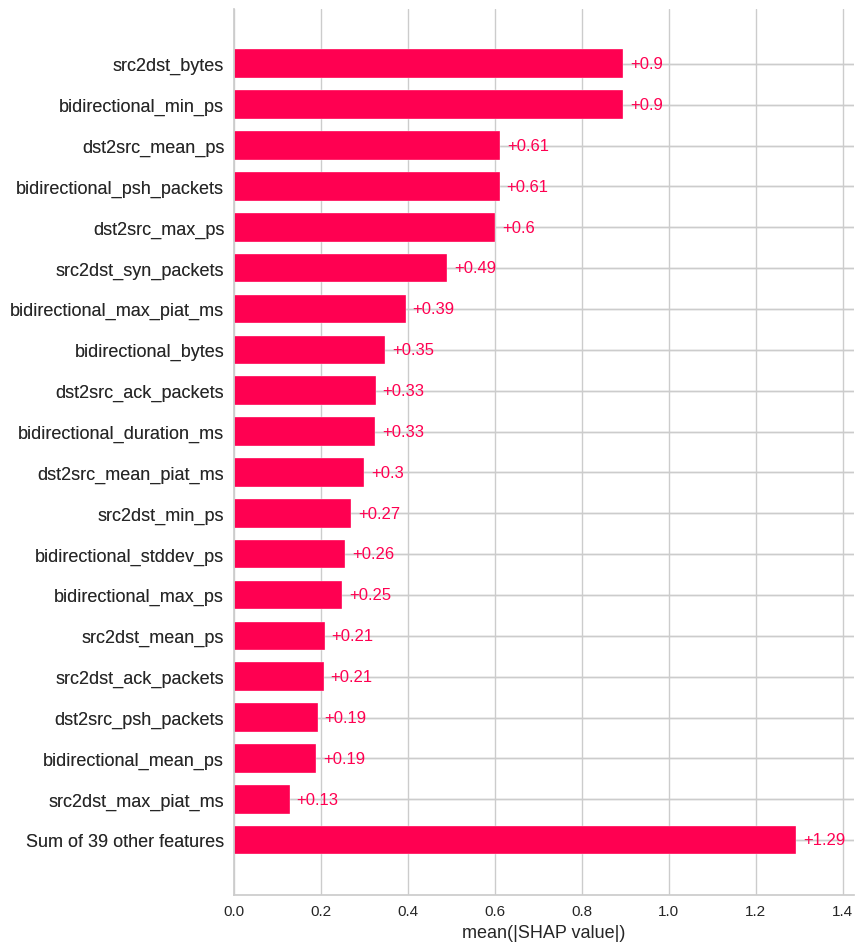

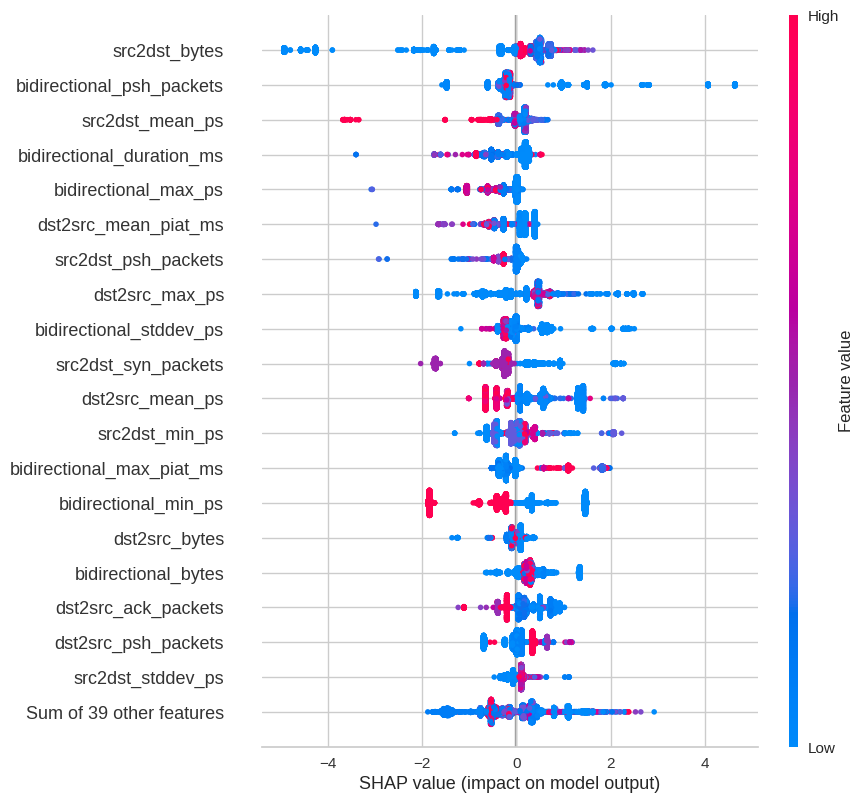

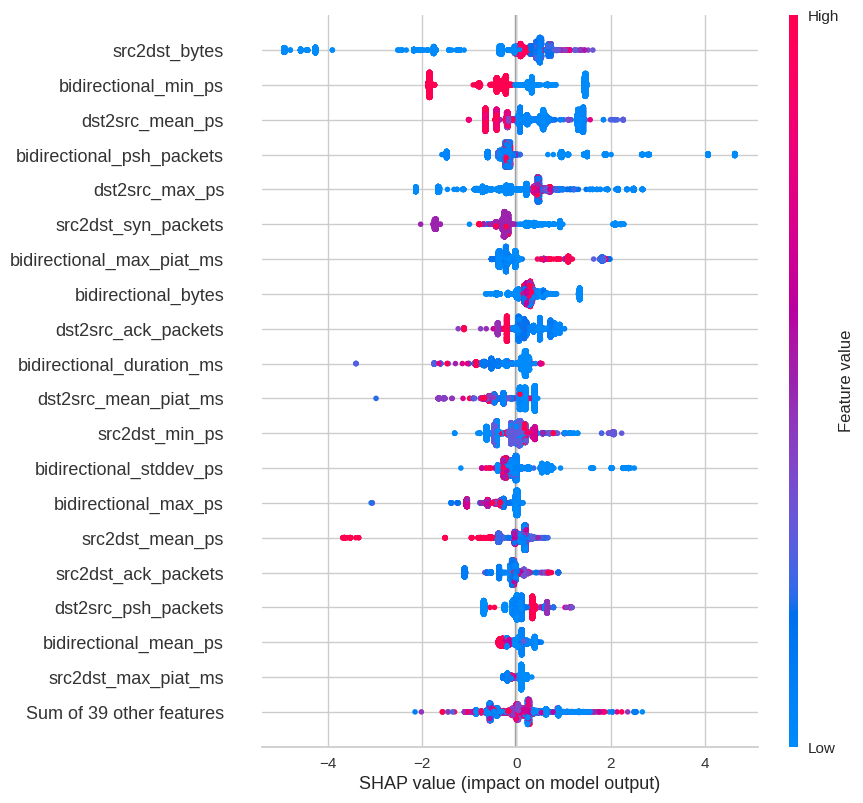

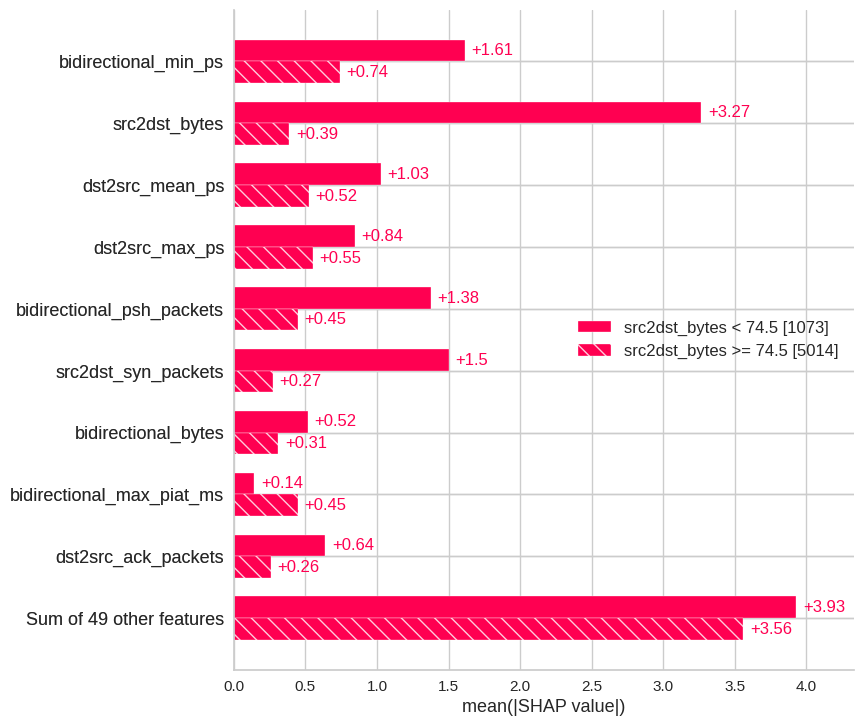

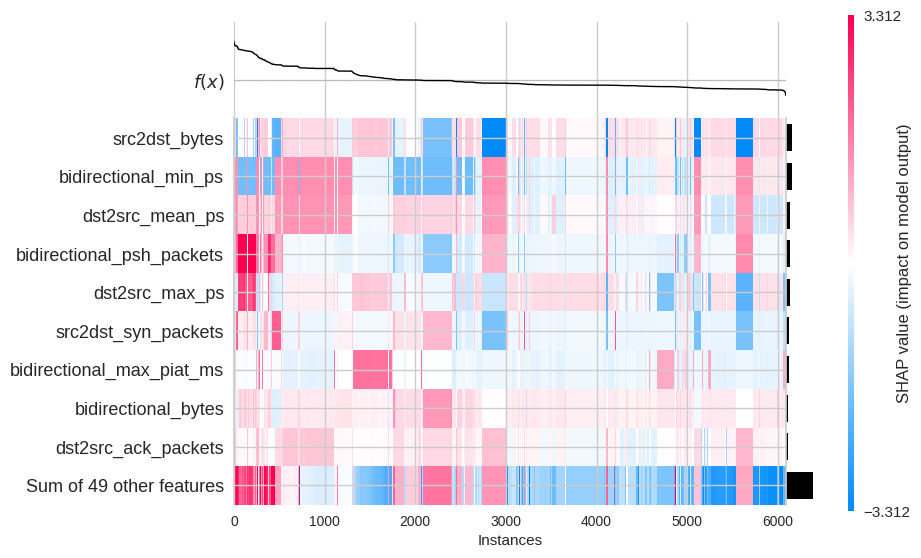

In [22]:
make_plot(0)

## Bot shap

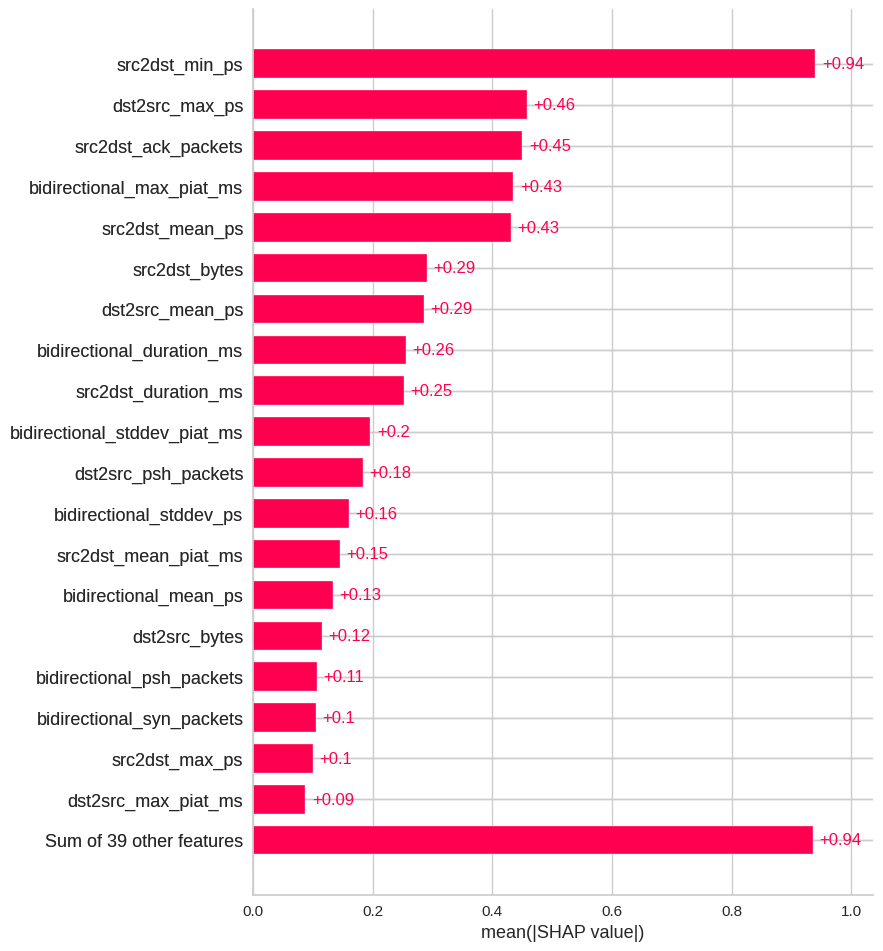

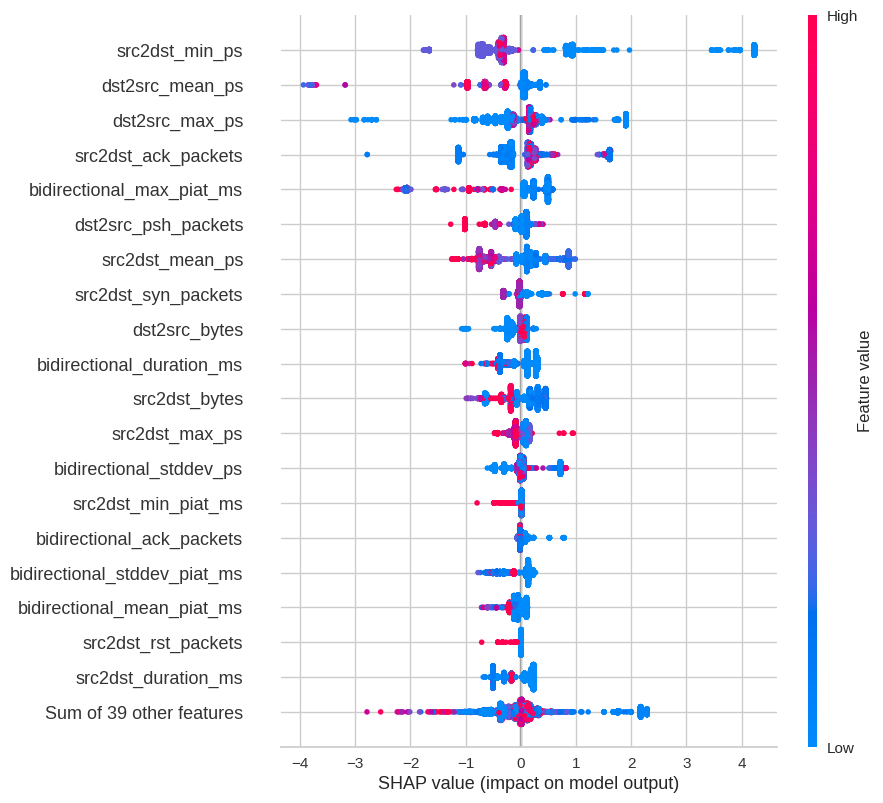

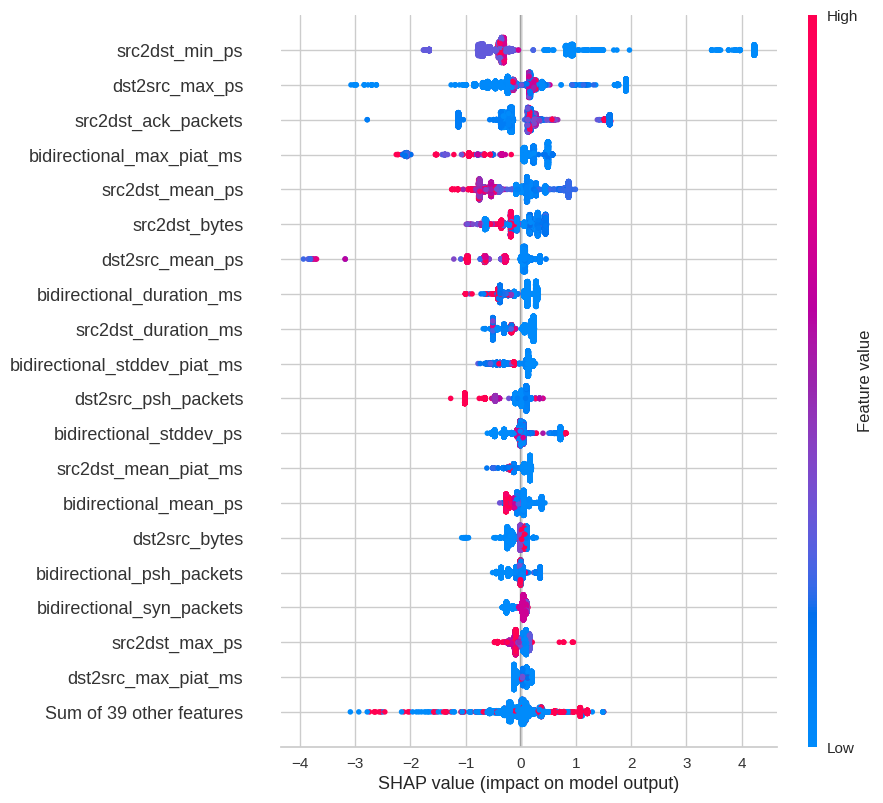

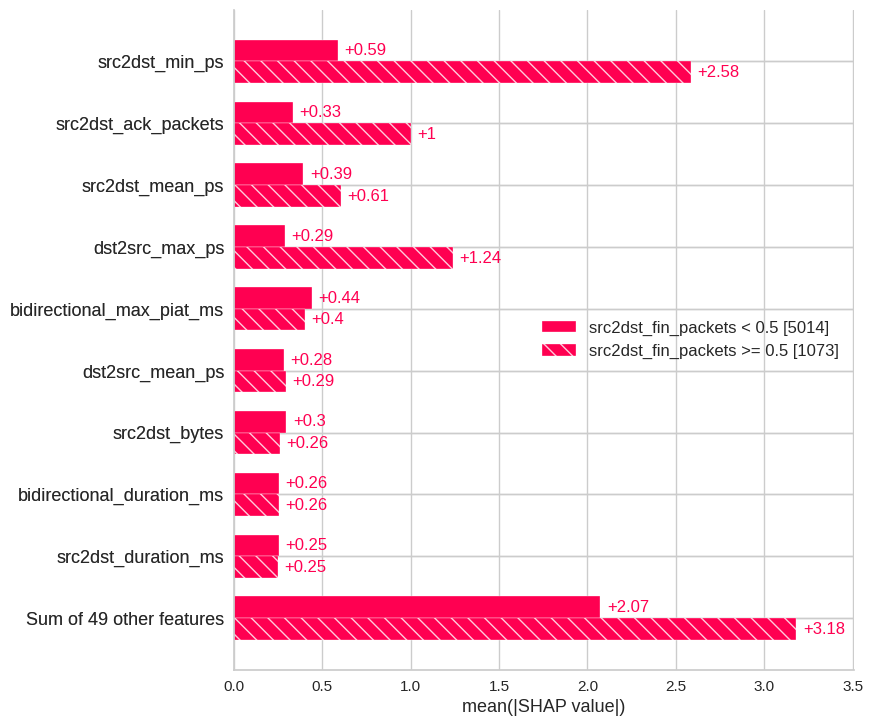

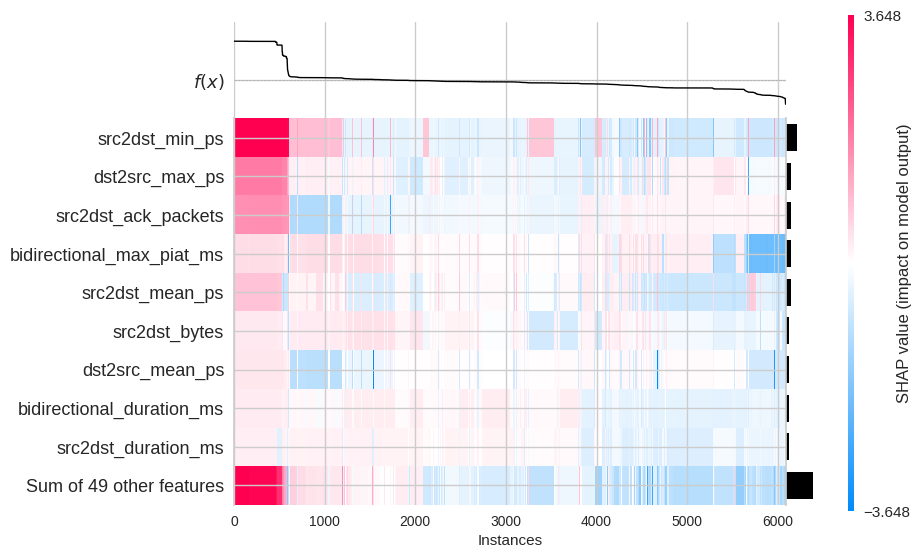

In [23]:
make_plot(1)

## DDoS shap

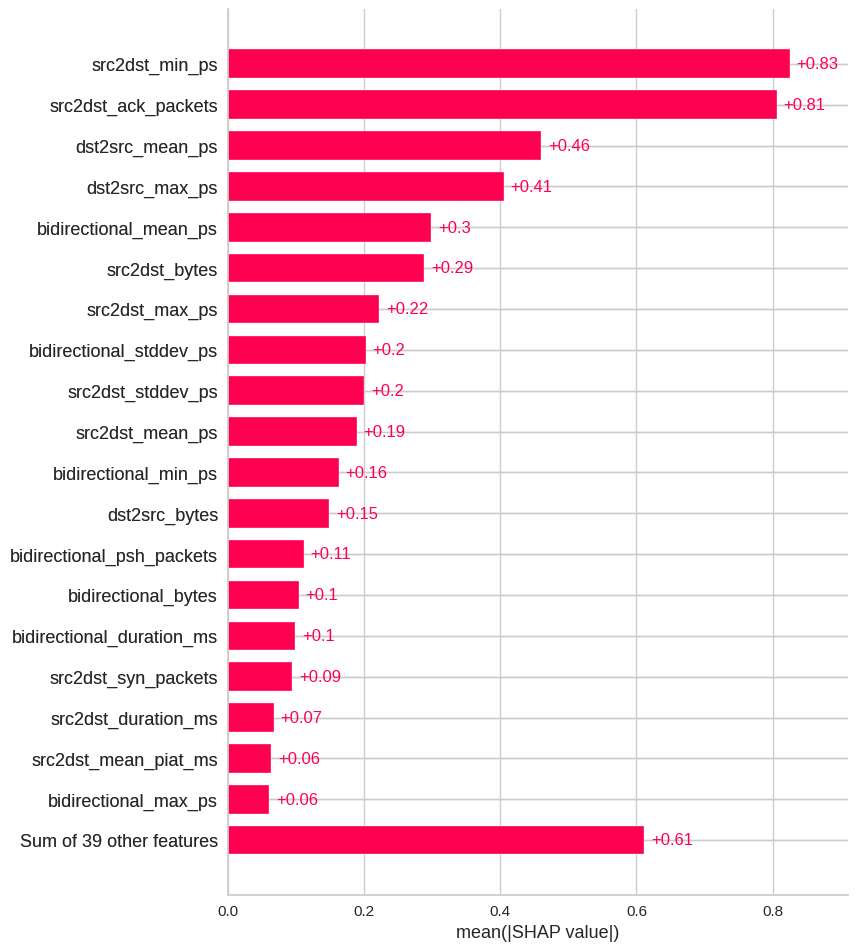

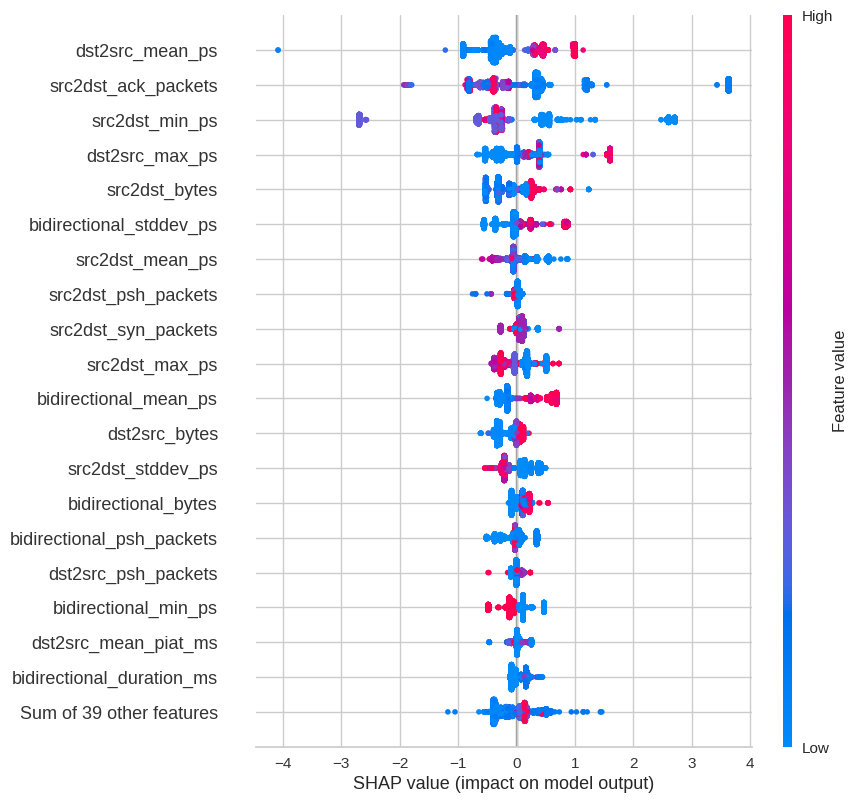

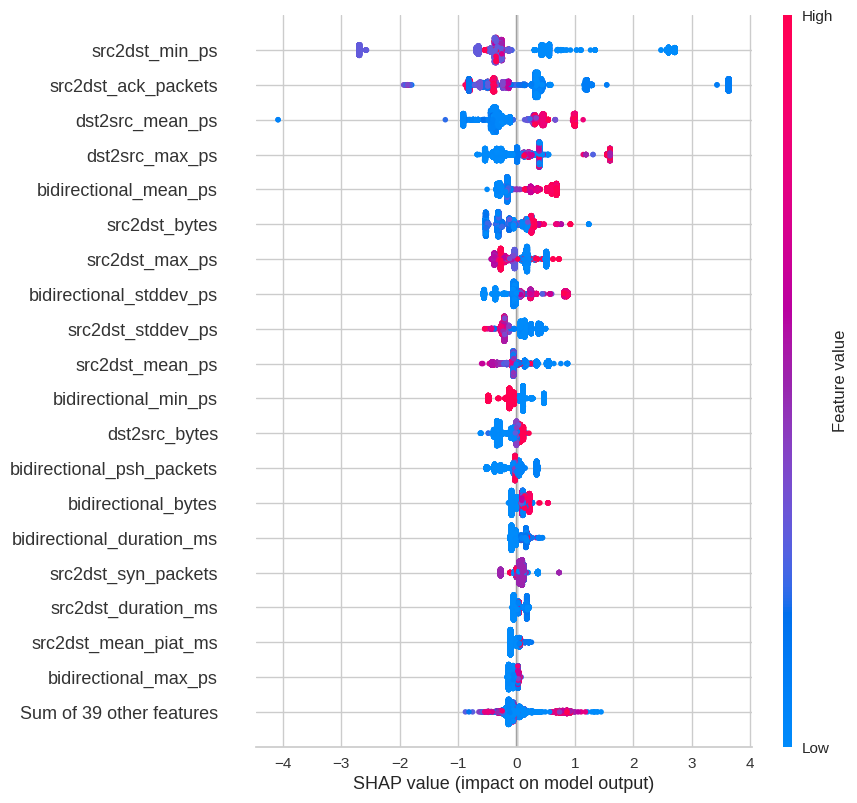

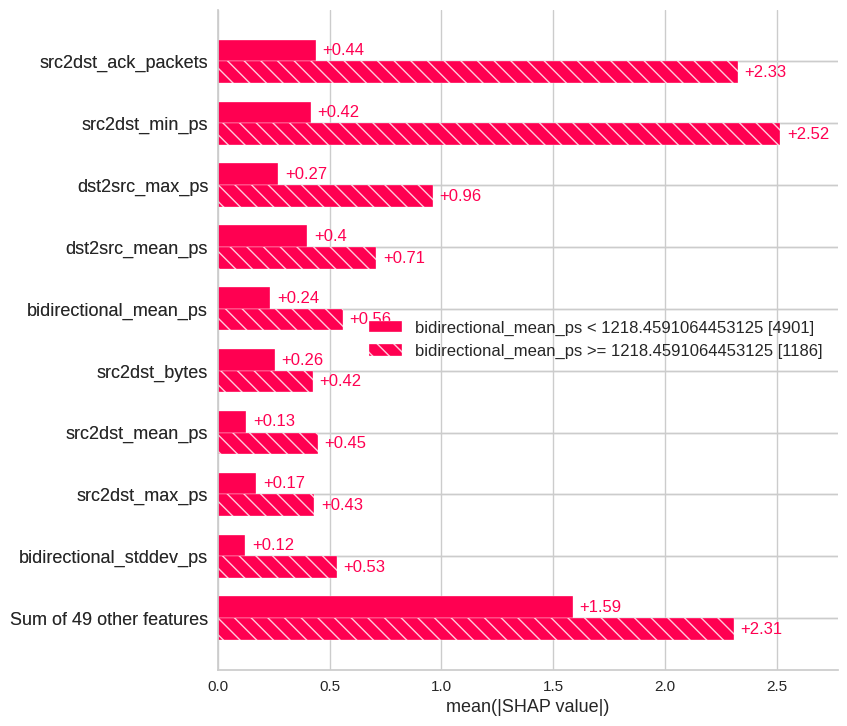

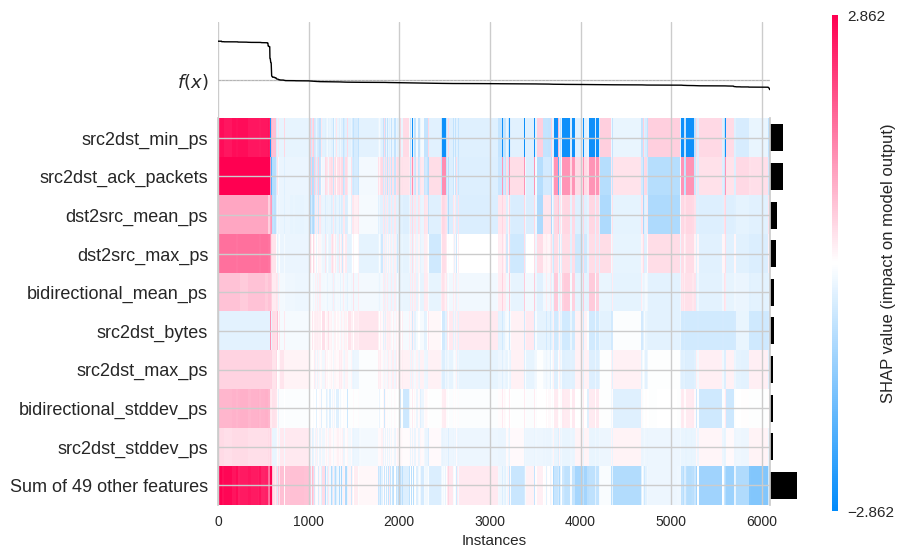

In [24]:
make_plot(2)

## DoS GoldenEye shap

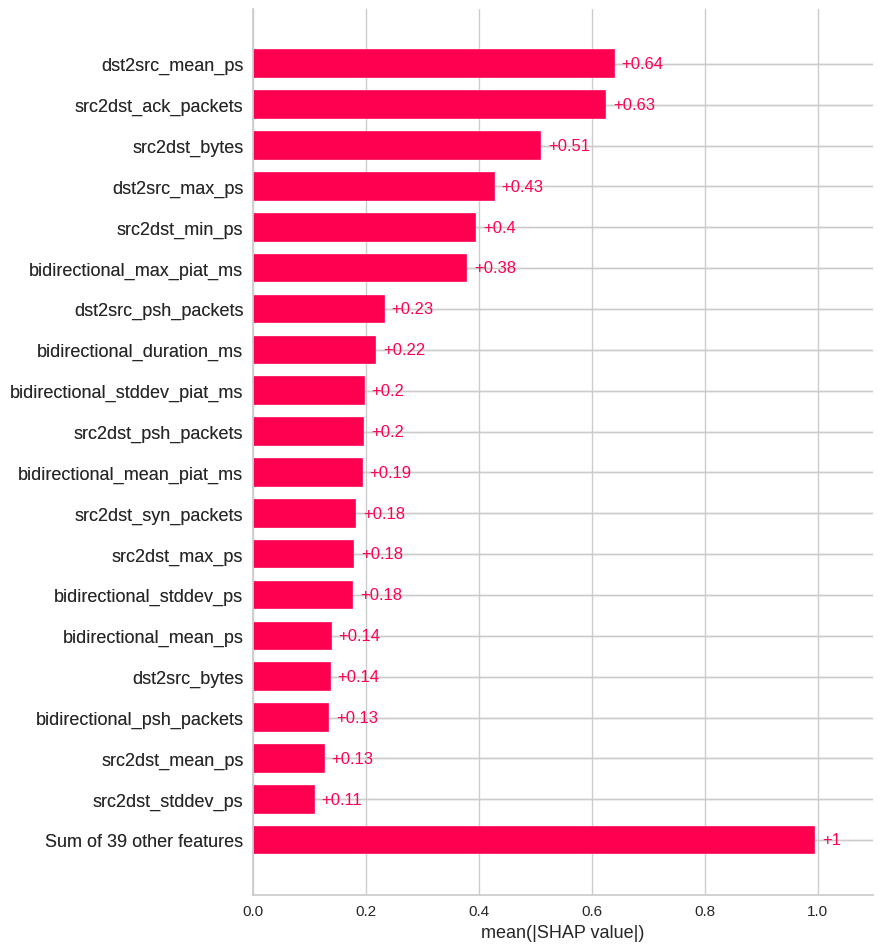

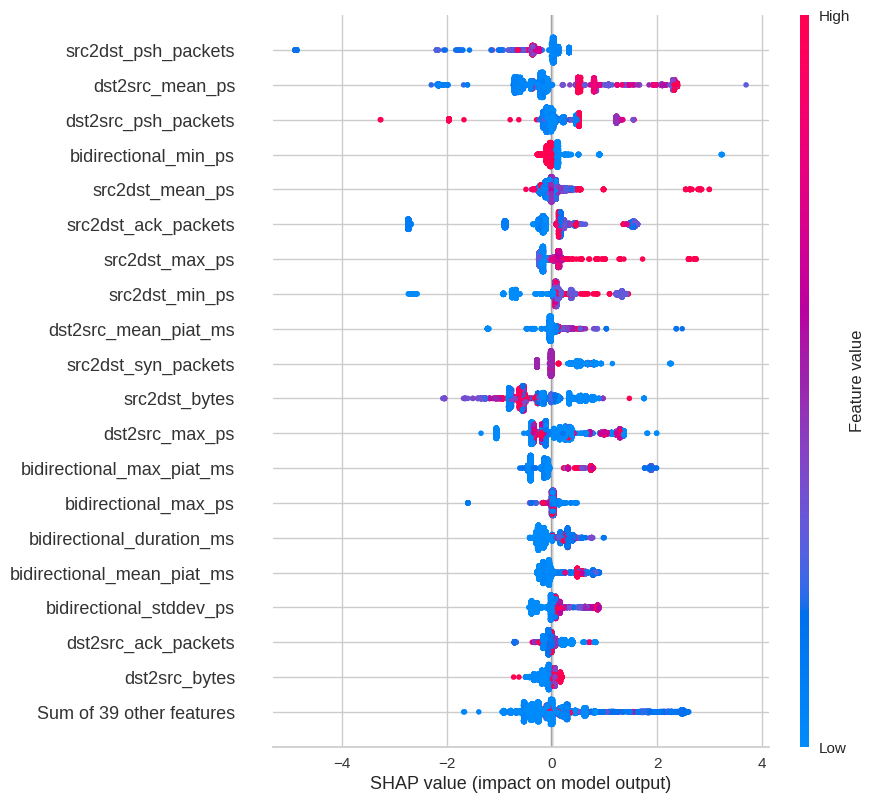

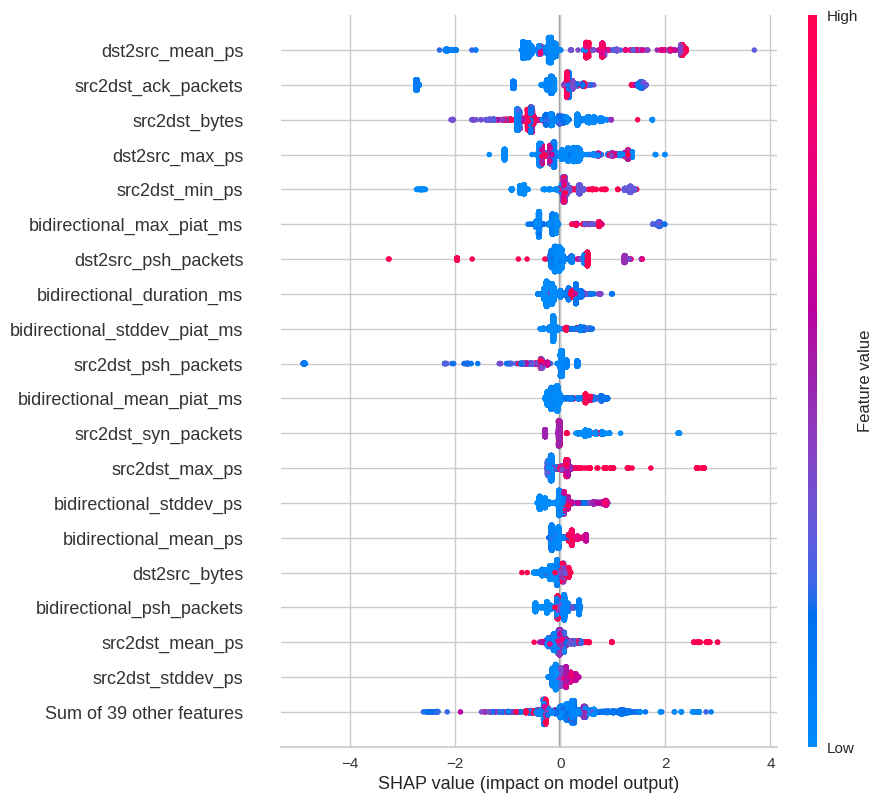

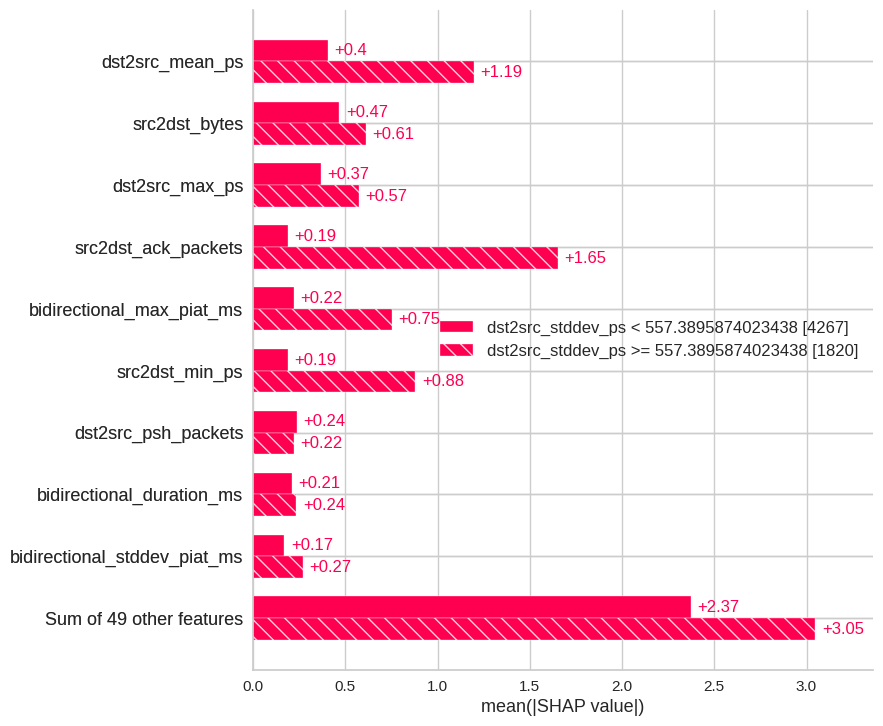

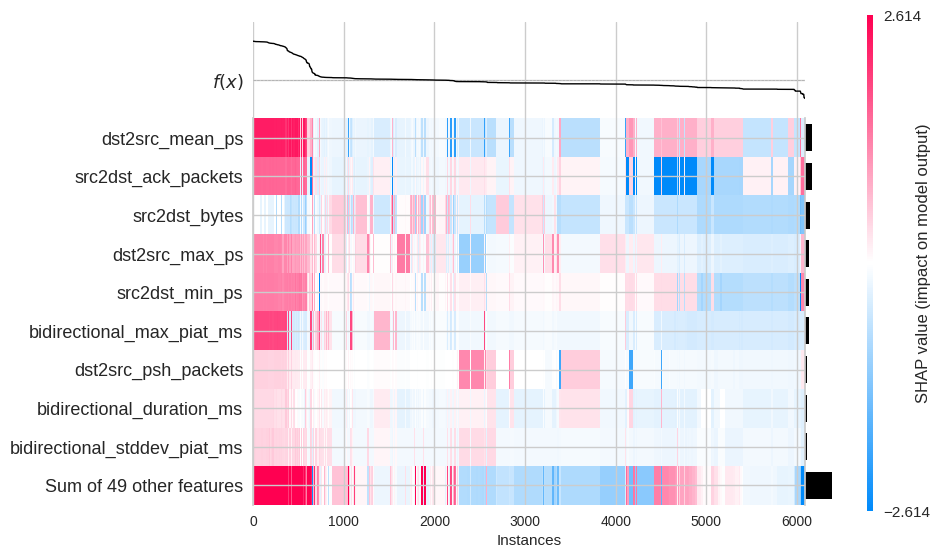

In [25]:
make_plot(3)

## DoS Hulk shap

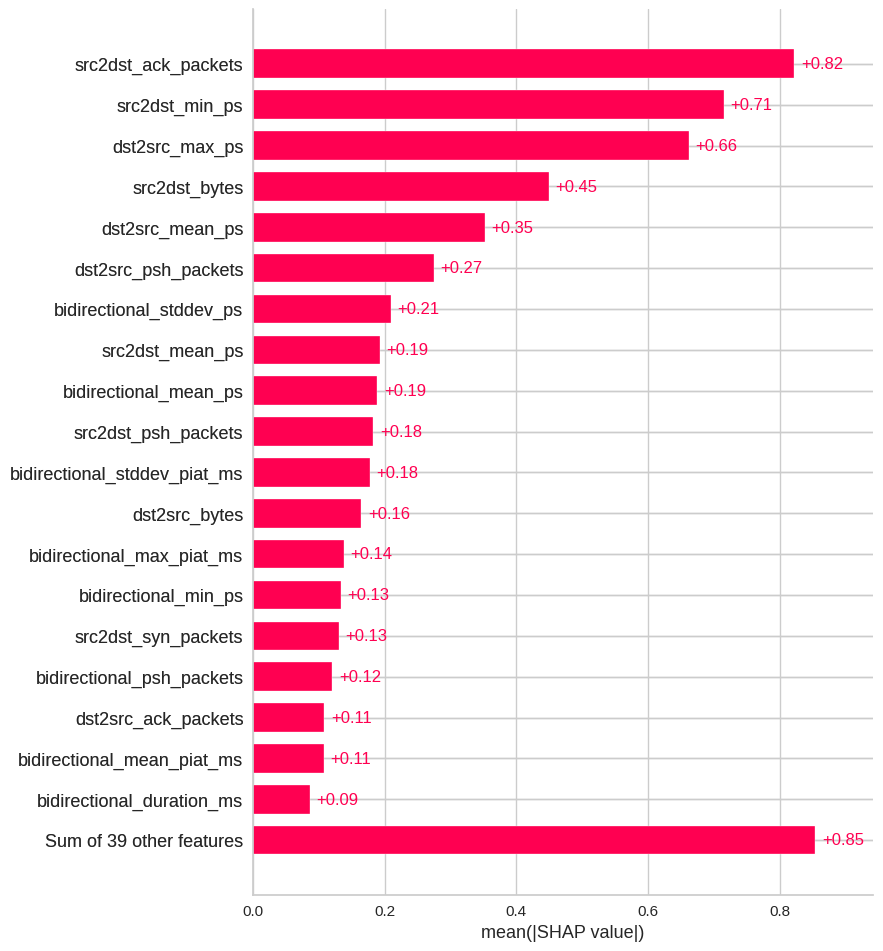

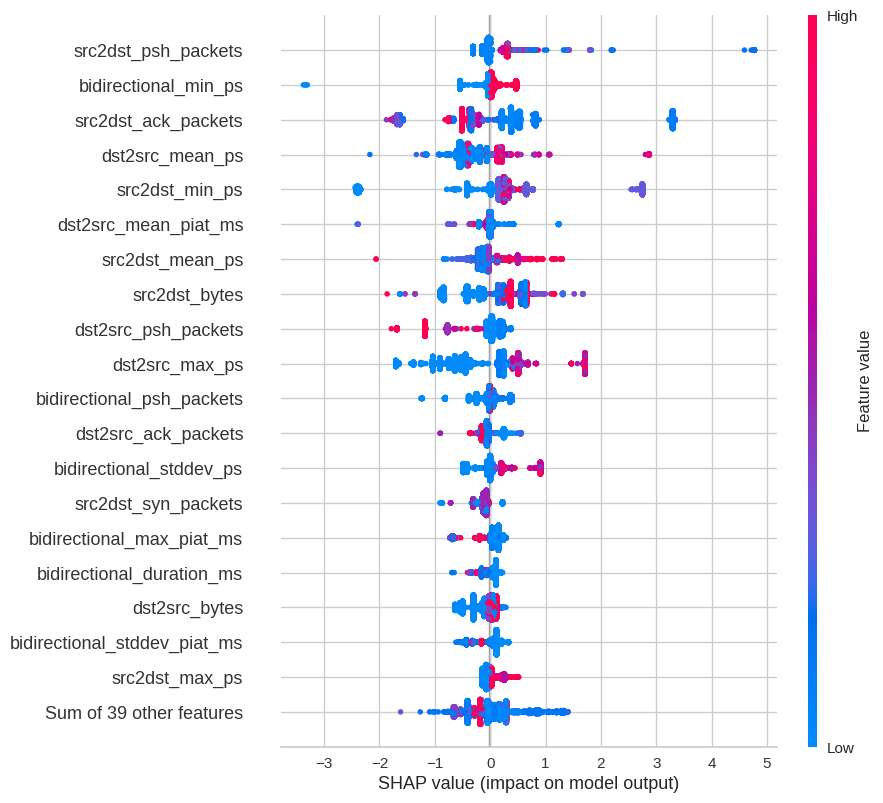

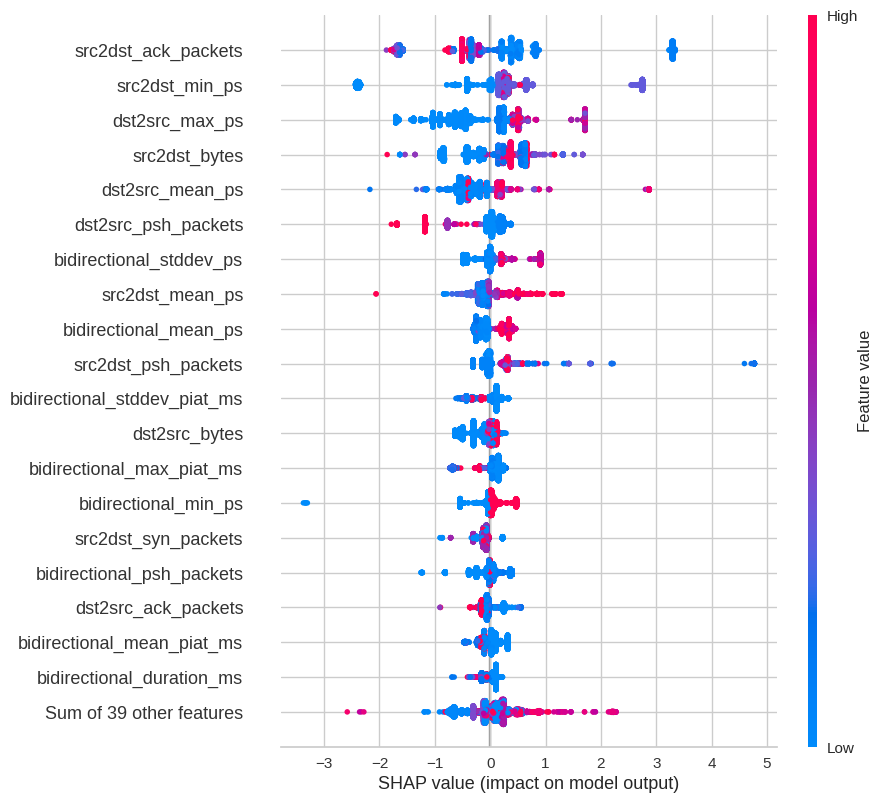

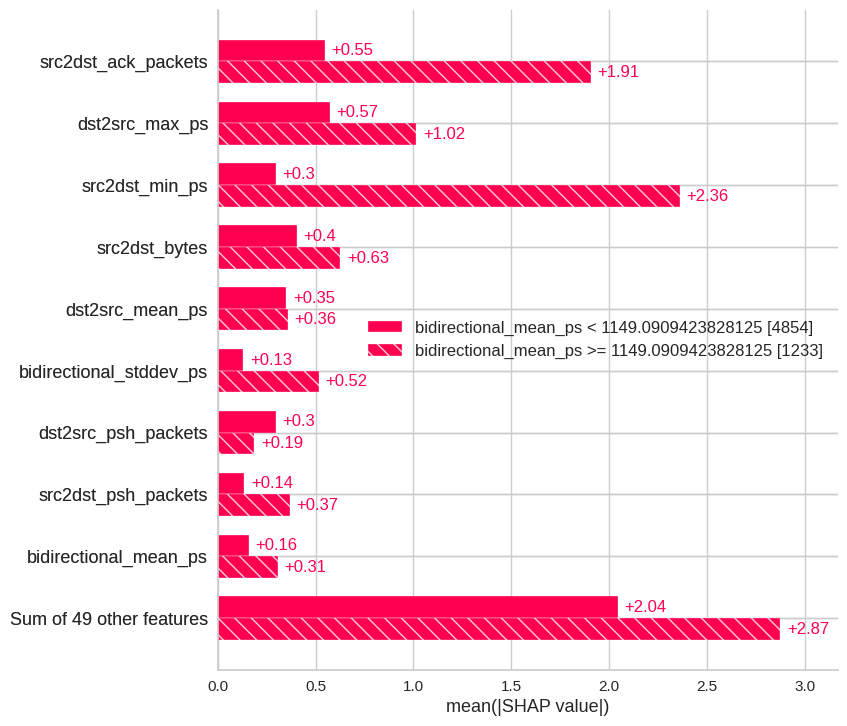

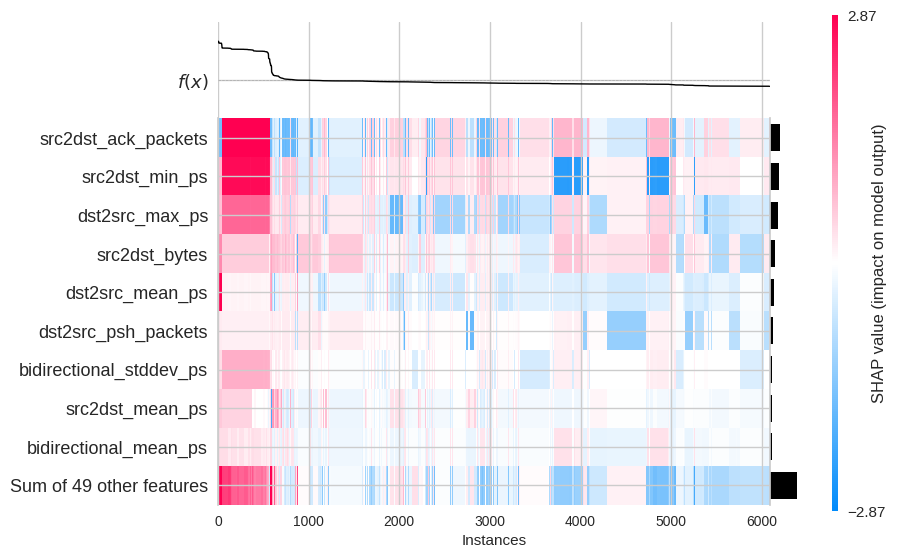

In [26]:
make_plot(4)

## DoS Slowhttptest shap

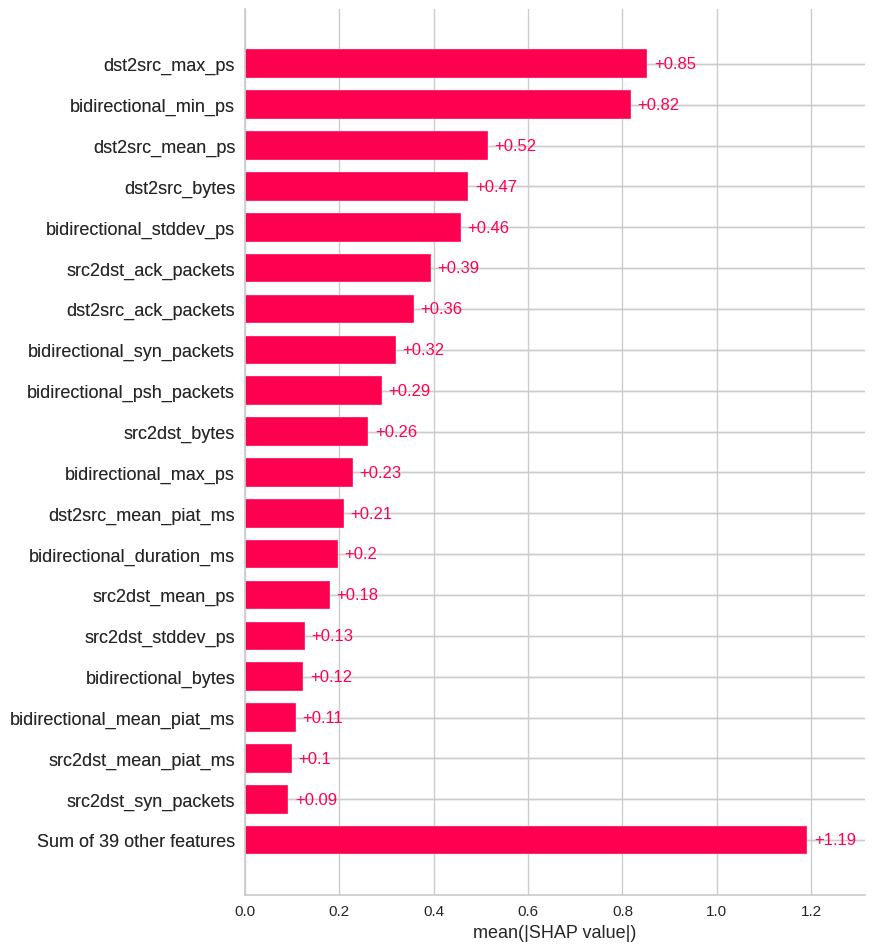

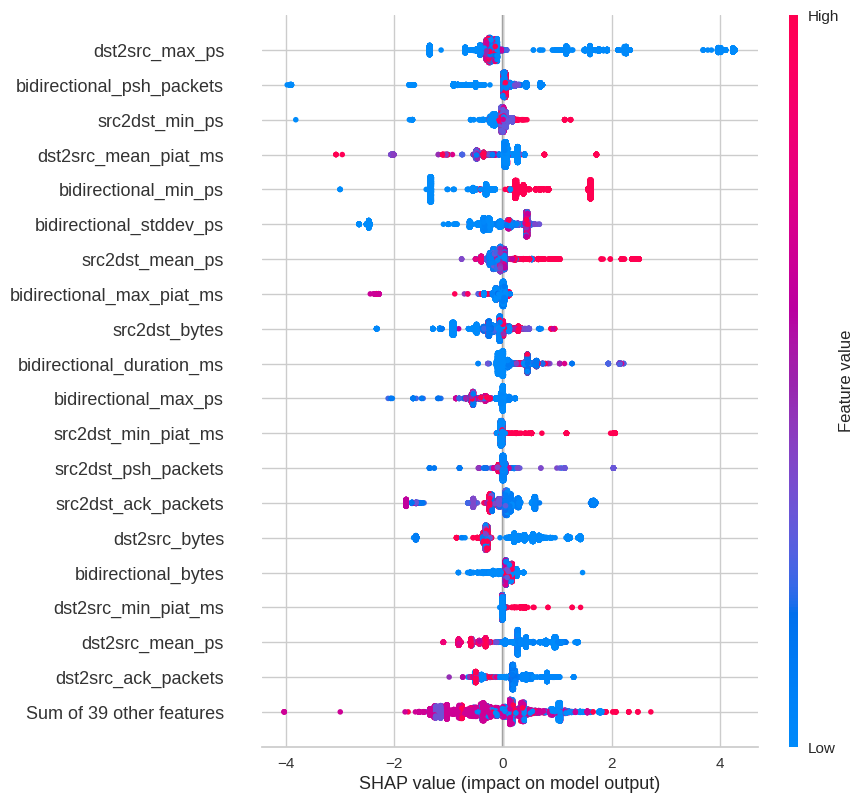

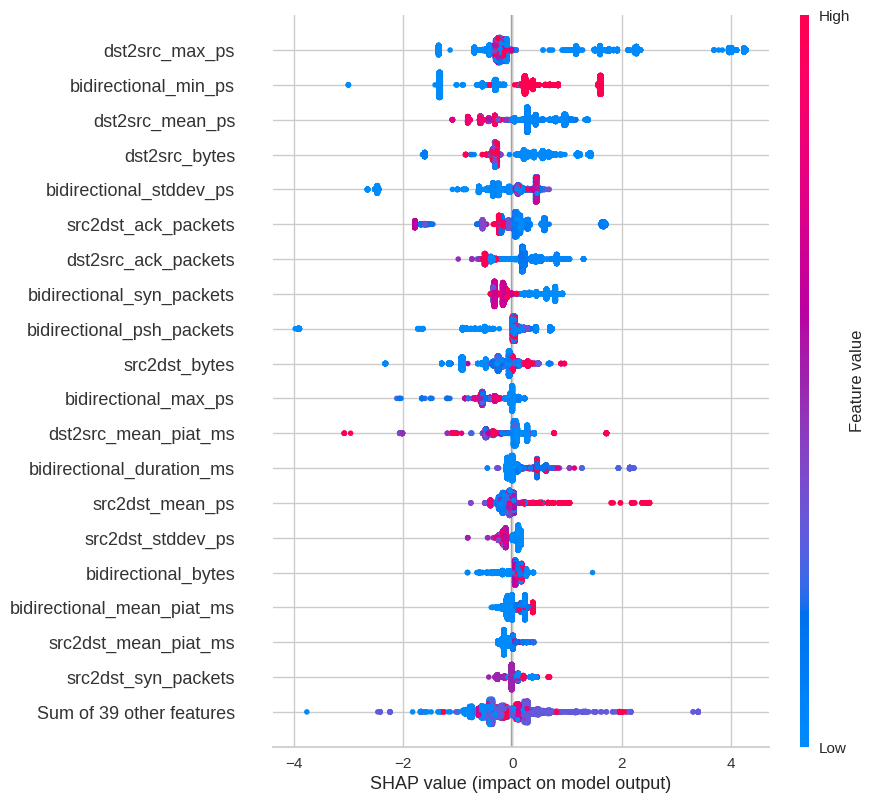

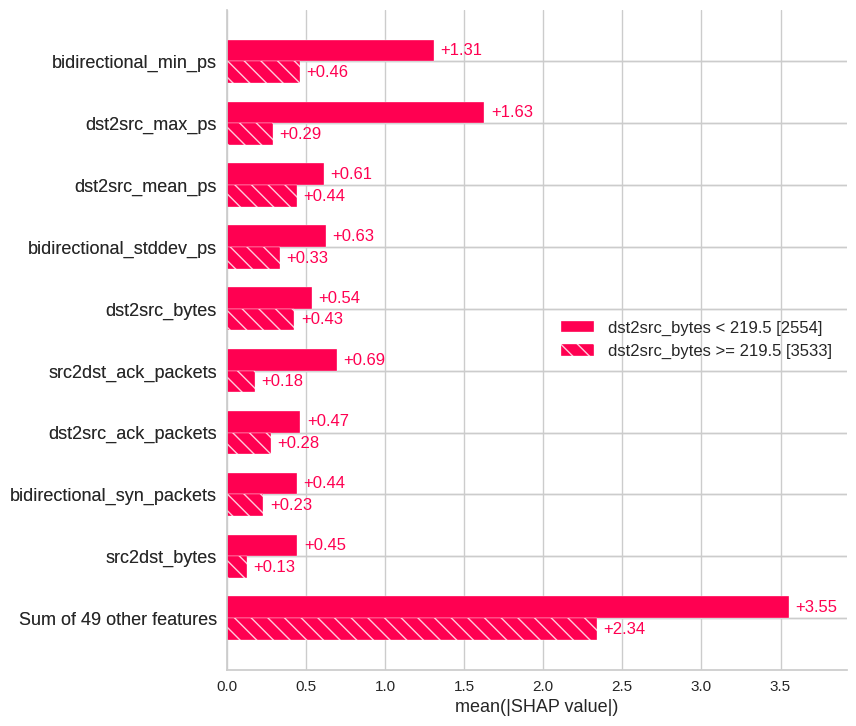

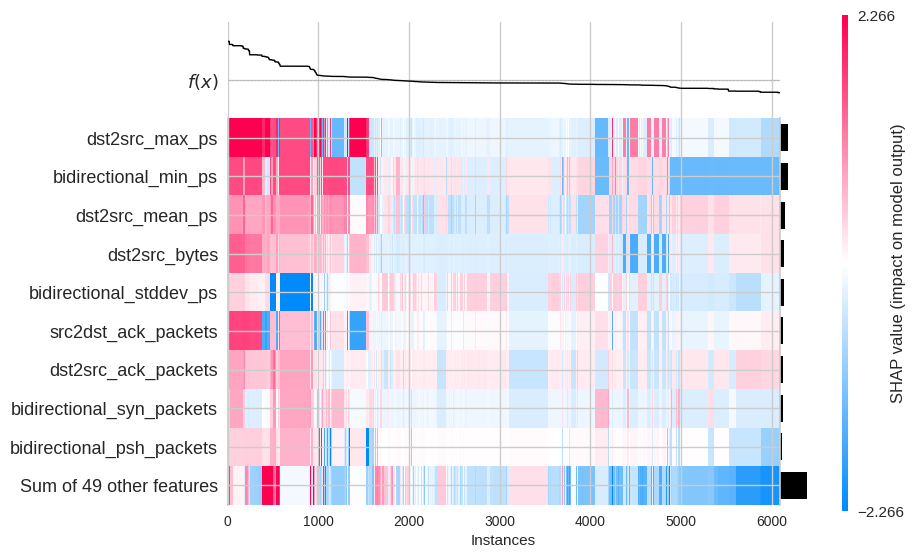

In [27]:
make_plot(5)

## DoS slowloris shap

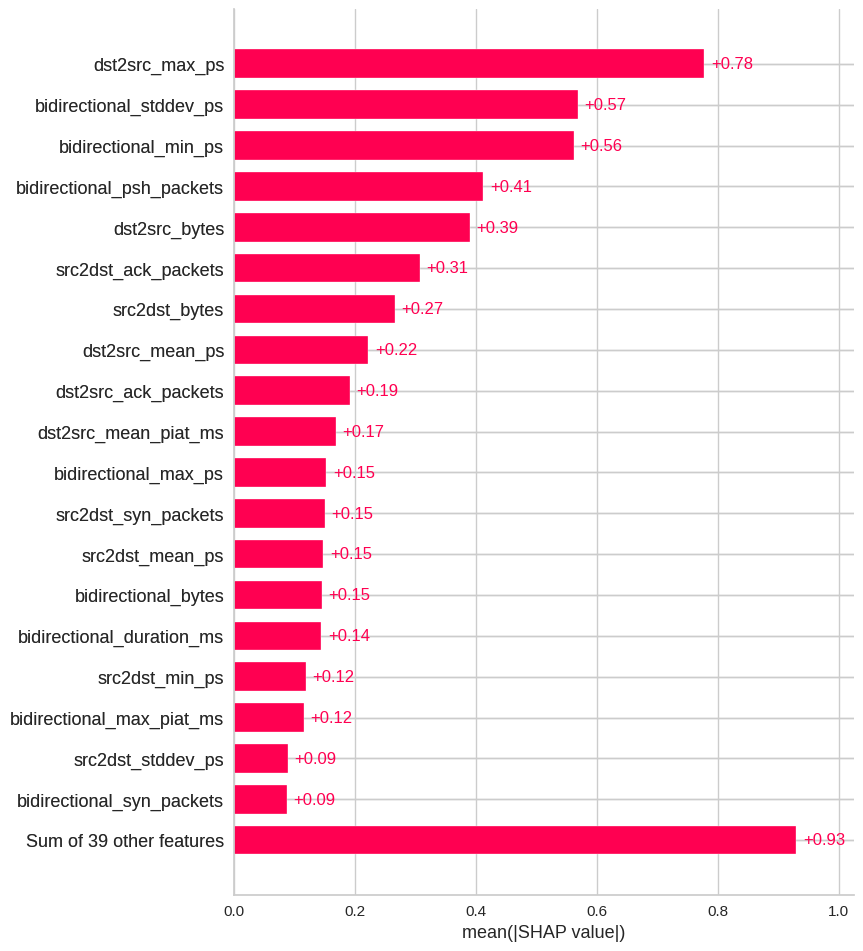

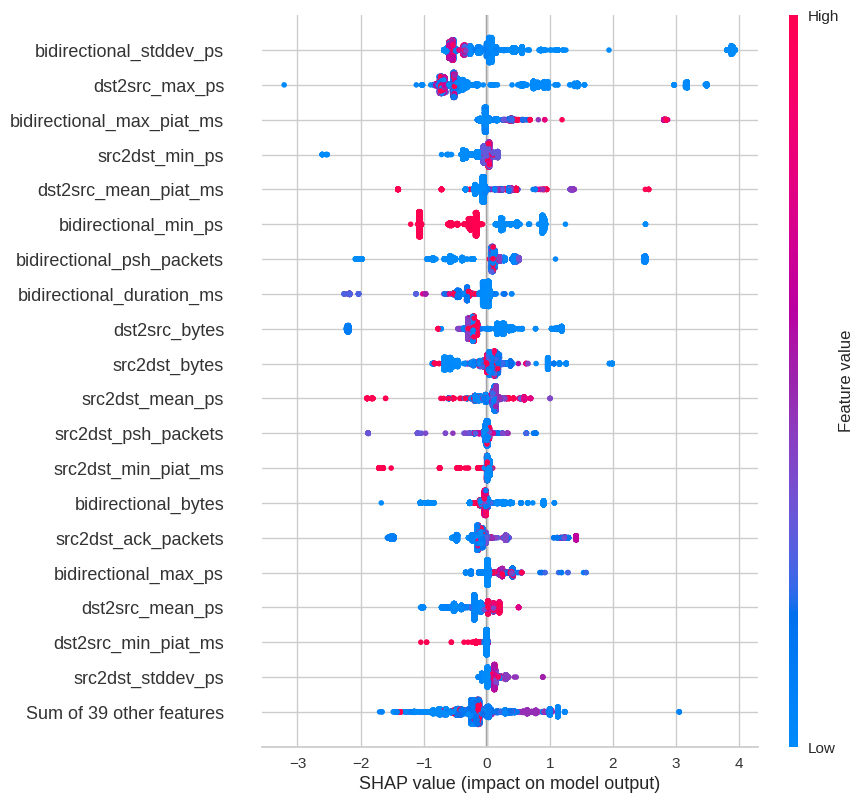

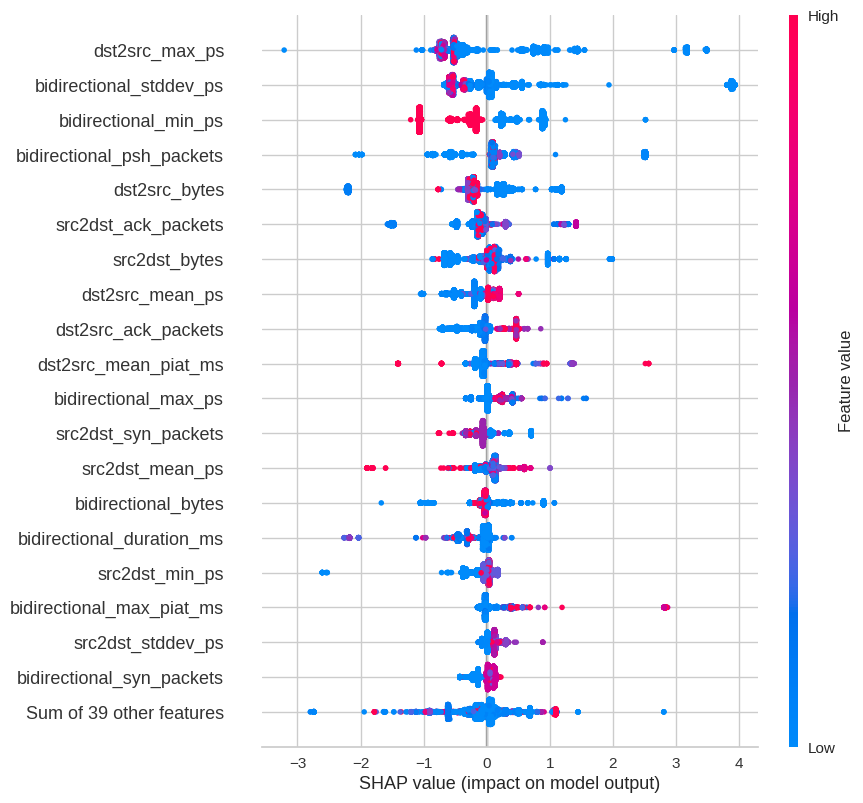

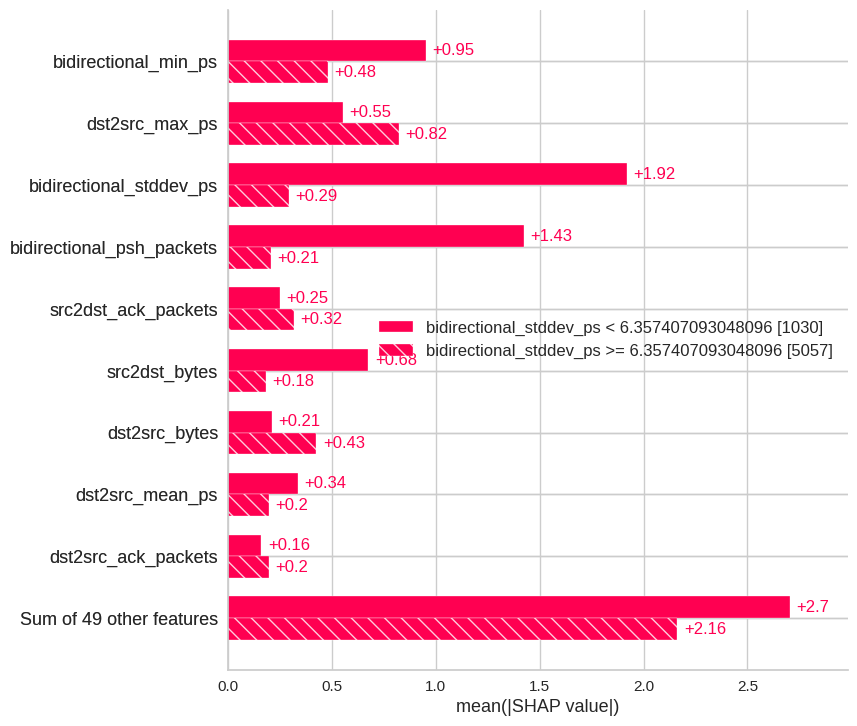

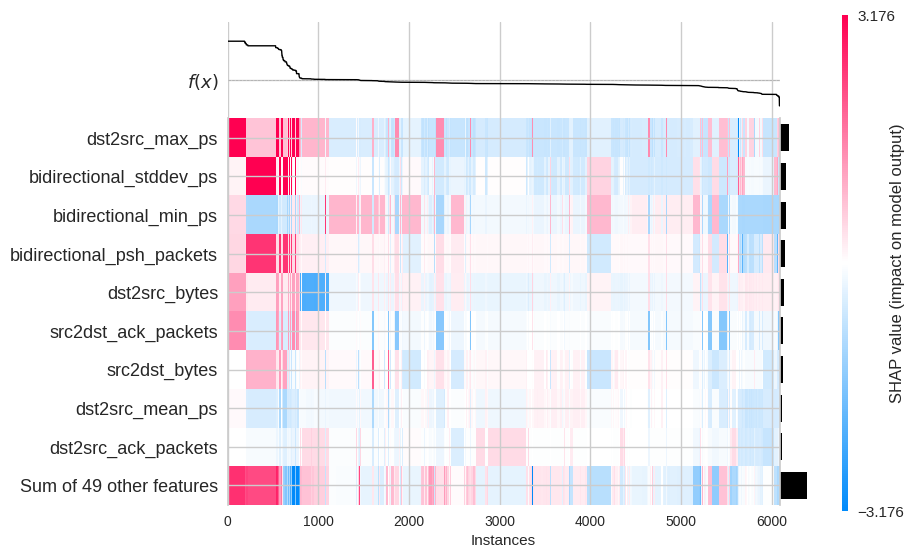

In [28]:
make_plot(6)

## FTP-Patator shap

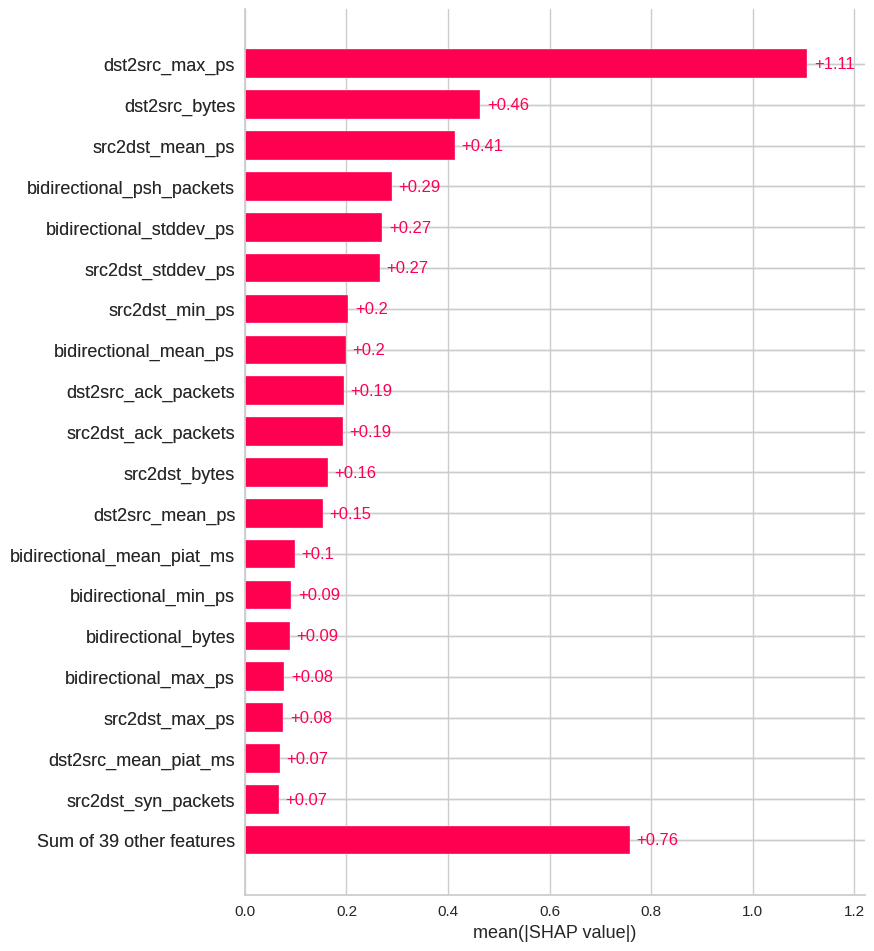

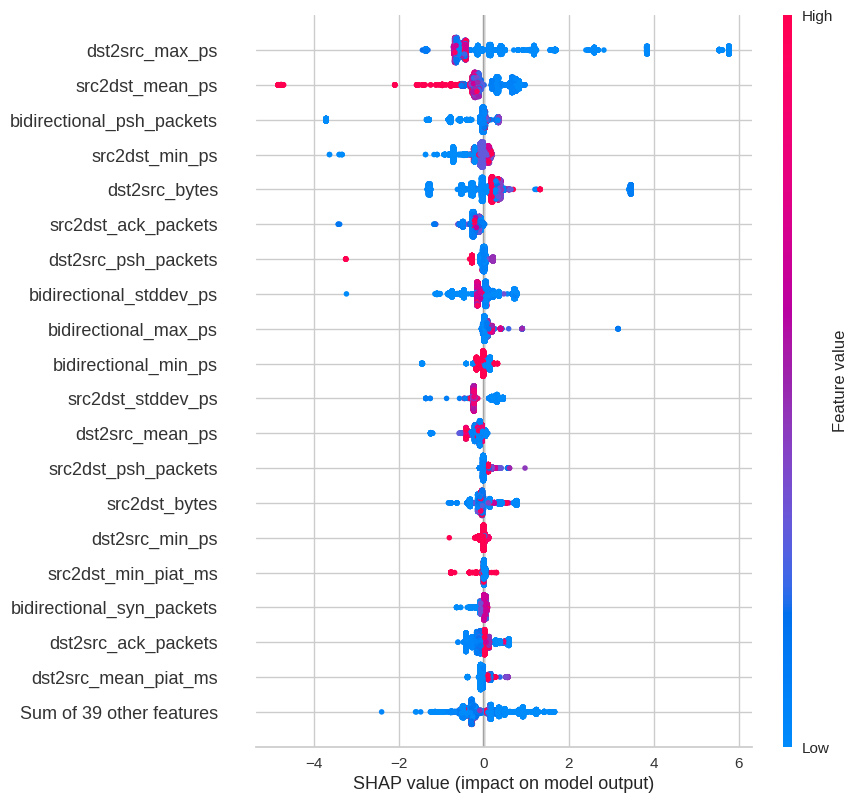

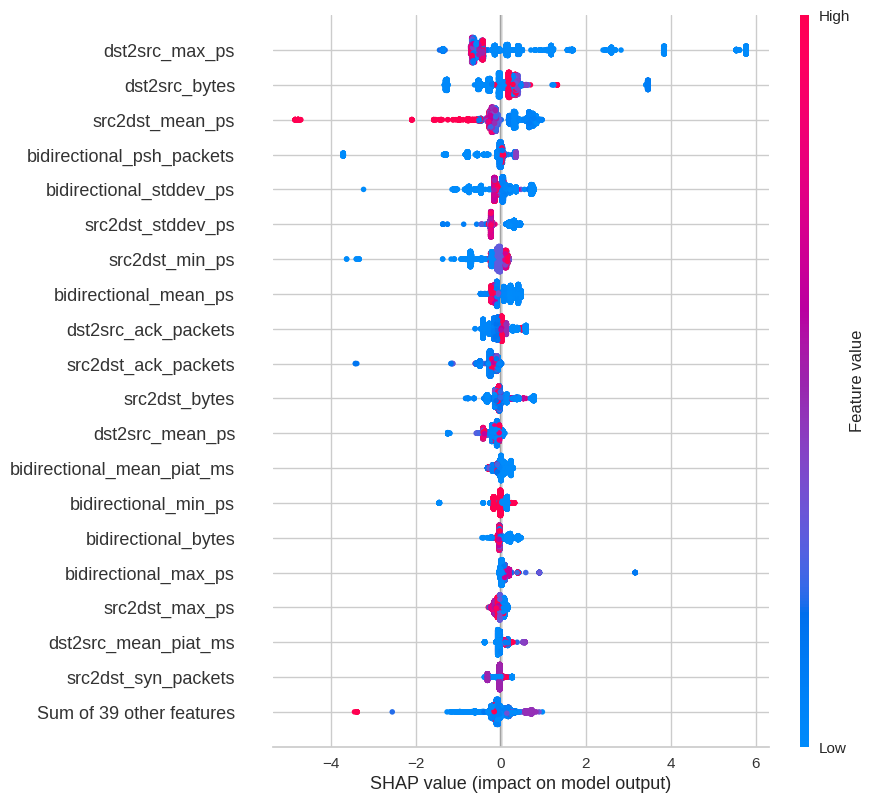

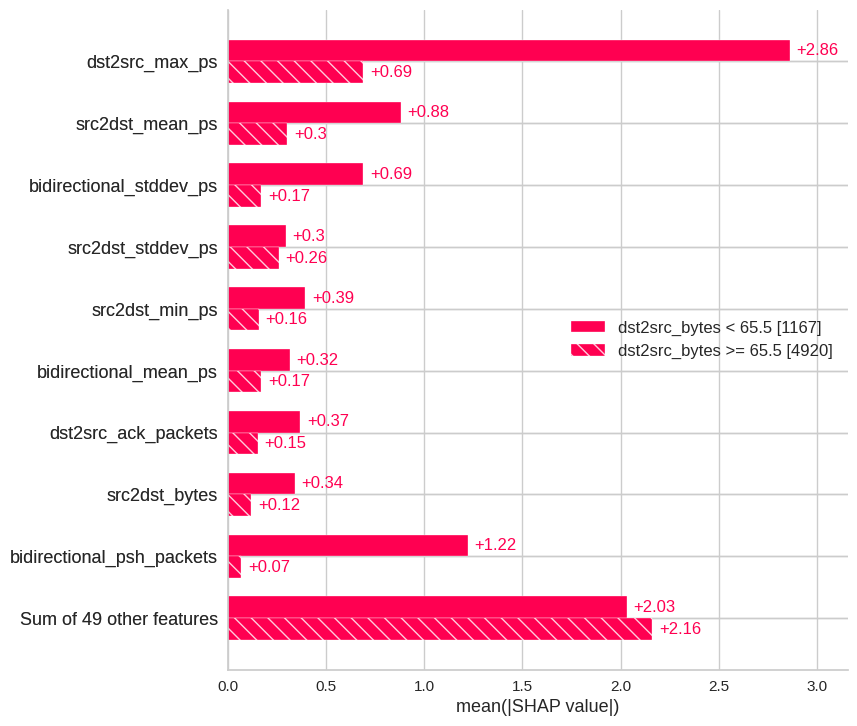

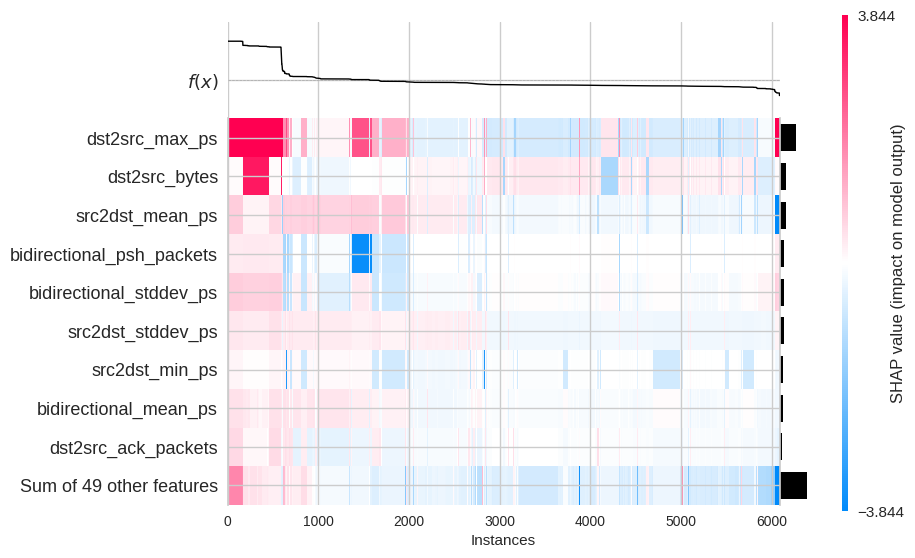

In [29]:
make_plot(7)

## Heartbleed shap

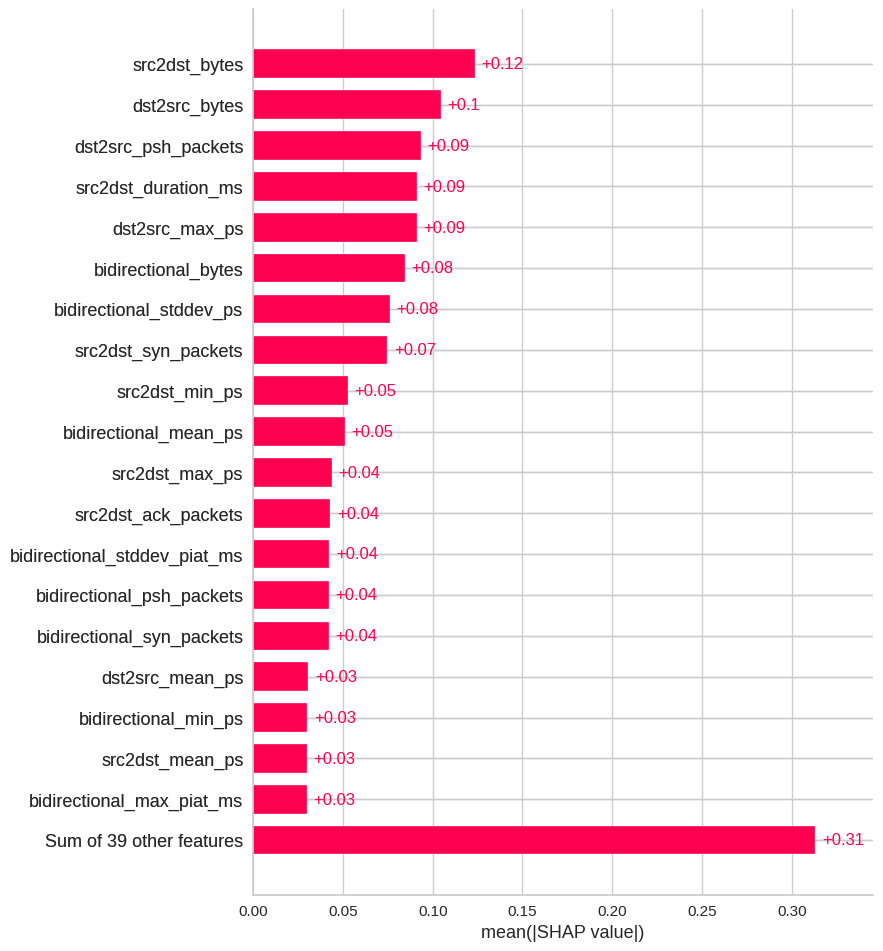

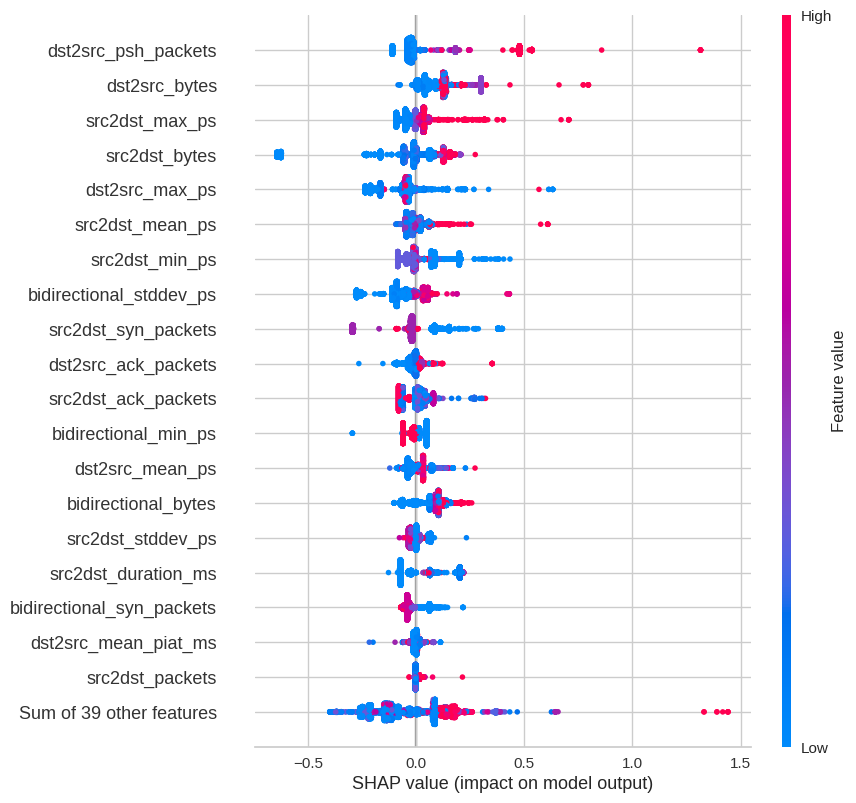

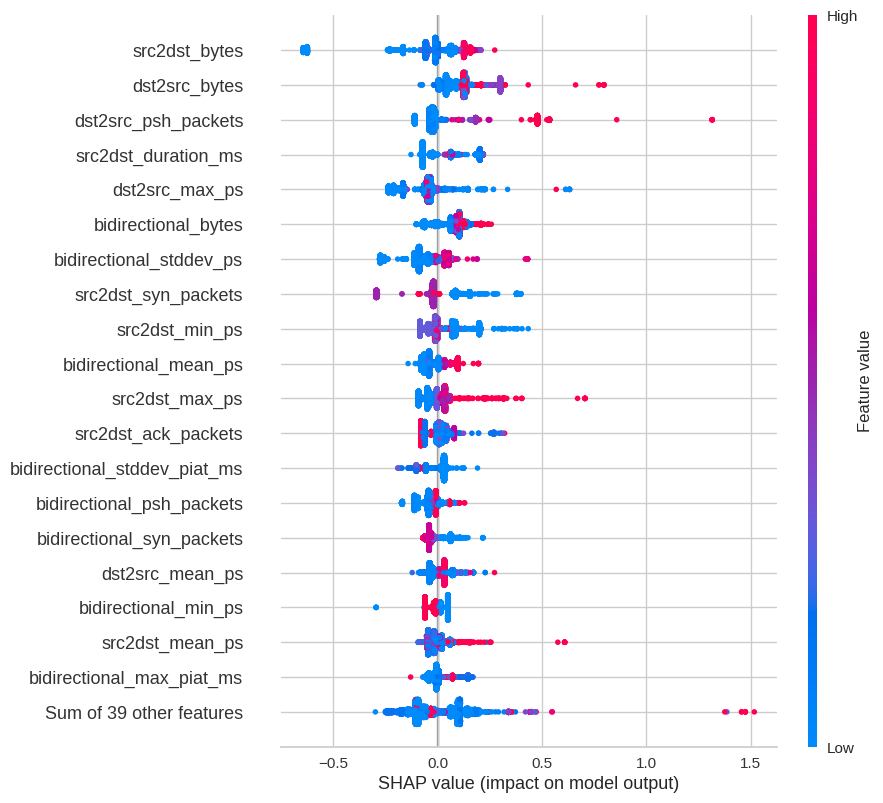

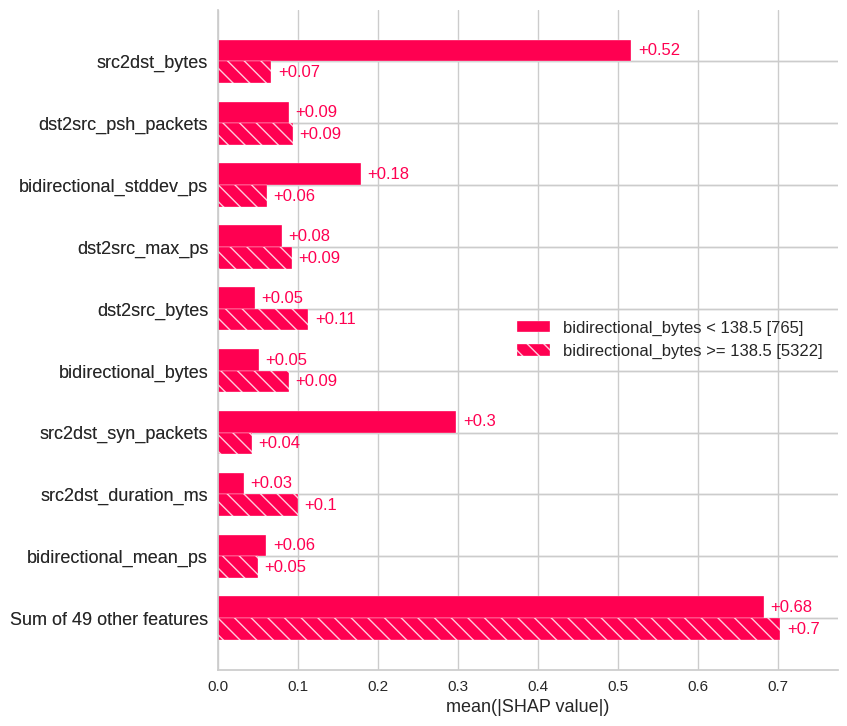

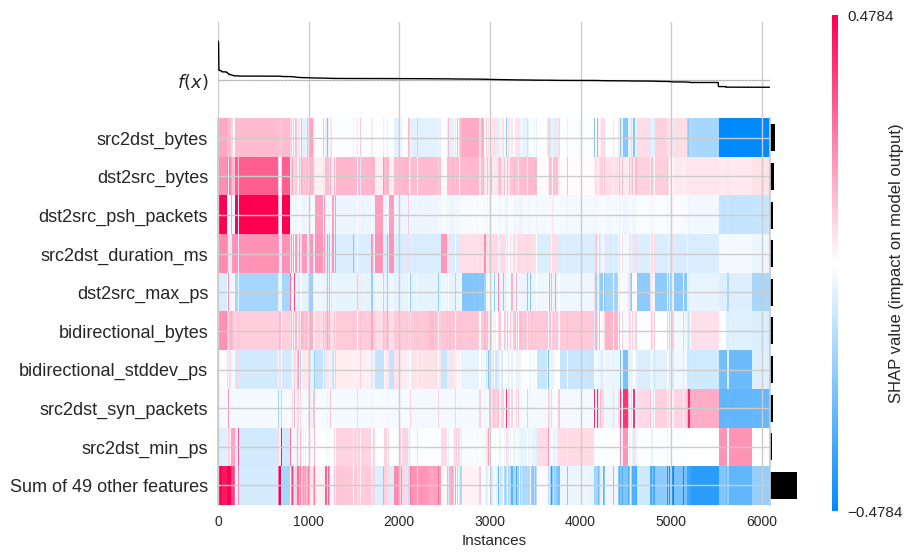

In [30]:
make_plot(8)

## Infiltration shap

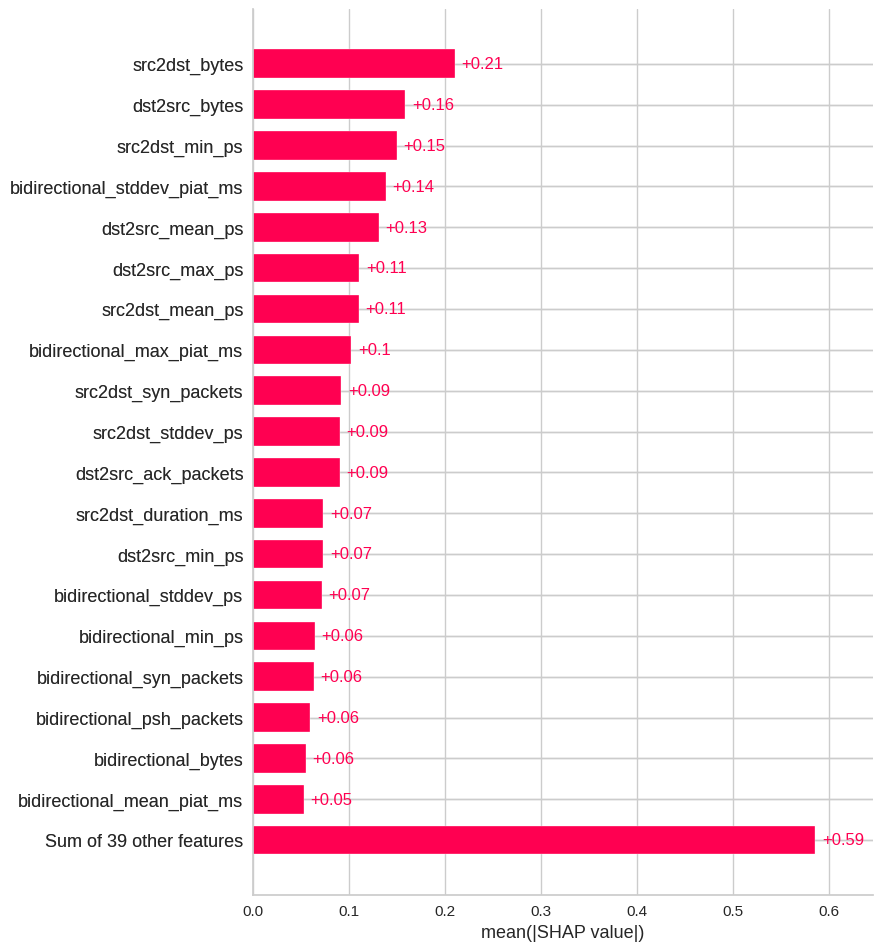

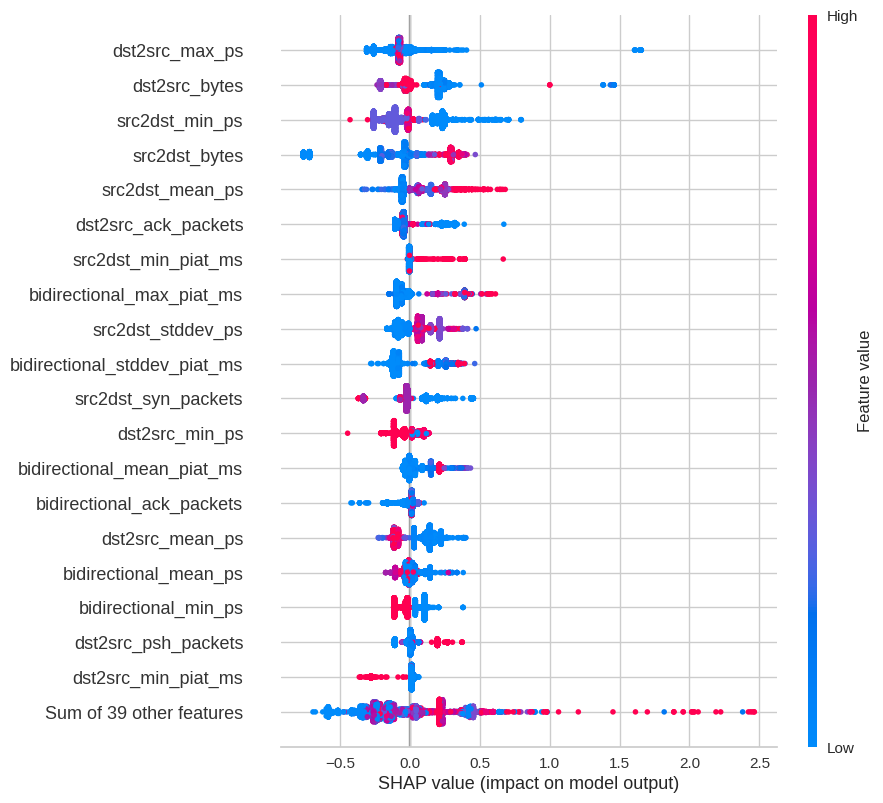

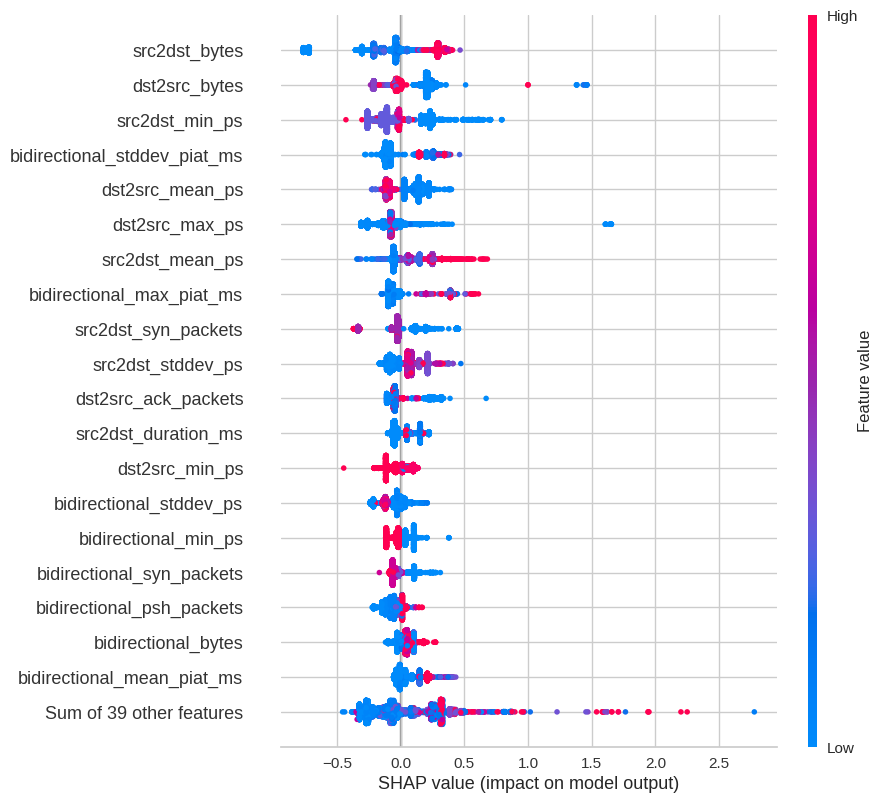

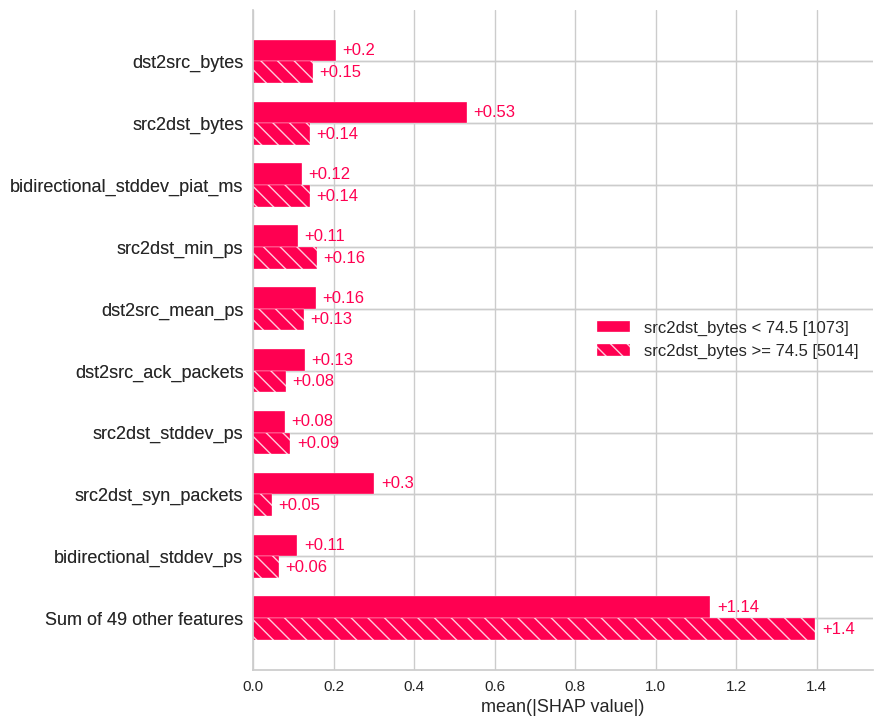

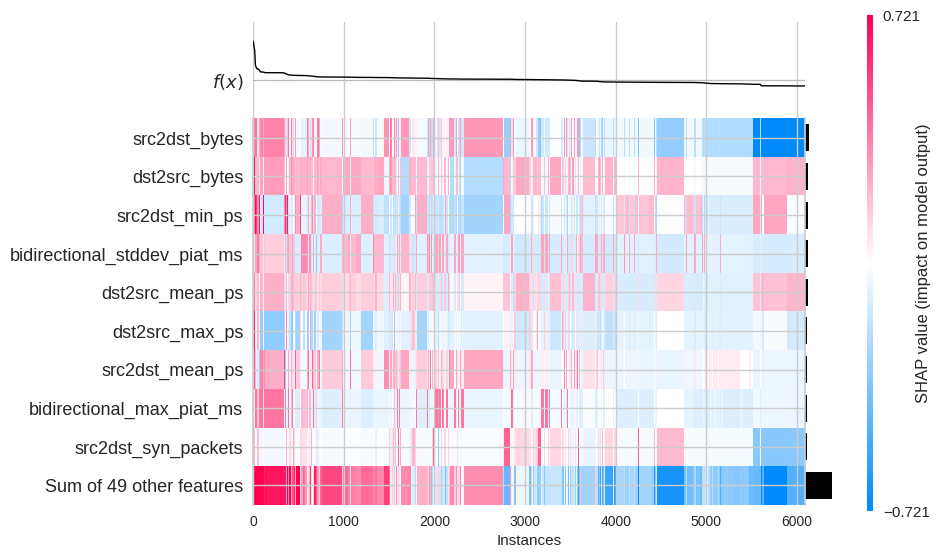

In [31]:
make_plot(9)

## PortScan shap

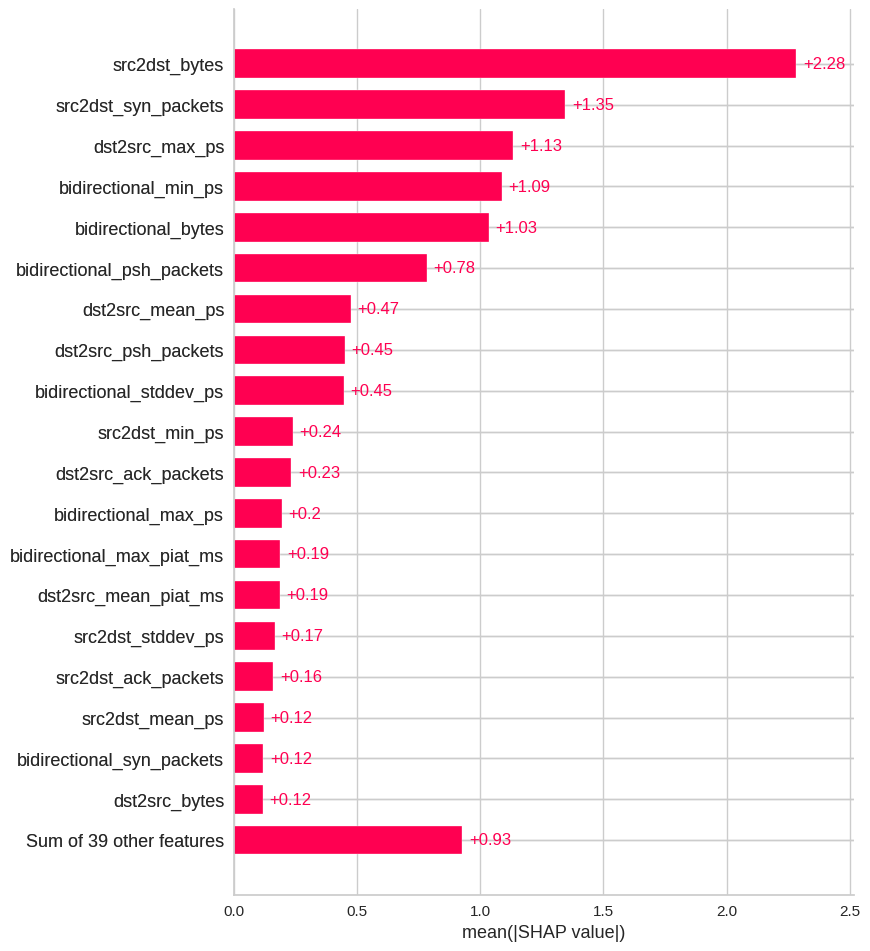

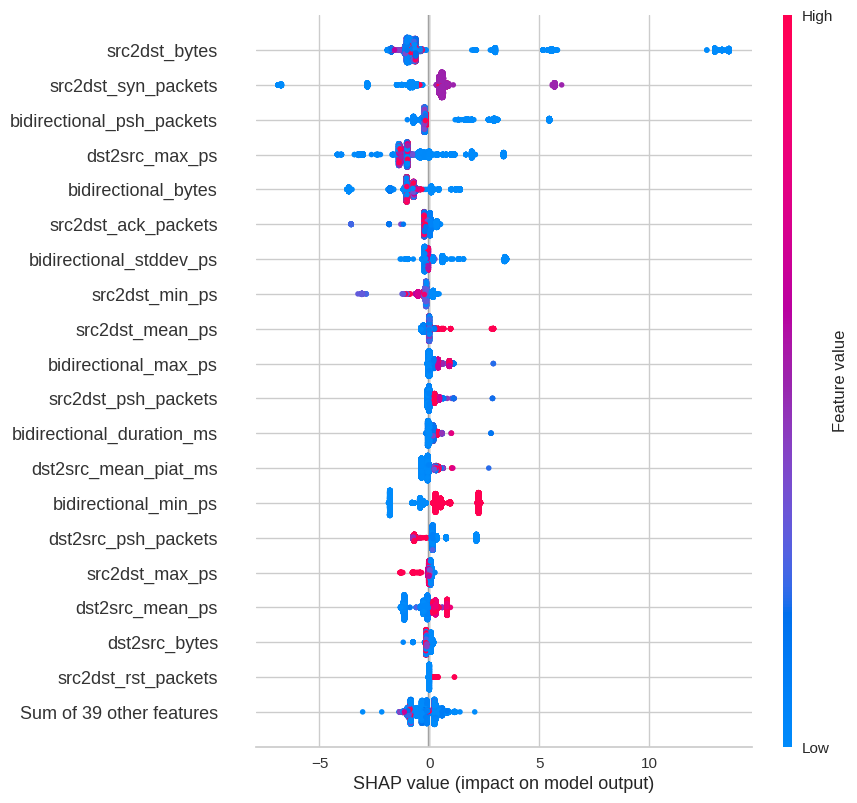

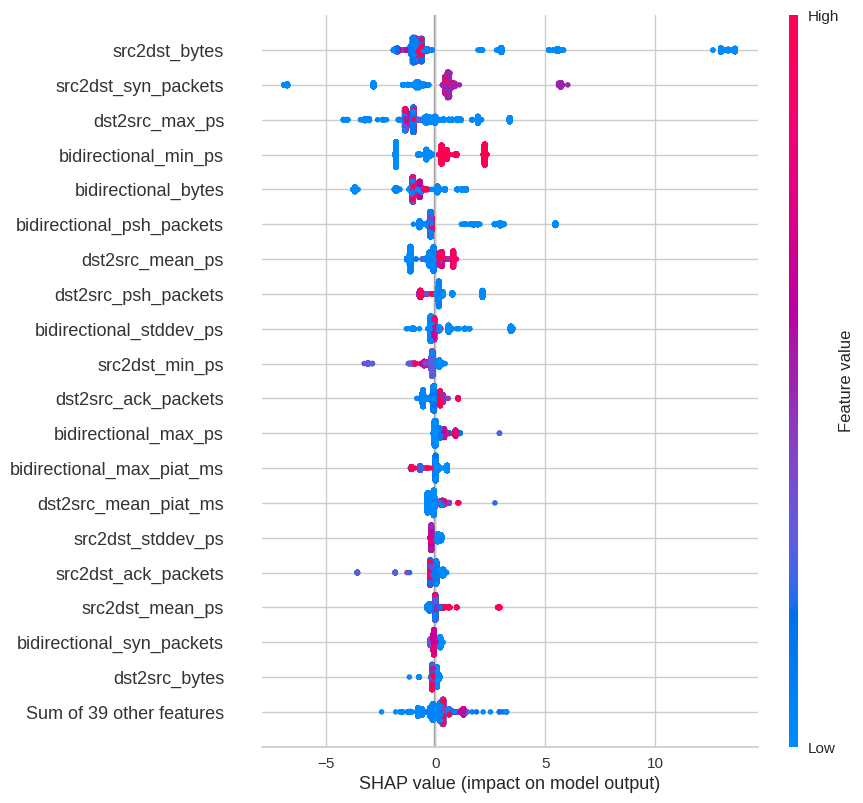

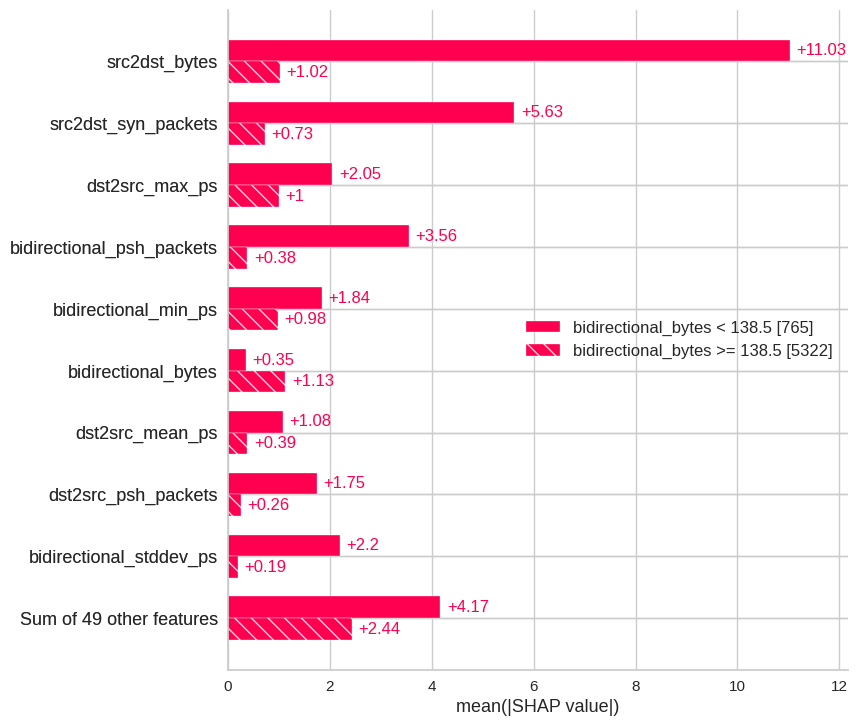

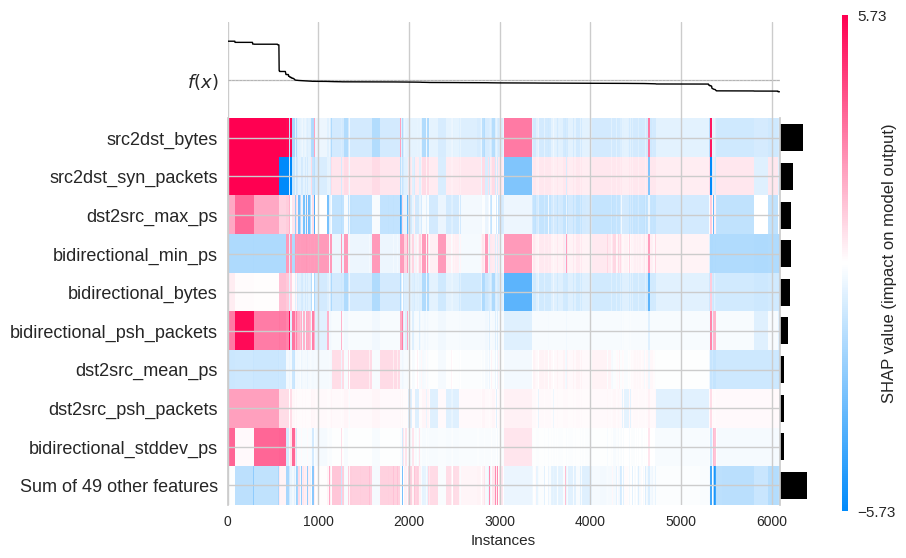

In [32]:
make_plot(10)

## SSH-Patator shap

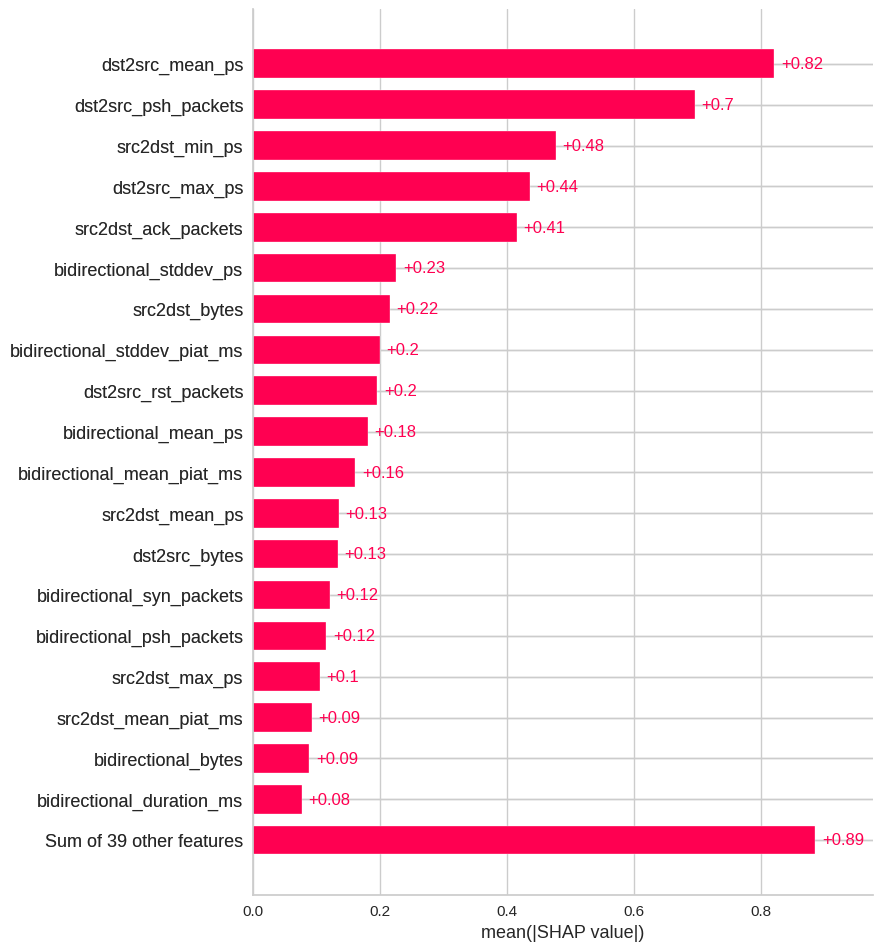

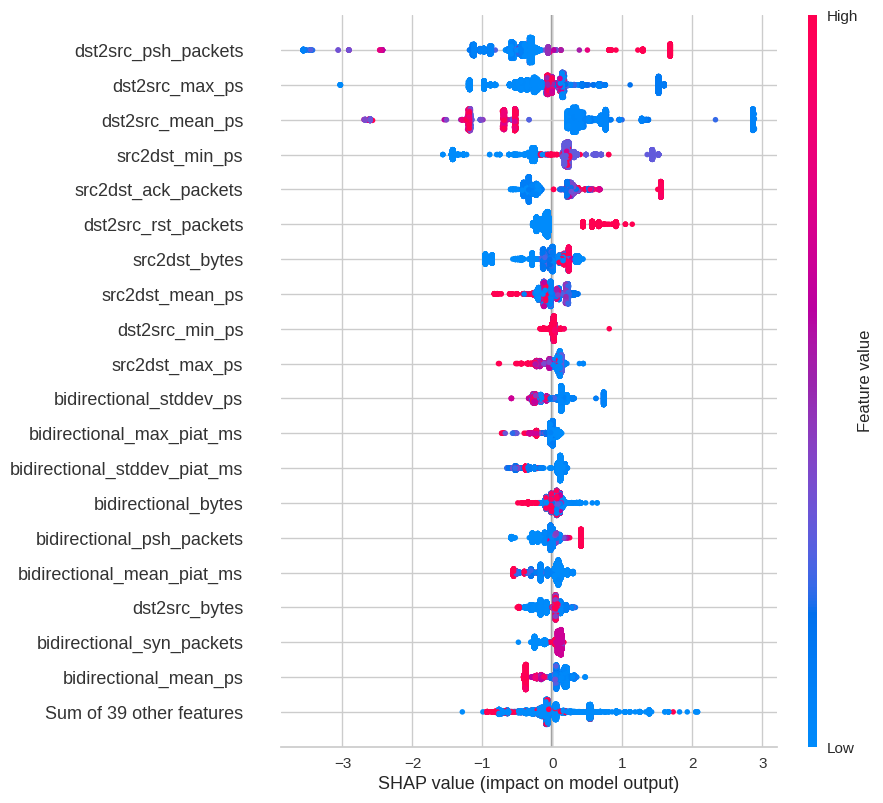

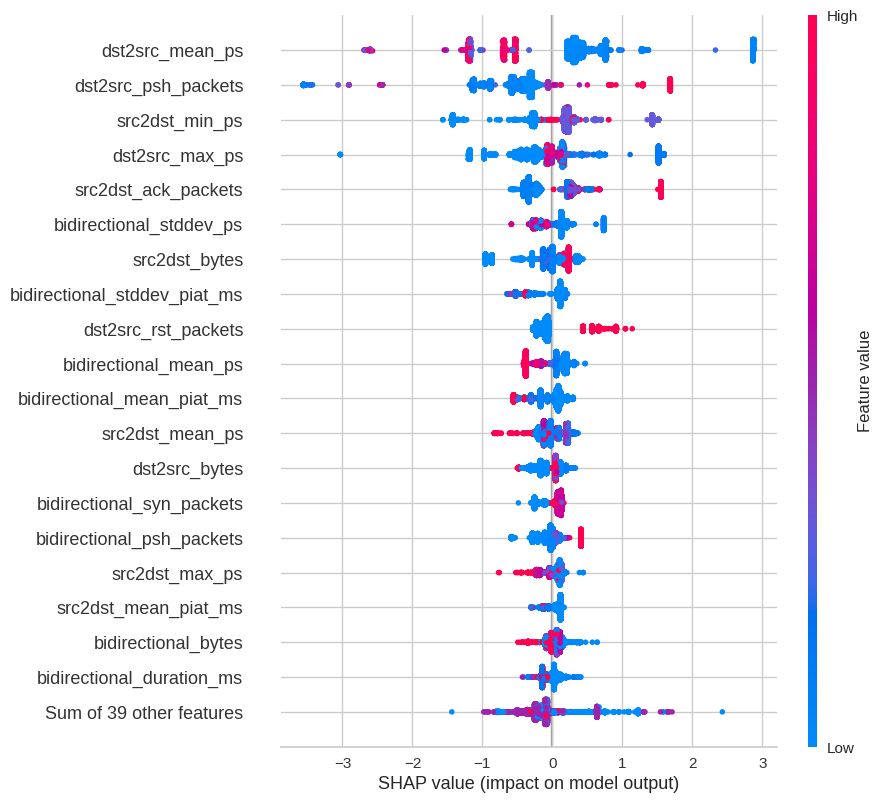

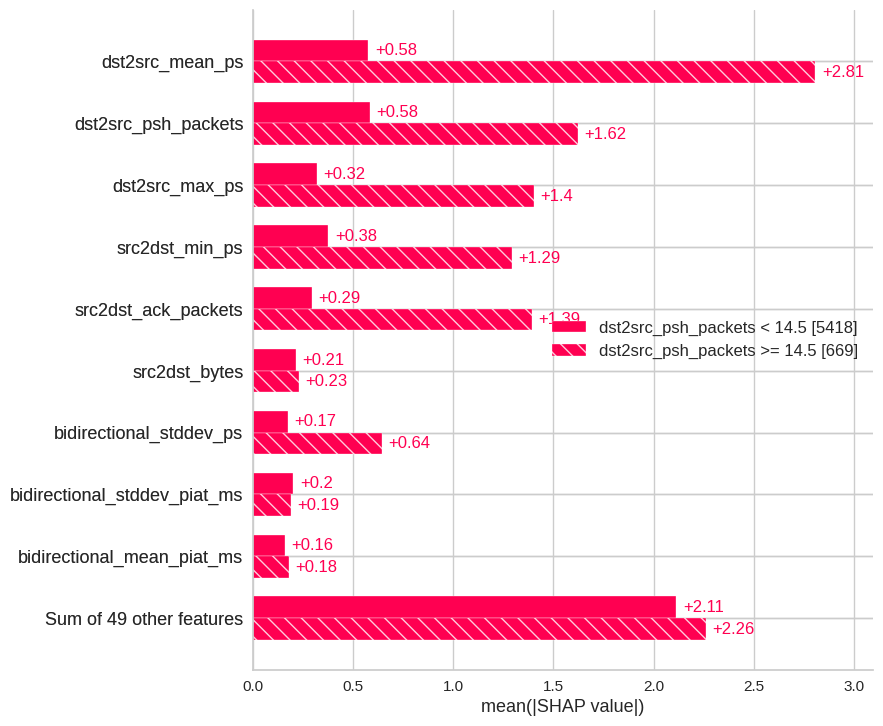

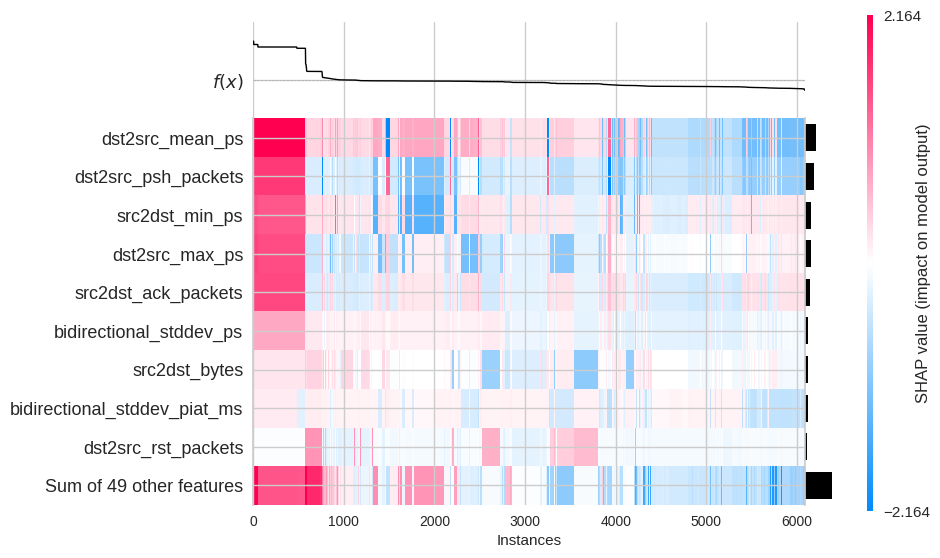

In [33]:
make_plot(11)

## Web Attack - Brute Force shap

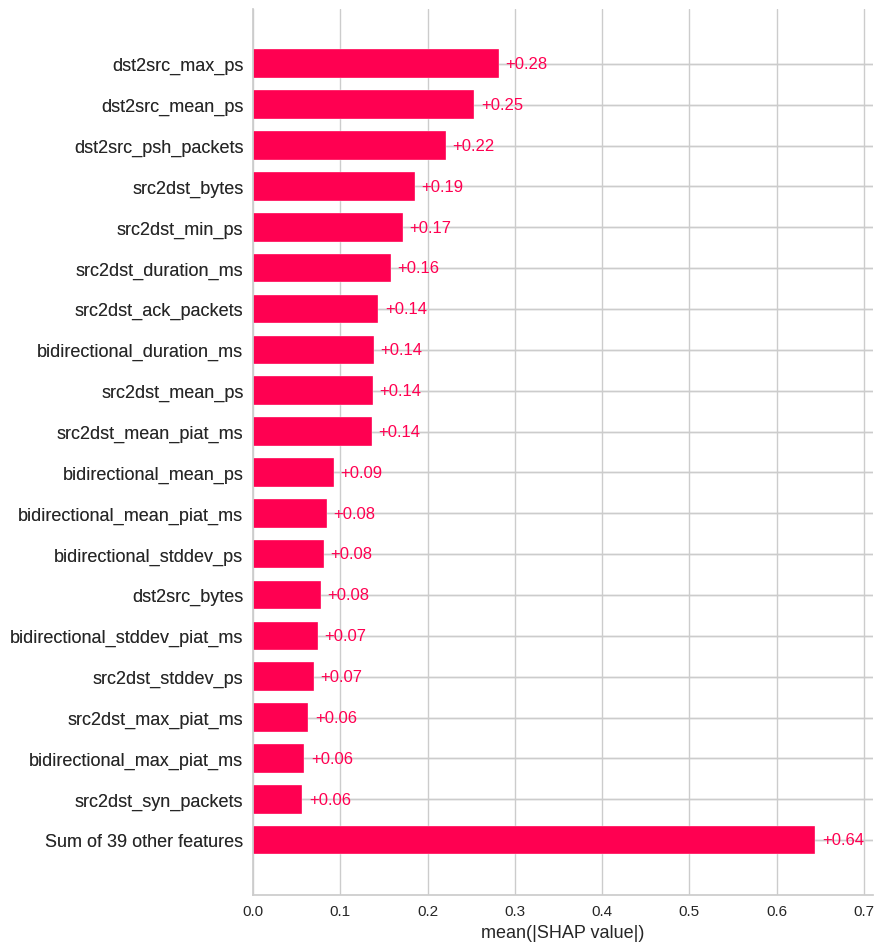

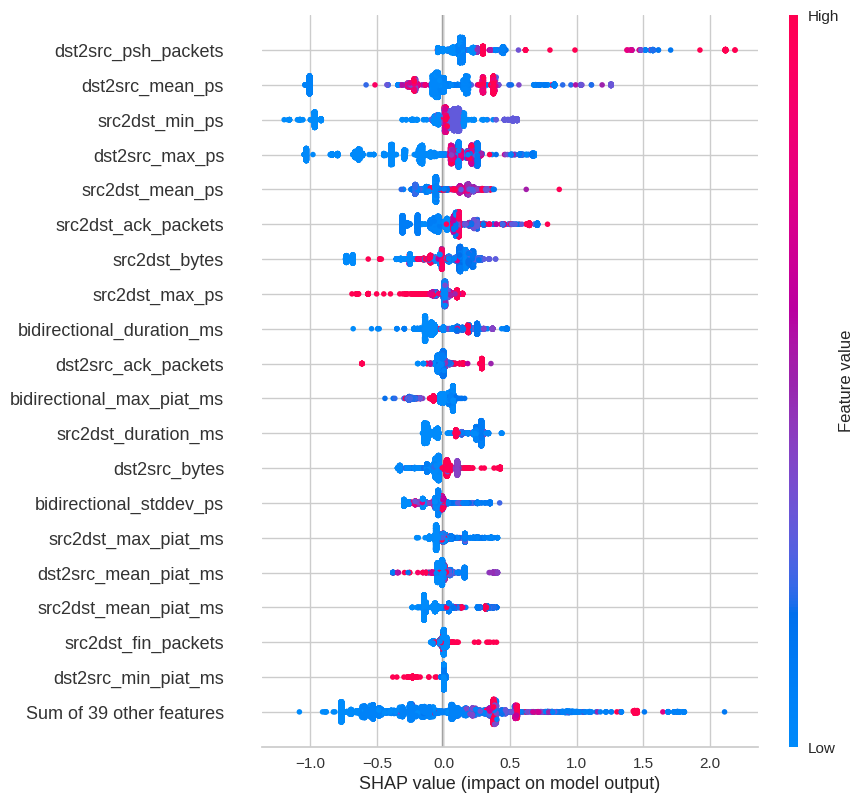

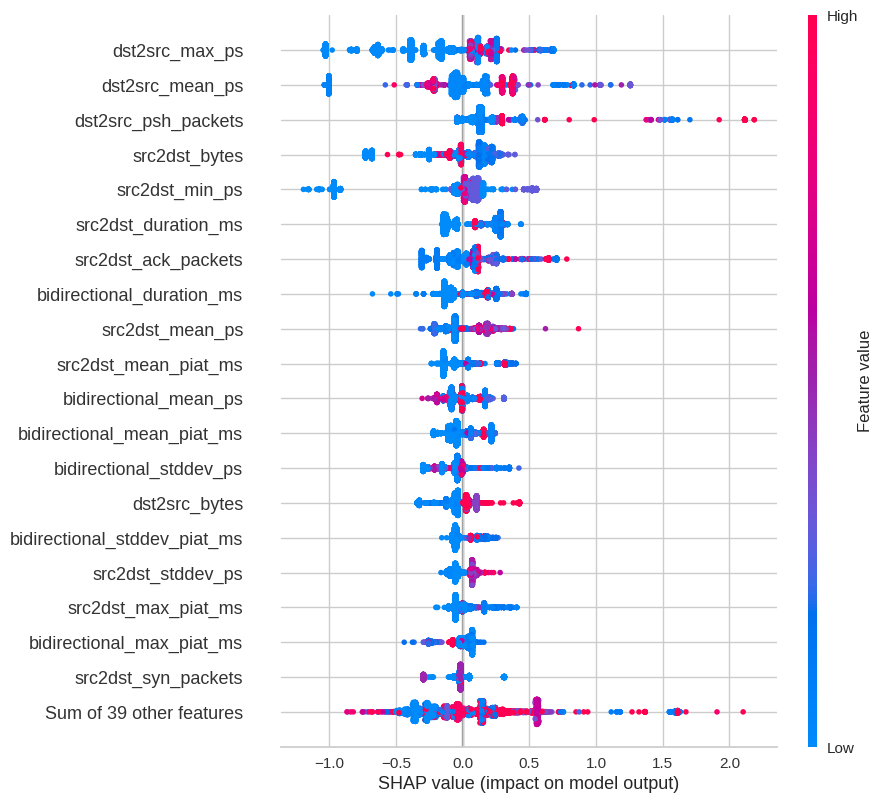

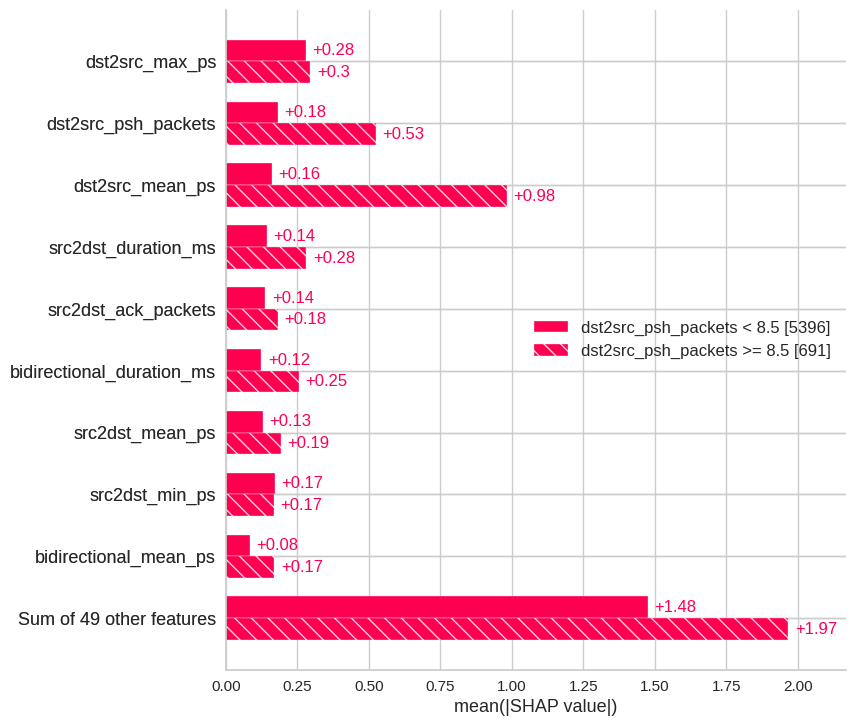

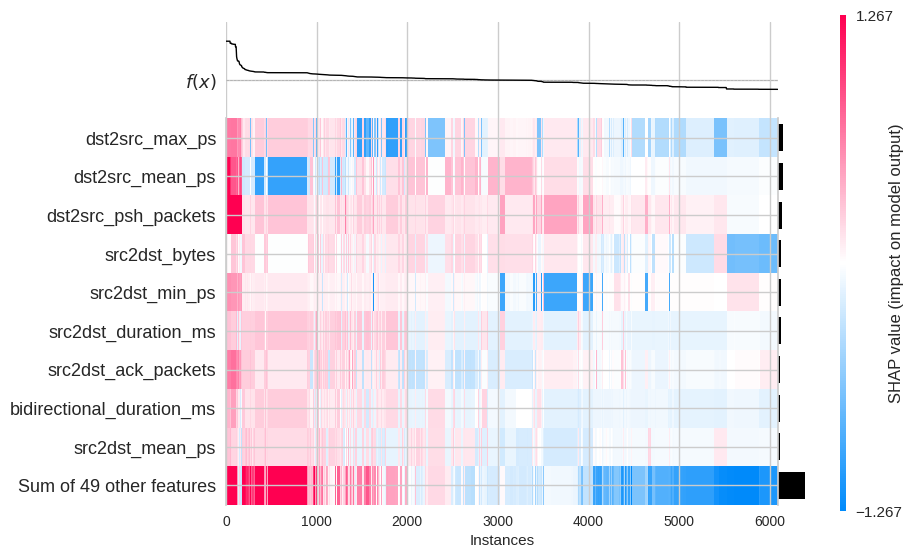

In [34]:
make_plot(12)

## Web Attack - Sql Injection shap

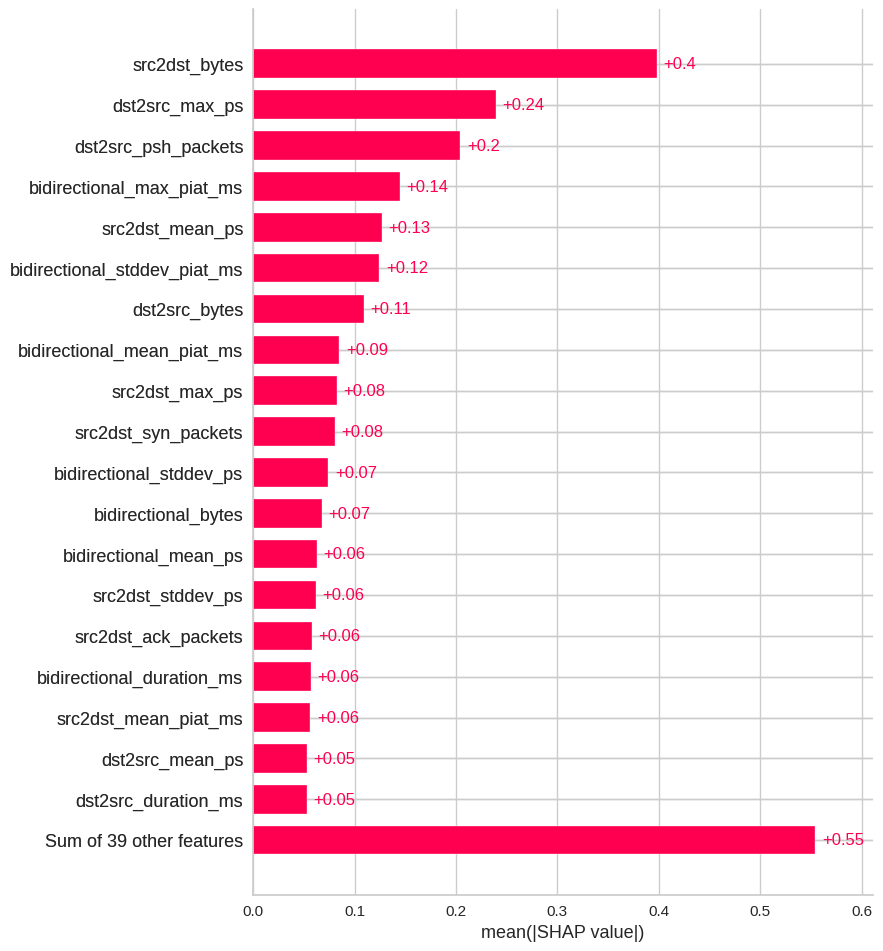

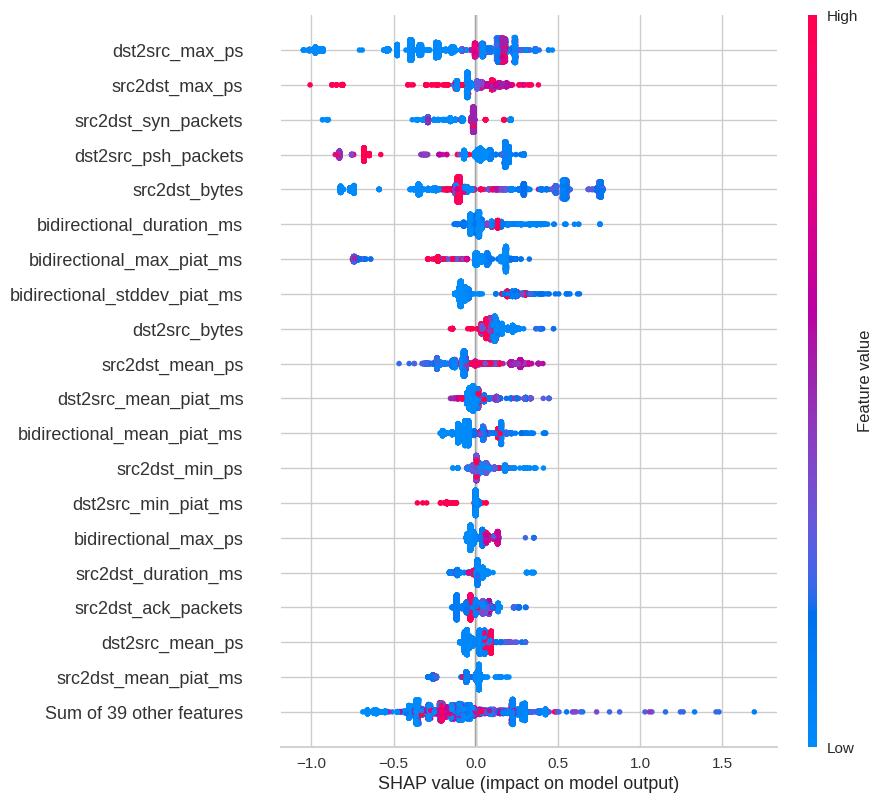

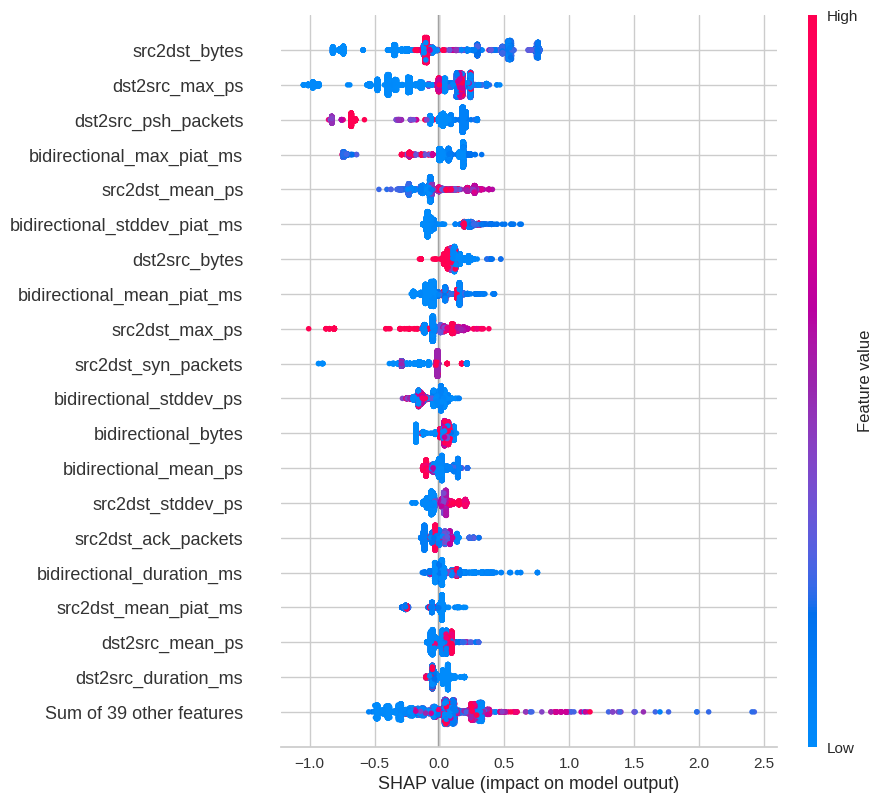

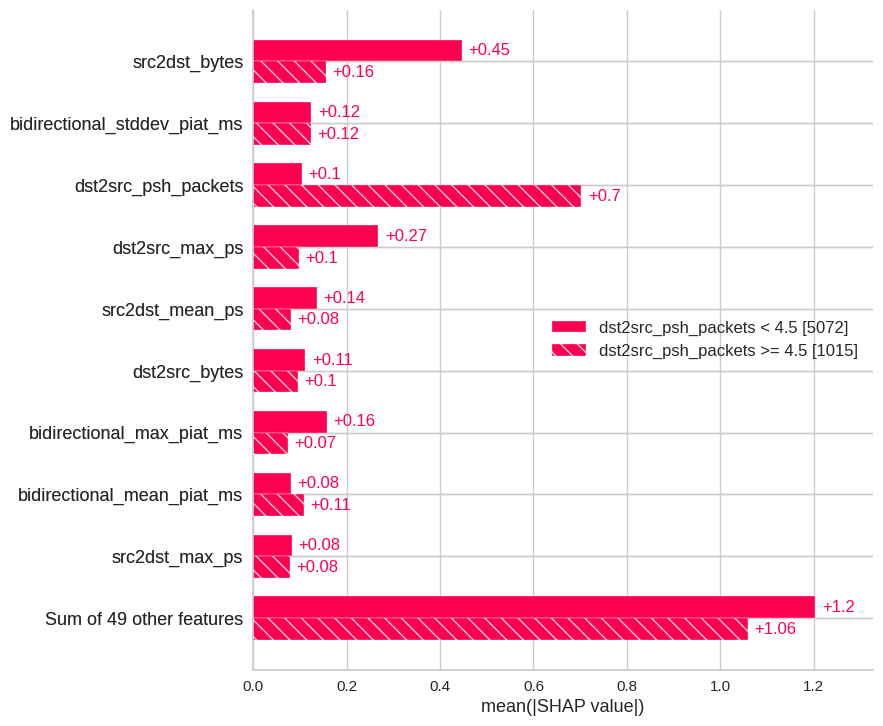

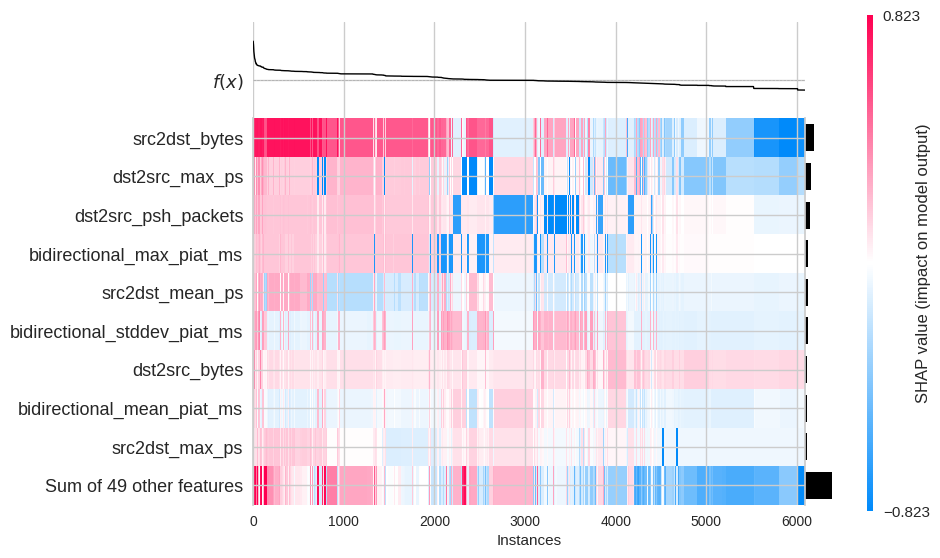

In [35]:
make_plot(13)

## Web Attack - XSS shap

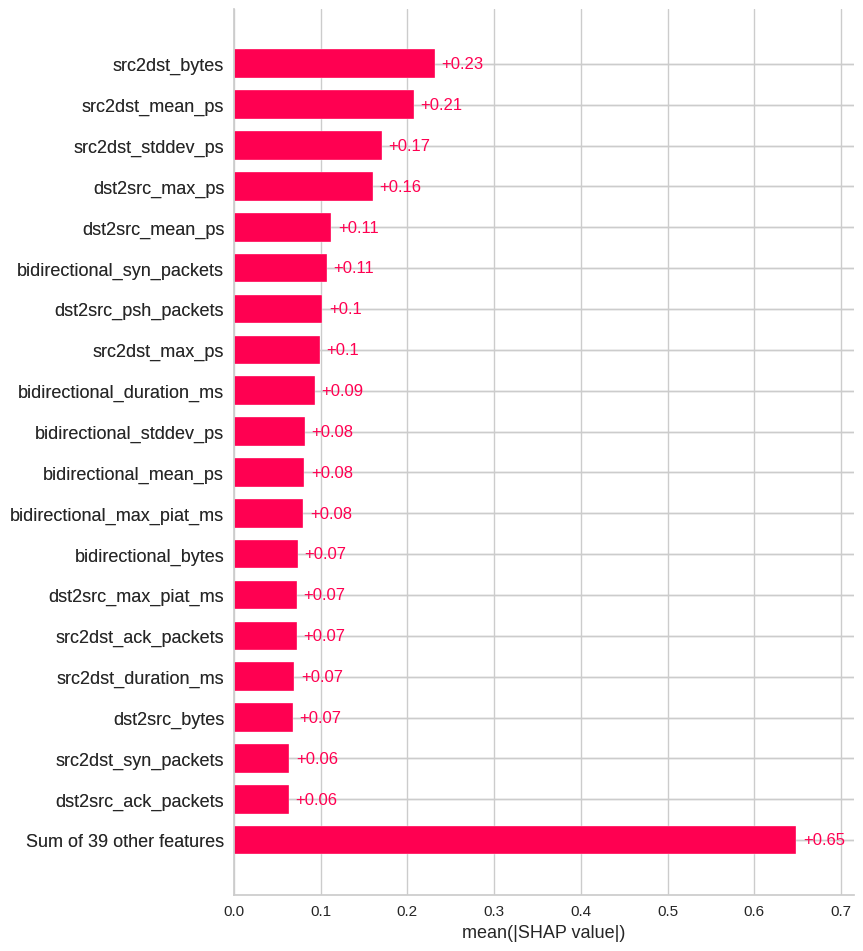

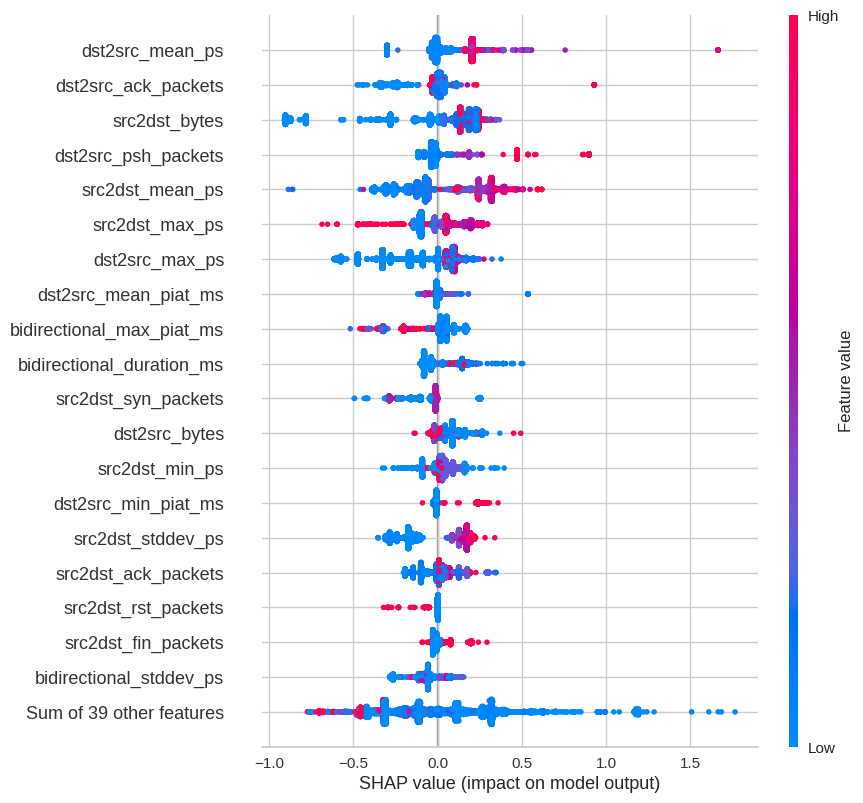

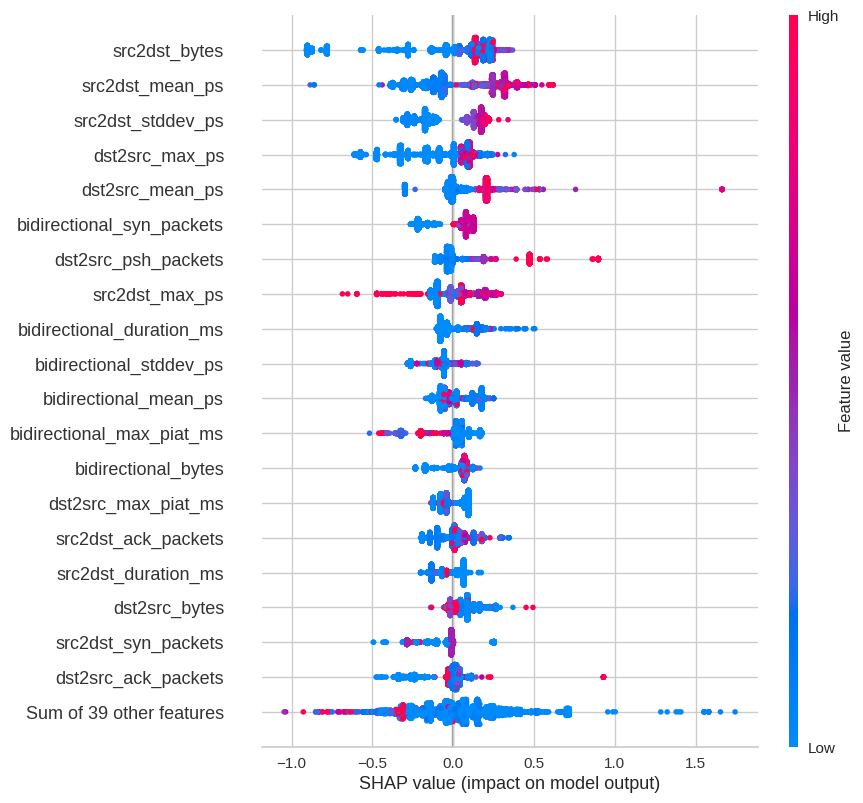

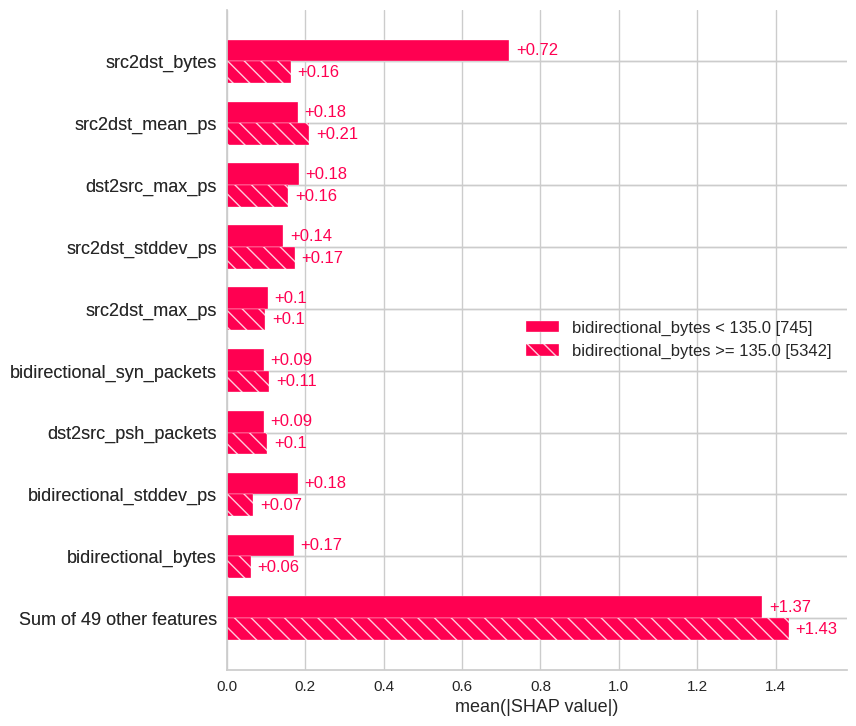

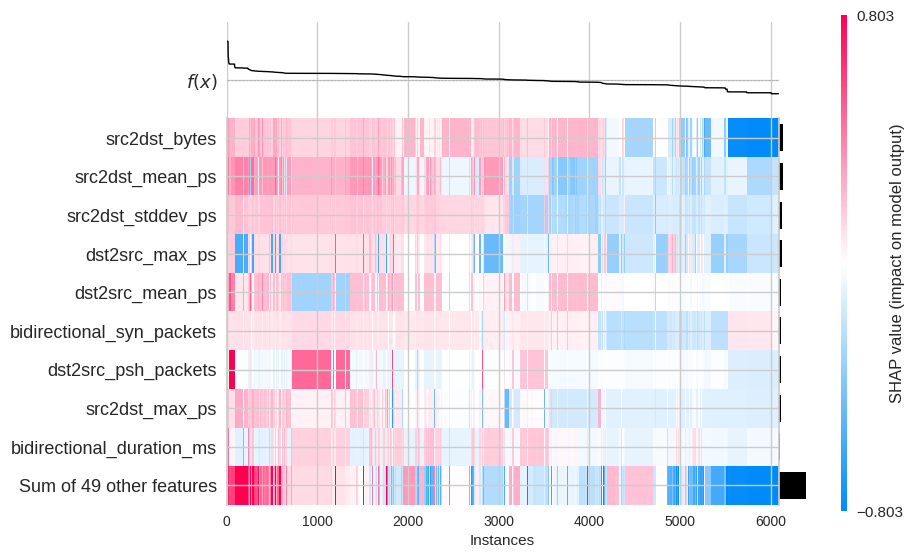

In [36]:
make_plot(14)

## Overall importance

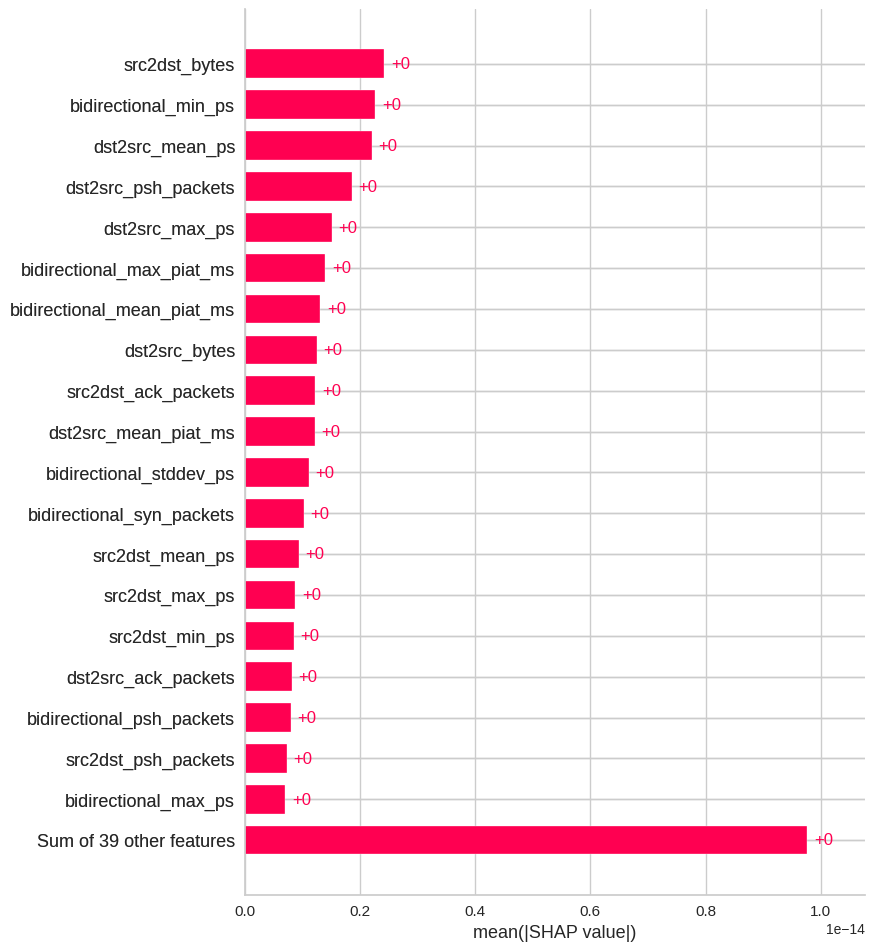

In [37]:
exp = Explanation(sv.values.mean(2), 
                  sv.base_values.mean(1), 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

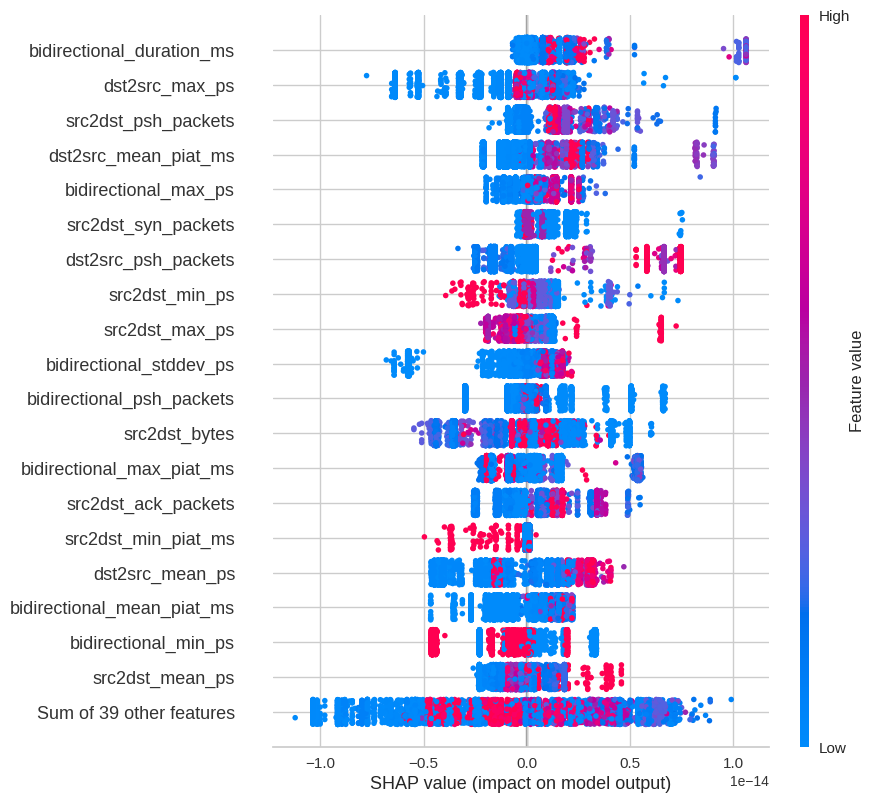

In [38]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

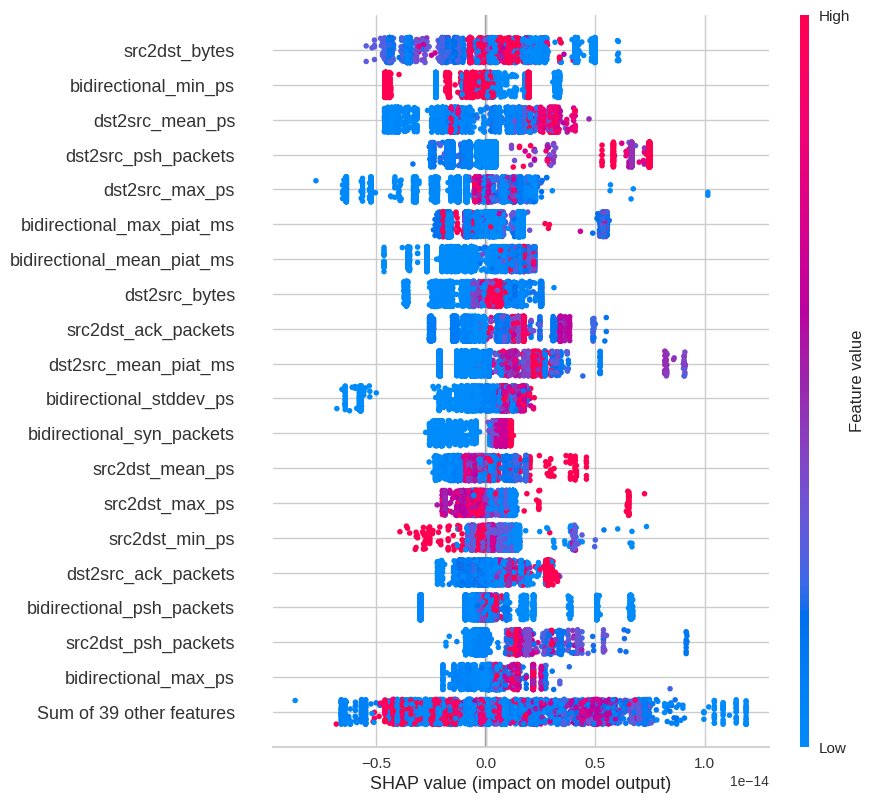

In [39]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Zero day test

In [40]:
classes = sorted(pd.unique(ds['label']).tolist())

In [41]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Bot']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.4093449	total: 164ms	remaining: 6.41s
1:	learn: 0.2887016	total: 340ms	remaining: 6.45s
2:	learn: 0.2045163	total: 523ms	remaining: 6.45s
3:	learn: 0.1543619	total: 712ms	remaining: 6.41s
4:	learn: 0.1335555	total: 898ms	remaining: 6.29s
5:	learn: 0.1061380	total: 1.08s	remaining: 6.14s
6:	learn: 0.0996021	total: 1.26s	remaining: 5.96s
7:	learn: 0.0938264	total: 1.45s	remaining: 5.79s
8:	learn: 0.0878607	total: 1.64s	remaining: 5.64s
9:	learn: 0.0838016	total: 1.82s	remaining: 5.47s
10:	learn: 0.0750539	total: 2.01s	remaining: 5.29s
11:	learn: 0.0700618	total: 2.19s	remaining: 5.11s
12:	learn: 0.0661452	total: 2.38s	remaining: 4.93s
13:	learn: 0.0623810	total: 2.56s	remaining: 4.76s
14:	learn: 0.0576479	total: 2.75s	remaining: 4.58s
15:	learn: 0.0557460	total: 2.94s	remaining: 4.4s
16:	learn: 0.0535460	total: 3.12s	remaining: 4.22s
17:	learn: 0.0509547	total: 3.32s	remaining: 4.06s
18:	learn: 0.0498400	total: 3.51s	remaining: 3.88s
19:	learn: 0.0476041	total: 3.69s	remainin

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.992359,0.885677
1,PRECISION,0.992495,0.825092
2,RECALL,0.992359,0.885677
3,F1 SCORE,0.992356,0.848408


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


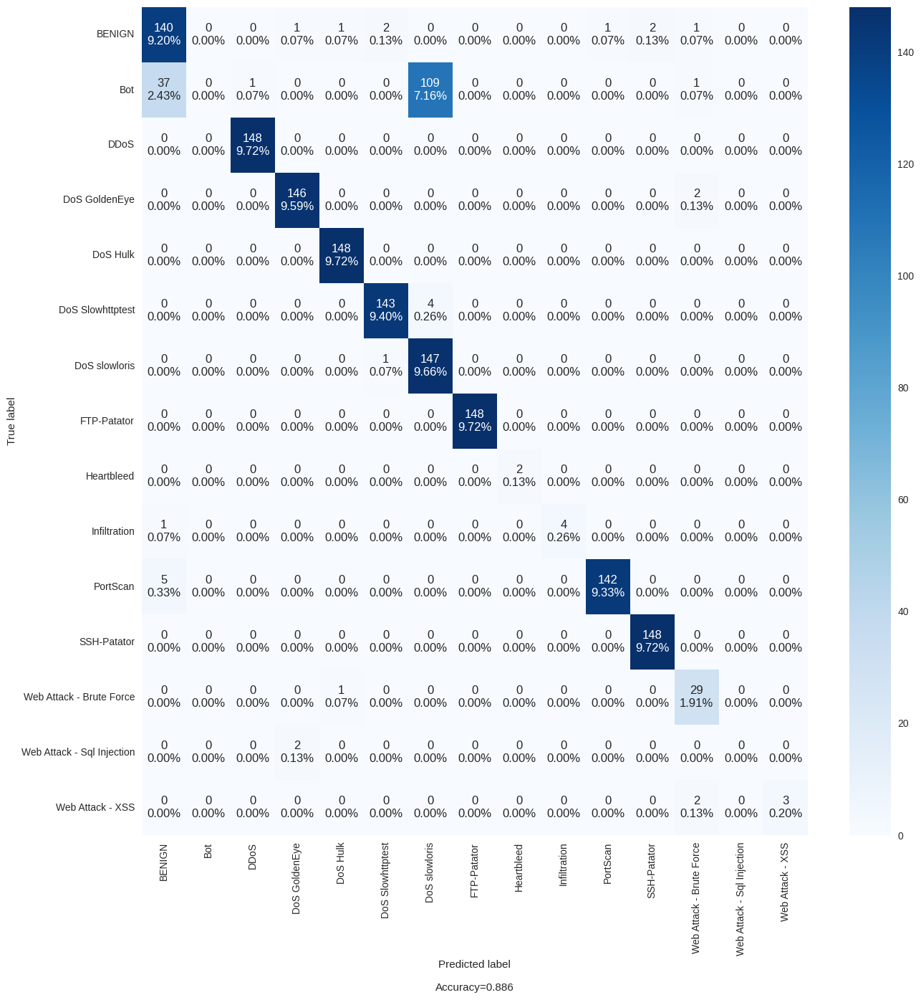

In [42]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [43]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DDoS']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.4595134	total: 175ms	remaining: 6.82s
1:	learn: 0.2469429	total: 366ms	remaining: 6.96s
2:	learn: 0.1836270	total: 557ms	remaining: 6.87s
3:	learn: 0.1412963	total: 745ms	remaining: 6.7s
4:	learn: 0.1228756	total: 927ms	remaining: 6.49s
5:	learn: 0.1095123	total: 1.12s	remaining: 6.34s
6:	learn: 0.0985933	total: 1.32s	remaining: 6.2s
7:	learn: 0.0921445	total: 1.51s	remaining: 6.06s
8:	learn: 0.0787042	total: 1.7s	remaining: 5.86s
9:	learn: 0.0748925	total: 1.89s	remaining: 5.66s
10:	learn: 0.0712010	total: 2.08s	remaining: 5.48s
11:	learn: 0.0675800	total: 2.26s	remaining: 5.28s
12:	learn: 0.0640781	total: 2.45s	remaining: 5.08s
13:	learn: 0.0618009	total: 2.64s	remaining: 4.9s
14:	learn: 0.0588385	total: 2.83s	remaining: 4.71s
15:	learn: 0.0571462	total: 3.01s	remaining: 4.52s
16:	learn: 0.0554575	total: 3.21s	remaining: 4.34s
17:	learn: 0.0531993	total: 3.39s	remaining: 4.15s
18:	learn: 0.0518522	total: 3.58s	remaining: 3.96s
19:	learn: 0.0497334	total: 3.77s	remaining: 

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.992178,0.886991
1,PRECISION,0.992282,0.840417
2,RECALL,0.992178,0.886991
3,F1 SCORE,0.992169,0.855787


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


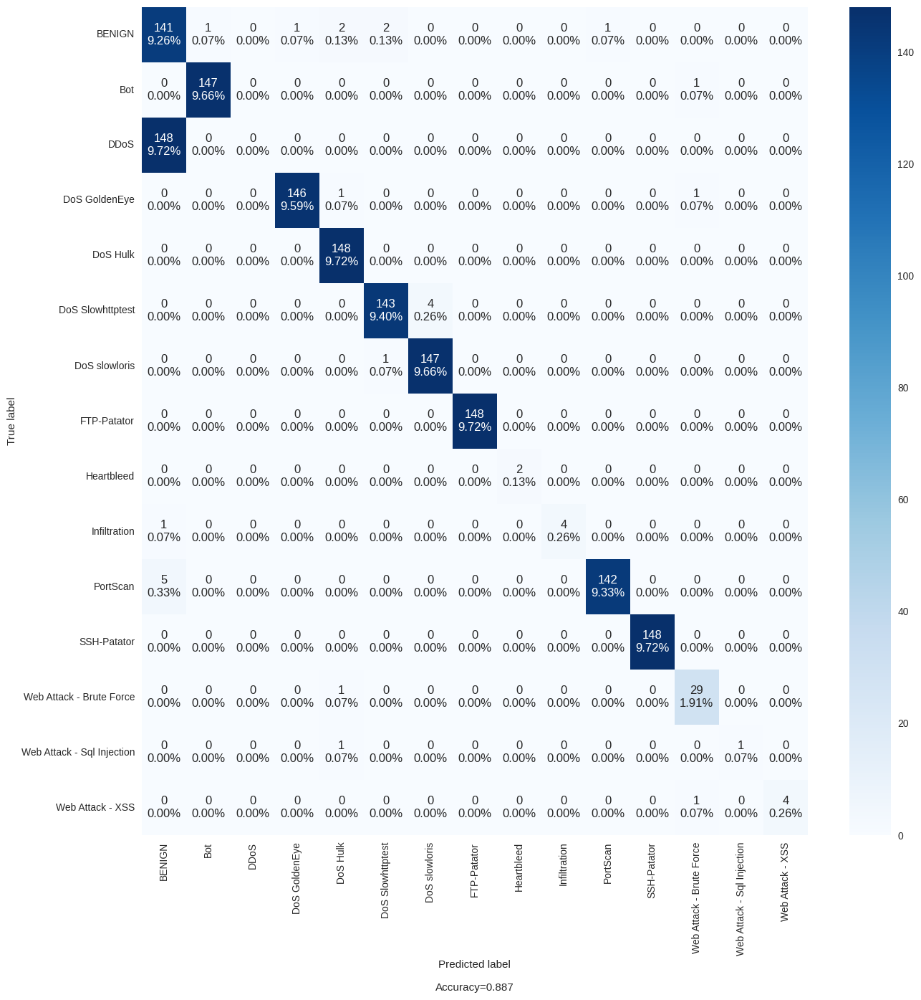

In [44]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [45]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS GoldenEye']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.6088068	total: 168ms	remaining: 6.56s
1:	learn: 0.2938968	total: 399ms	remaining: 7.58s
2:	learn: 0.2161056	total: 597ms	remaining: 7.36s
3:	learn: 0.1662313	total: 817ms	remaining: 7.36s
4:	learn: 0.1347181	total: 1.01s	remaining: 7.05s
5:	learn: 0.1064104	total: 1.19s	remaining: 6.75s
6:	learn: 0.0973196	total: 1.38s	remaining: 6.51s
7:	learn: 0.0903131	total: 1.58s	remaining: 6.3s
8:	learn: 0.0817036	total: 1.77s	remaining: 6.09s
9:	learn: 0.0781543	total: 1.96s	remaining: 5.87s
10:	learn: 0.0747657	total: 2.15s	remaining: 5.66s
11:	learn: 0.0738440	total: 2.16s	remaining: 5.05s
12:	learn: 0.0656896	total: 2.35s	remaining: 4.88s
13:	learn: 0.0613704	total: 2.54s	remaining: 4.71s
14:	learn: 0.0576341	total: 2.73s	remaining: 4.55s
15:	learn: 0.0526261	total: 2.92s	remaining: 4.38s
16:	learn: 0.0513995	total: 3.12s	remaining: 4.21s
17:	learn: 0.0485365	total: 3.33s	remaining: 4.06s
18:	learn: 0.0467468	total: 3.52s	remaining: 3.89s
19:	learn: 0.0465203	total: 3.71s	remainin

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.991632,0.888305
1,PRECISION,0.991779,0.854860
2,RECALL,0.991632,0.888305
3,F1 SCORE,0.991635,0.868863


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


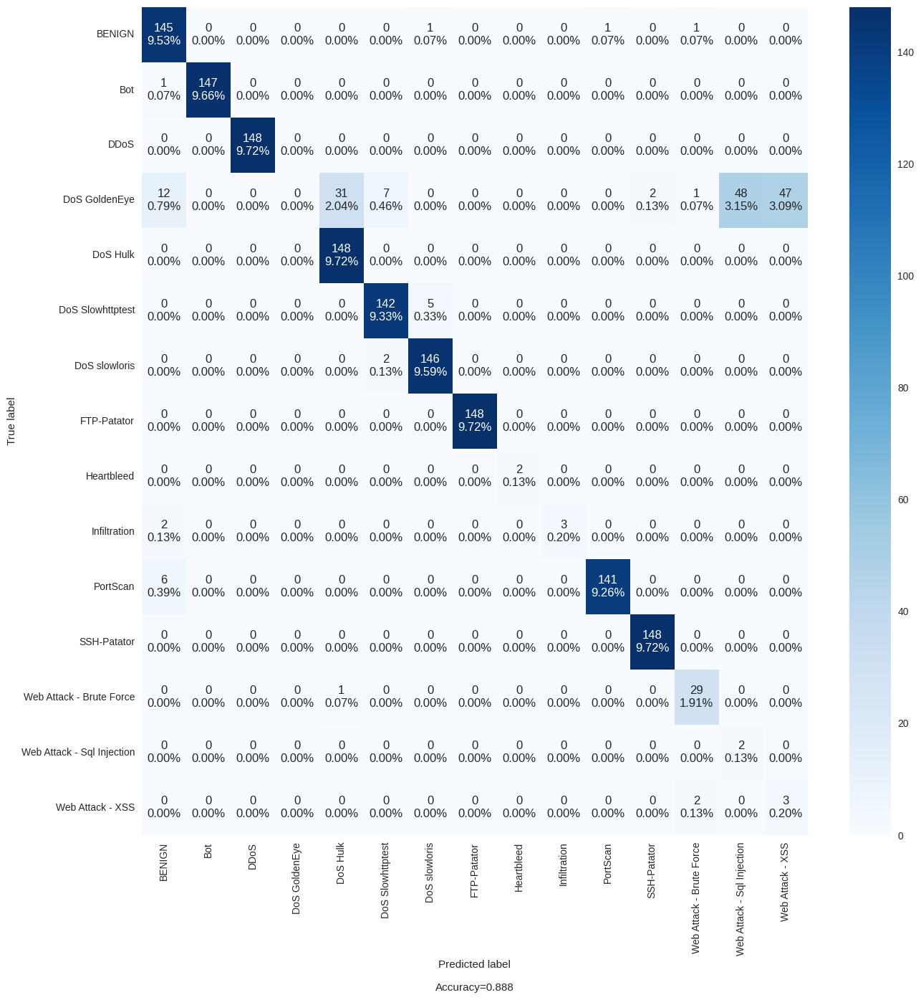

In [46]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [47]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS Hulk']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.5314943	total: 177ms	remaining: 6.9s
1:	learn: 0.2404978	total: 366ms	remaining: 6.95s
2:	learn: 0.1797252	total: 556ms	remaining: 6.86s
3:	learn: 0.1319660	total: 752ms	remaining: 6.77s
4:	learn: 0.1082035	total: 952ms	remaining: 6.67s
5:	learn: 0.0973664	total: 1.16s	remaining: 6.55s
6:	learn: 0.0912417	total: 1.36s	remaining: 6.41s
7:	learn: 0.0820544	total: 1.59s	remaining: 6.36s
8:	learn: 0.0759099	total: 1.71s	remaining: 5.88s
9:	learn: 0.0738222	total: 1.77s	remaining: 5.3s
10:	learn: 0.0703923	total: 1.8s	remaining: 4.75s
11:	learn: 0.0674565	total: 2.05s	remaining: 4.78s
12:	learn: 0.0663945	total: 2.14s	remaining: 4.45s
13:	learn: 0.0619950	total: 2.37s	remaining: 4.41s
14:	learn: 0.0590981	total: 2.6s	remaining: 4.34s
15:	learn: 0.0576215	total: 2.83s	remaining: 4.25s
16:	learn: 0.0557330	total: 3.05s	remaining: 4.13s
17:	learn: 0.0543538	total: 3.27s	remaining: 4s
18:	learn: 0.0525069	total: 3.5s	remaining: 3.87s
19:	learn: 0.0513680	total: 3.72s	remaining: 3.72

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.991632,0.886991
1,PRECISION,0.991758,0.881680
2,RECALL,0.991632,0.886991
3,F1 SCORE,0.991625,0.883289


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


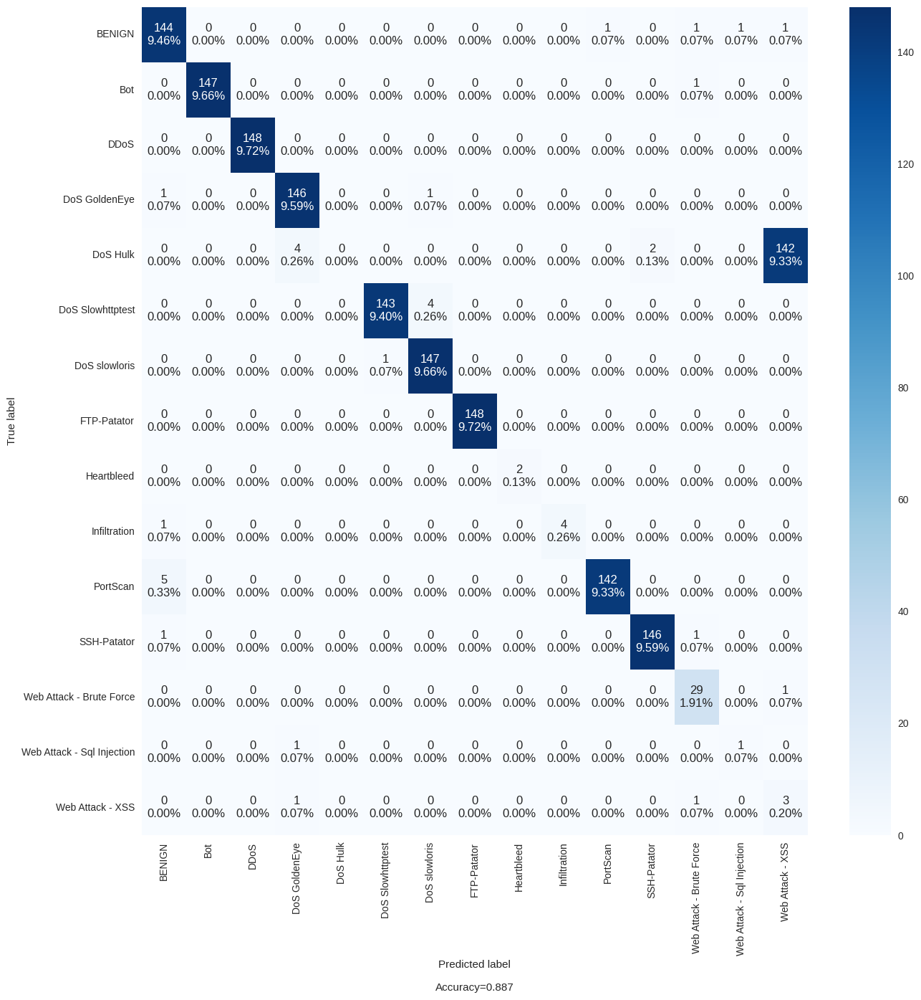

In [48]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [49]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS Slowhttptest']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.3723628	total: 198ms	remaining: 7.72s
1:	learn: 0.1498299	total: 398ms	remaining: 7.56s
2:	learn: 0.1212229	total: 629ms	remaining: 7.76s
3:	learn: 0.0987255	total: 835ms	remaining: 7.51s
4:	learn: 0.0863109	total: 1.05s	remaining: 7.35s
5:	learn: 0.0773335	total: 1.26s	remaining: 7.16s
6:	learn: 0.0670414	total: 1.49s	remaining: 7.01s
7:	learn: 0.0621229	total: 1.72s	remaining: 6.87s
8:	learn: 0.0579575	total: 1.98s	remaining: 6.83s
9:	learn: 0.0556067	total: 2.2s	remaining: 6.61s
10:	learn: 0.0527110	total: 2.44s	remaining: 6.43s
11:	learn: 0.0500069	total: 2.67s	remaining: 6.22s
12:	learn: 0.0445668	total: 2.94s	remaining: 6.1s
13:	learn: 0.0410694	total: 3.16s	remaining: 5.87s
14:	learn: 0.0391521	total: 3.39s	remaining: 5.65s
15:	learn: 0.0347656	total: 3.6s	remaining: 5.41s
16:	learn: 0.0334635	total: 3.83s	remaining: 5.19s
17:	learn: 0.0322606	total: 4.06s	remaining: 4.96s
18:	learn: 0.0308750	total: 4.28s	remaining: 4.73s
19:	learn: 0.0307475	total: 4.51s	remaining:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.995633,0.891590
1,PRECISION,0.995722,0.844688
2,RECALL,0.995633,0.891590
3,F1 SCORE,0.995627,0.860868


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


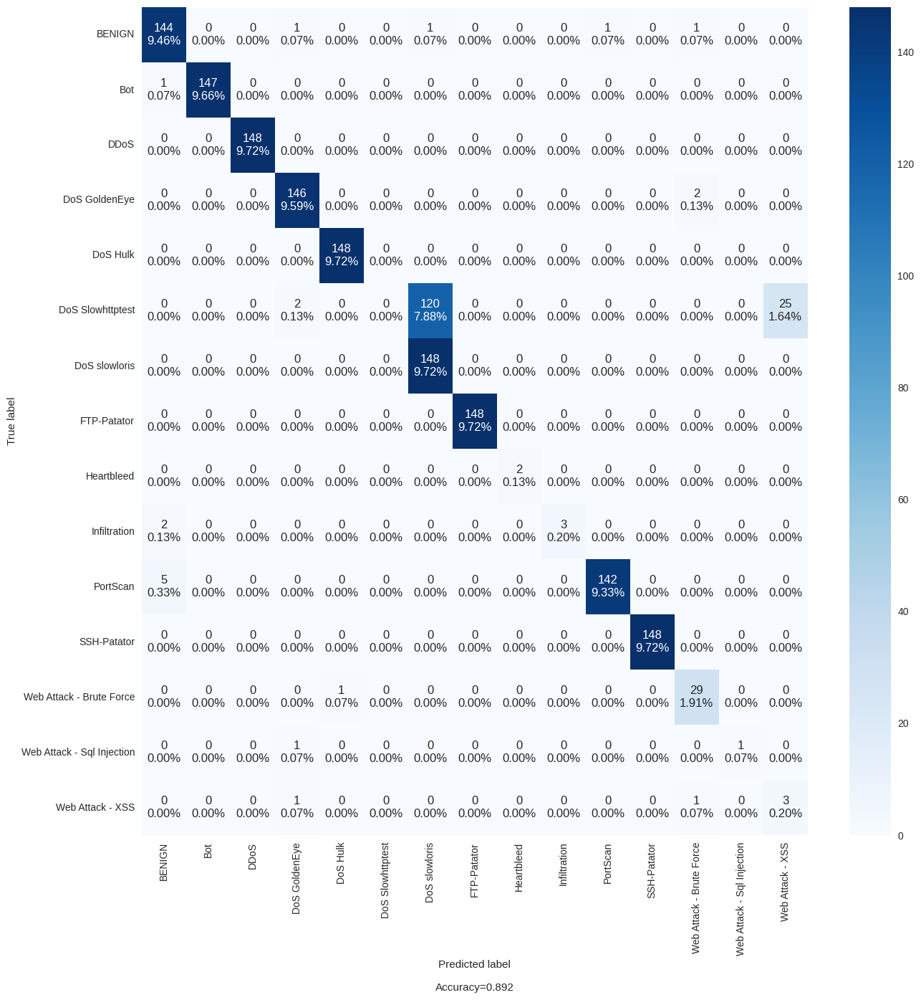

In [50]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [51]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS slowloris']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.3628815	total: 193ms	remaining: 7.51s
1:	learn: 0.1798732	total: 392ms	remaining: 7.45s
2:	learn: 0.1393165	total: 611ms	remaining: 7.54s
3:	learn: 0.1237110	total: 820ms	remaining: 7.38s
4:	learn: 0.1035129	total: 1.06s	remaining: 7.43s
5:	learn: 0.0925211	total: 1.28s	remaining: 7.27s
6:	learn: 0.0852863	total: 1.51s	remaining: 7.11s
7:	learn: 0.0754845	total: 1.72s	remaining: 6.89s
8:	learn: 0.0690845	total: 1.94s	remaining: 6.7s
9:	learn: 0.0607777	total: 2.17s	remaining: 6.51s
10:	learn: 0.0567098	total: 2.39s	remaining: 6.3s
11:	learn: 0.0532318	total: 2.61s	remaining: 6.09s
12:	learn: 0.0494248	total: 2.89s	remaining: 6s
13:	learn: 0.0467882	total: 3.11s	remaining: 5.78s
14:	learn: 0.0442298	total: 3.33s	remaining: 5.55s
15:	learn: 0.0411105	total: 3.55s	remaining: 5.32s
16:	learn: 0.0388789	total: 3.77s	remaining: 5.1s
17:	learn: 0.0363171	total: 3.98s	remaining: 4.87s
18:	learn: 0.0344551	total: 4.2s	remaining: 4.64s
19:	learn: 0.0318723	total: 4.43s	remaining: 4.4

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.995998,0.889619
1,PRECISION,0.996074,0.840659
2,RECALL,0.995998,0.889619
3,F1 SCORE,0.995997,0.856656


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


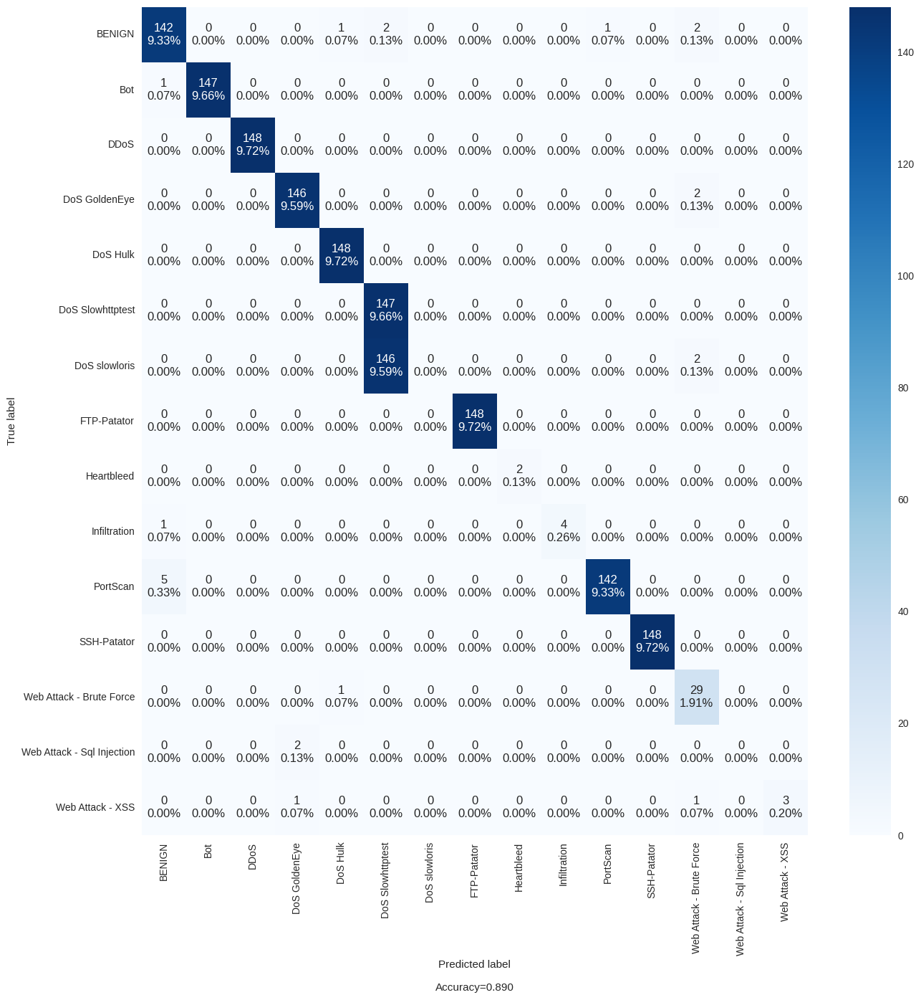

In [52]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [53]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'FTP-Patator']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.5890581	total: 200ms	remaining: 7.81s
1:	learn: 0.5588632	total: 401ms	remaining: 7.62s
2:	learn: 0.3960624	total: 611ms	remaining: 7.53s
3:	learn: 0.3242533	total: 856ms	remaining: 7.7s
4:	learn: 0.2450371	total: 1.09s	remaining: 7.62s
5:	learn: 0.1770205	total: 1.31s	remaining: 7.4s
6:	learn: 0.1234952	total: 1.53s	remaining: 7.2s
7:	learn: 0.1081838	total: 1.75s	remaining: 7.01s
8:	learn: 0.0967440	total: 1.97s	remaining: 6.79s
9:	learn: 0.0862737	total: 2.19s	remaining: 6.57s
10:	learn: 0.0779915	total: 2.4s	remaining: 6.33s
11:	learn: 0.0747109	total: 2.63s	remaining: 6.13s
12:	learn: 0.0721876	total: 2.84s	remaining: 5.9s
13:	learn: 0.0682035	total: 3.07s	remaining: 5.7s
14:	learn: 0.0665421	total: 3.29s	remaining: 5.49s
15:	learn: 0.0634211	total: 3.51s	remaining: 5.27s
16:	learn: 0.0621048	total: 3.74s	remaining: 5.06s
17:	learn: 0.0589740	total: 3.96s	remaining: 4.84s
18:	learn: 0.0572217	total: 4.19s	remaining: 4.63s
19:	learn: 0.0557662	total: 4.43s	remaining: 4.

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.991632,0.886334
1,PRECISION,0.991820,0.841132
2,RECALL,0.991632,0.886334
3,F1 SCORE,0.991639,0.855411


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


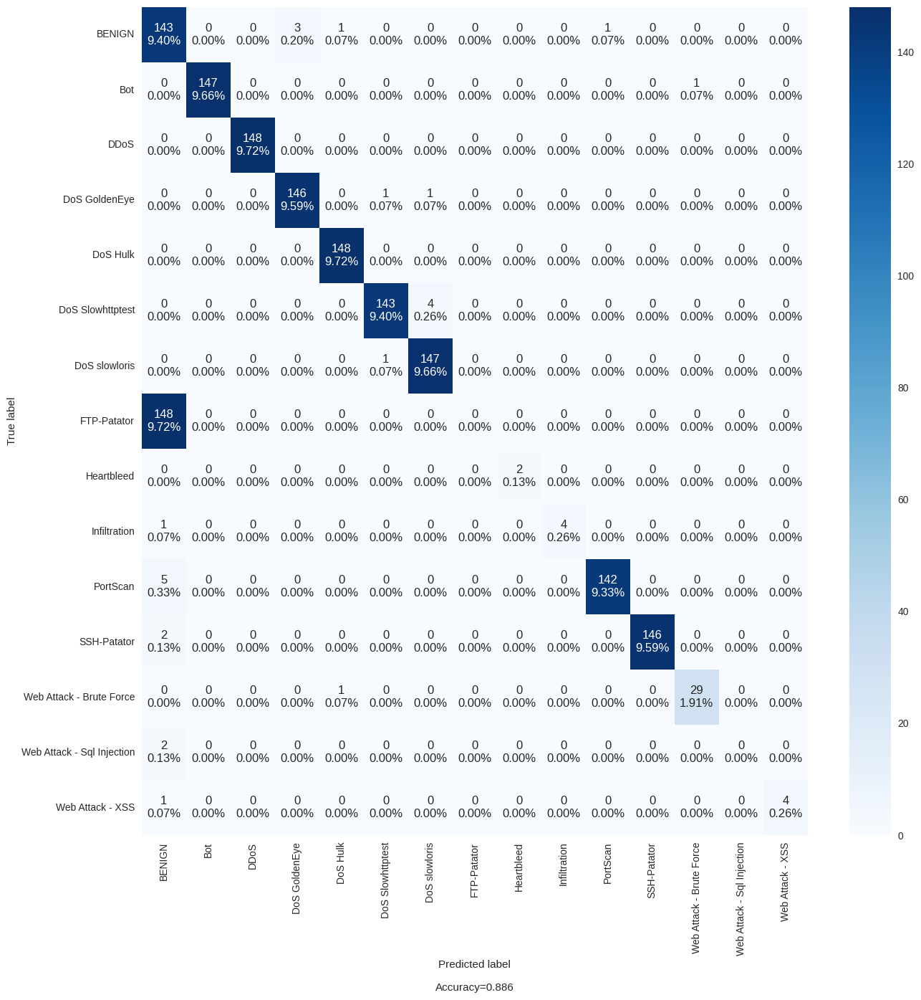

In [54]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [55]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Heartbleed']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.5077759	total: 199ms	remaining: 7.75s
1:	learn: 0.2729852	total: 432ms	remaining: 8.2s
2:	learn: 0.2172734	total: 649ms	remaining: 8.01s
3:	learn: 0.1921740	total: 866ms	remaining: 7.8s
4:	learn: 0.1719297	total: 1.1s	remaining: 7.71s
5:	learn: 0.1371379	total: 1.32s	remaining: 7.5s
6:	learn: 0.1035952	total: 1.55s	remaining: 7.29s
7:	learn: 0.0931837	total: 1.77s	remaining: 7.1s
8:	learn: 0.0853212	total: 1.99s	remaining: 6.85s
9:	learn: 0.0817357	total: 2.21s	remaining: 6.63s
10:	learn: 0.0767502	total: 2.44s	remaining: 6.42s
11:	learn: 0.0732024	total: 2.66s	remaining: 6.21s
12:	learn: 0.0694263	total: 2.88s	remaining: 5.99s
13:	learn: 0.0661875	total: 3.1s	remaining: 5.76s
14:	learn: 0.0605523	total: 3.33s	remaining: 5.55s
15:	learn: 0.0584137	total: 3.56s	remaining: 5.34s
16:	learn: 0.0558427	total: 3.79s	remaining: 5.13s
17:	learn: 0.0545564	total: 4.02s	remaining: 4.91s
18:	learn: 0.0511550	total: 4.28s	remaining: 4.73s
19:	learn: 0.0491481	total: 4.5s	remaining: 4.5

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.992267,0.982260
1,PRECISION,0.992404,0.981148
2,RECALL,0.992267,0.982260
3,F1 SCORE,0.992259,0.981382


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


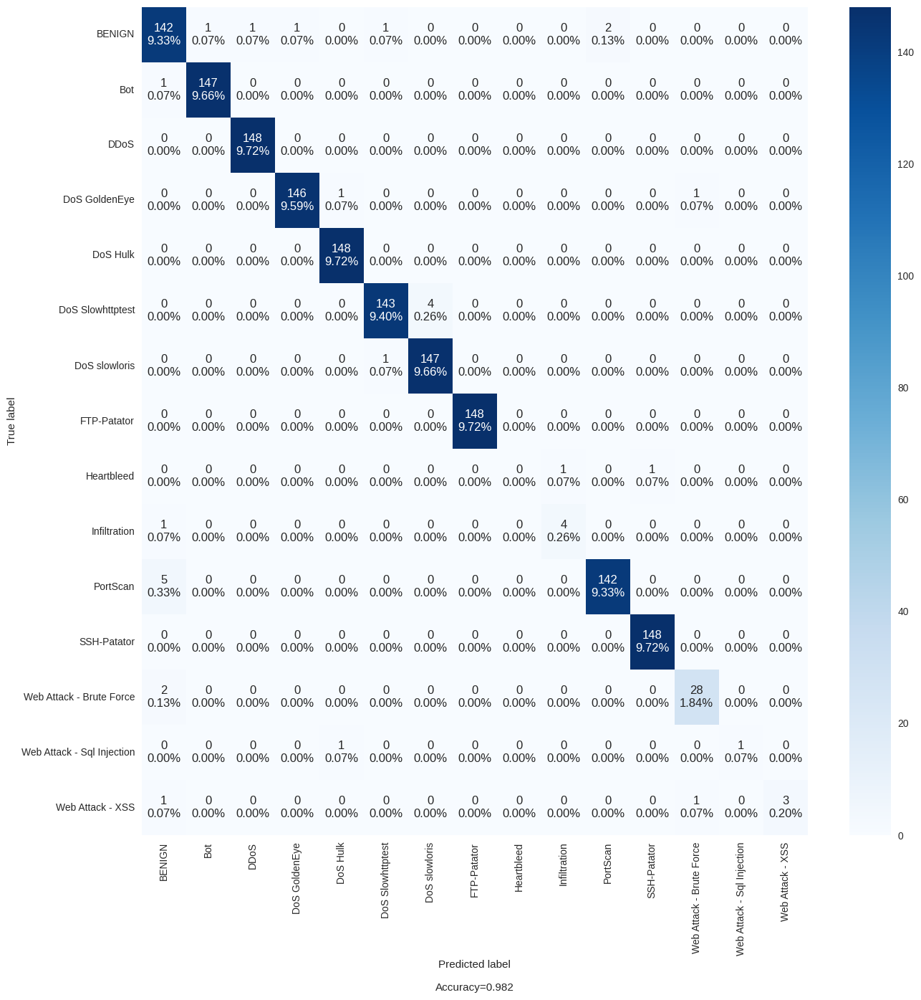

In [56]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [57]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Infiltration']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.5406943	total: 203ms	remaining: 7.91s
1:	learn: 0.2861992	total: 405ms	remaining: 7.7s
2:	learn: 0.1930319	total: 610ms	remaining: 7.52s
3:	learn: 0.1311303	total: 828ms	remaining: 7.45s
4:	learn: 0.1163690	total: 1.04s	remaining: 7.29s
5:	learn: 0.1025157	total: 1.27s	remaining: 7.2s
6:	learn: 0.0918529	total: 1.5s	remaining: 7.1s
7:	learn: 0.0830212	total: 1.72s	remaining: 6.88s
8:	learn: 0.0768478	total: 1.94s	remaining: 6.67s
9:	learn: 0.0719628	total: 2.16s	remaining: 6.48s
10:	learn: 0.0683058	total: 2.38s	remaining: 6.28s
11:	learn: 0.0659445	total: 2.61s	remaining: 6.09s
12:	learn: 0.0627984	total: 2.73s	remaining: 5.67s
13:	learn: 0.0598552	total: 2.85s	remaining: 5.29s
14:	learn: 0.0562273	total: 3.08s	remaining: 5.13s
15:	learn: 0.0539544	total: 3.31s	remaining: 4.97s
16:	learn: 0.0515236	total: 3.58s	remaining: 4.85s
17:	learn: 0.0488526	total: 3.81s	remaining: 4.65s
18:	learn: 0.0464075	total: 4.03s	remaining: 4.45s
19:	learn: 0.0440139	total: 4.26s	remaining: 

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.992909,0.978318
1,PRECISION,0.993045,0.975142
2,RECALL,0.992909,0.978318
3,F1 SCORE,0.992907,0.976298


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


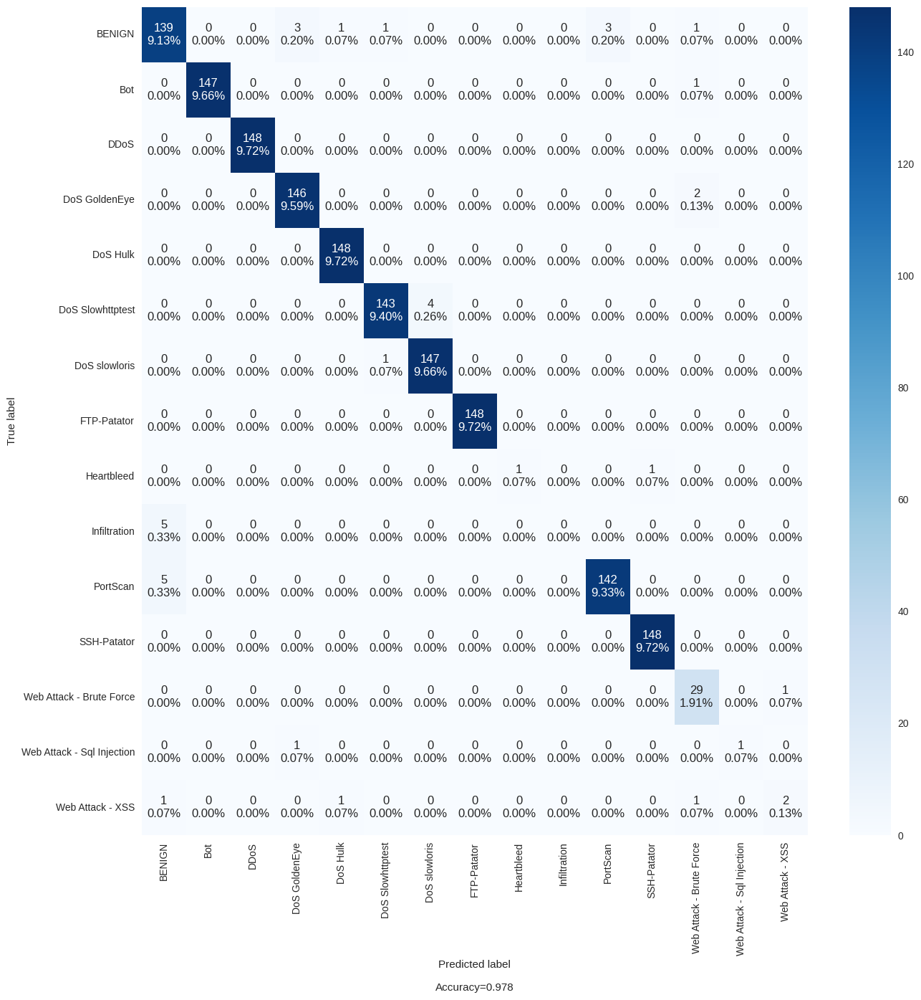

In [58]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [59]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'PortScan']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.3794106	total: 202ms	remaining: 7.89s
1:	learn: 0.2000634	total: 409ms	remaining: 7.76s
2:	learn: 0.1488663	total: 619ms	remaining: 7.64s
3:	learn: 0.1225590	total: 830ms	remaining: 7.47s
4:	learn: 0.0996127	total: 943ms	remaining: 6.6s
5:	learn: 0.0878705	total: 1.16s	remaining: 6.55s
6:	learn: 0.0785327	total: 1.38s	remaining: 6.51s
7:	learn: 0.0714442	total: 1.62s	remaining: 6.48s
8:	learn: 0.0663906	total: 1.84s	remaining: 6.33s
9:	learn: 0.0628102	total: 2.06s	remaining: 6.18s
10:	learn: 0.0572765	total: 2.28s	remaining: 6s
11:	learn: 0.0558417	total: 2.39s	remaining: 5.59s
12:	learn: 0.0516268	total: 2.61s	remaining: 5.43s
13:	learn: 0.0470501	total: 2.84s	remaining: 5.28s
14:	learn: 0.0447325	total: 3.06s	remaining: 5.09s
15:	learn: 0.0429162	total: 3.28s	remaining: 4.92s
16:	learn: 0.0409777	total: 3.51s	remaining: 4.74s
17:	learn: 0.0391887	total: 3.73s	remaining: 4.55s
18:	learn: 0.0364709	total: 4.05s	remaining: 4.47s
19:	learn: 0.0354878	total: 4.27s	remaining: 

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.996361,0.890276
1,PRECISION,0.996432,0.841763
2,RECALL,0.996361,0.890276
3,F1 SCORE,0.996362,0.858365


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


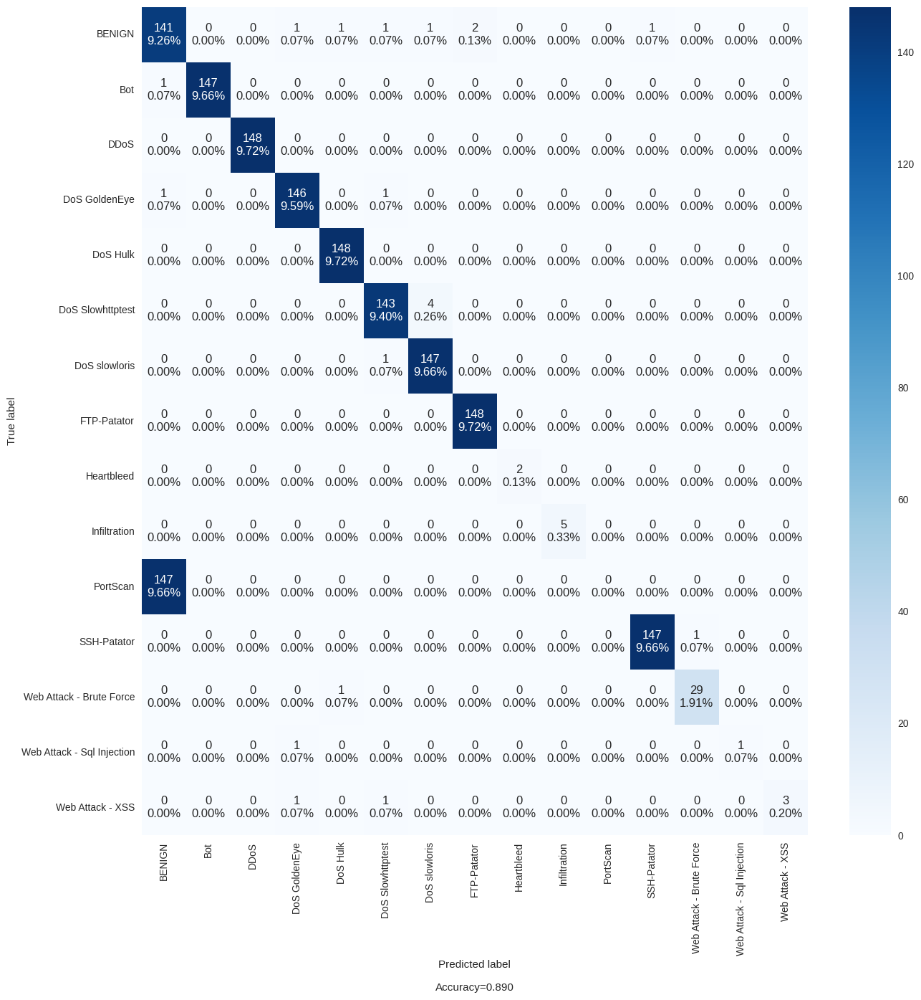

In [60]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [61]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'SSH-Patator']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.5011264	total: 194ms	remaining: 7.58s
1:	learn: 0.2231054	total: 395ms	remaining: 7.5s
2:	learn: 0.1776650	total: 600ms	remaining: 7.4s
3:	learn: 0.1468344	total: 808ms	remaining: 7.27s
4:	learn: 0.1196900	total: 1.02s	remaining: 7.15s
5:	learn: 0.1000644	total: 1.24s	remaining: 7.01s
6:	learn: 0.0926524	total: 1.45s	remaining: 6.84s
7:	learn: 0.0818977	total: 1.69s	remaining: 6.74s
8:	learn: 0.0735360	total: 1.91s	remaining: 6.59s
9:	learn: 0.0696129	total: 2.13s	remaining: 6.39s
10:	learn: 0.0650667	total: 2.35s	remaining: 6.19s
11:	learn: 0.0604714	total: 2.57s	remaining: 6s
12:	learn: 0.0585802	total: 2.8s	remaining: 5.81s
13:	learn: 0.0564183	total: 3.02s	remaining: 5.6s
14:	learn: 0.0531467	total: 3.24s	remaining: 5.39s
15:	learn: 0.0521214	total: 3.46s	remaining: 5.19s
16:	learn: 0.0504389	total: 3.77s	remaining: 5.11s
17:	learn: 0.0502780	total: 3.8s	remaining: 4.64s
18:	learn: 0.0484193	total: 4.03s	remaining: 4.45s
19:	learn: 0.0451693	total: 4.25s	remaining: 4.25

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.992359,0.886991
1,PRECISION,0.992486,0.838441
2,RECALL,0.992359,0.886991
3,F1 SCORE,0.992359,0.854528


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


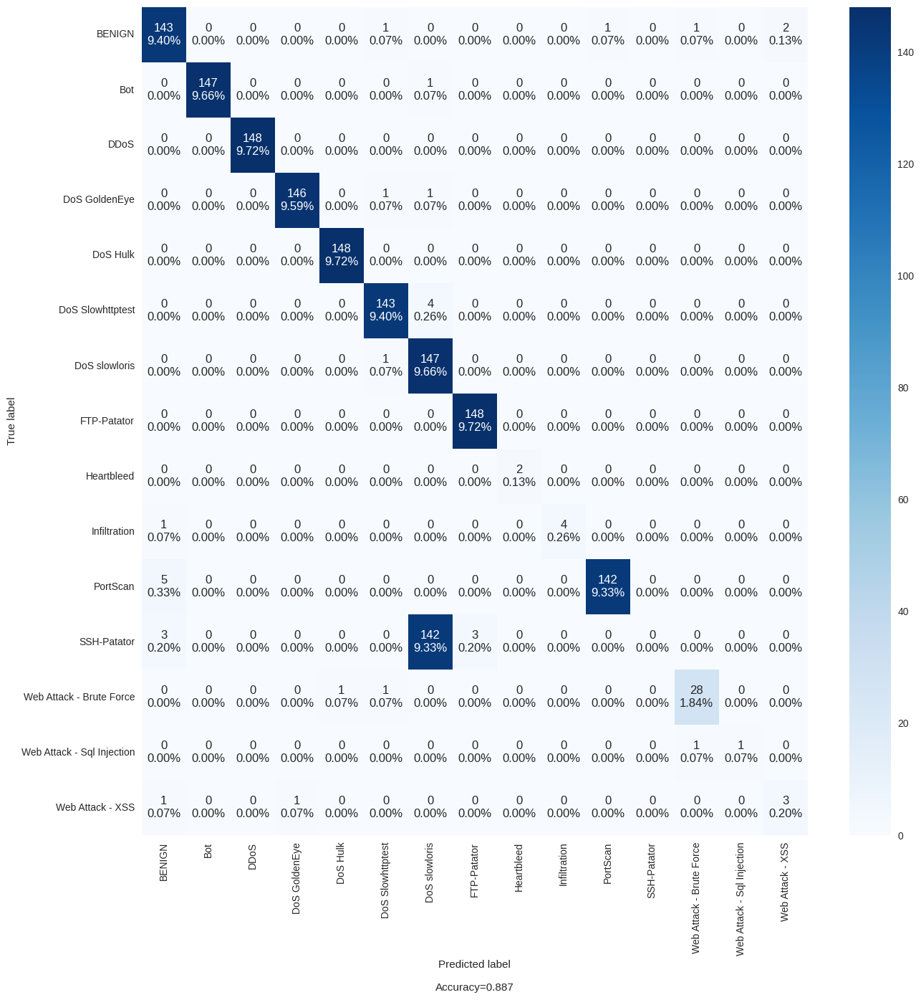

In [62]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [63]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Web Attack - Brute Force']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.4081284	total: 198ms	remaining: 7.74s
1:	learn: 0.2082216	total: 393ms	remaining: 7.47s
2:	learn: 0.1588547	total: 603ms	remaining: 7.44s
3:	learn: 0.1343752	total: 810ms	remaining: 7.29s
4:	learn: 0.1211370	total: 867ms	remaining: 6.07s
5:	learn: 0.1011863	total: 1.09s	remaining: 6.18s
6:	learn: 0.0906497	total: 1.3s	remaining: 6.14s
7:	learn: 0.0809573	total: 1.52s	remaining: 6.09s
8:	learn: 0.0738143	total: 1.74s	remaining: 6.01s
9:	learn: 0.0696621	total: 1.97s	remaining: 5.92s
10:	learn: 0.0639441	total: 2.23s	remaining: 5.88s
11:	learn: 0.0617613	total: 2.53s	remaining: 5.9s
12:	learn: 0.0600356	total: 2.83s	remaining: 5.88s
13:	learn: 0.0553922	total: 3.06s	remaining: 5.69s
14:	learn: 0.0534985	total: 3.29s	remaining: 5.49s
15:	learn: 0.0519268	total: 3.56s	remaining: 5.33s
16:	learn: 0.0493244	total: 3.79s	remaining: 5.13s
17:	learn: 0.0482565	total: 4.03s	remaining: 4.92s
18:	learn: 0.0471136	total: 4.26s	remaining: 4.71s
19:	learn: 0.0463380	total: 4.29s	remaining

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.992792,0.967806
1,PRECISION,0.992897,0.957193
2,RECALL,0.992792,0.967806
3,F1 SCORE,0.992785,0.961663


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


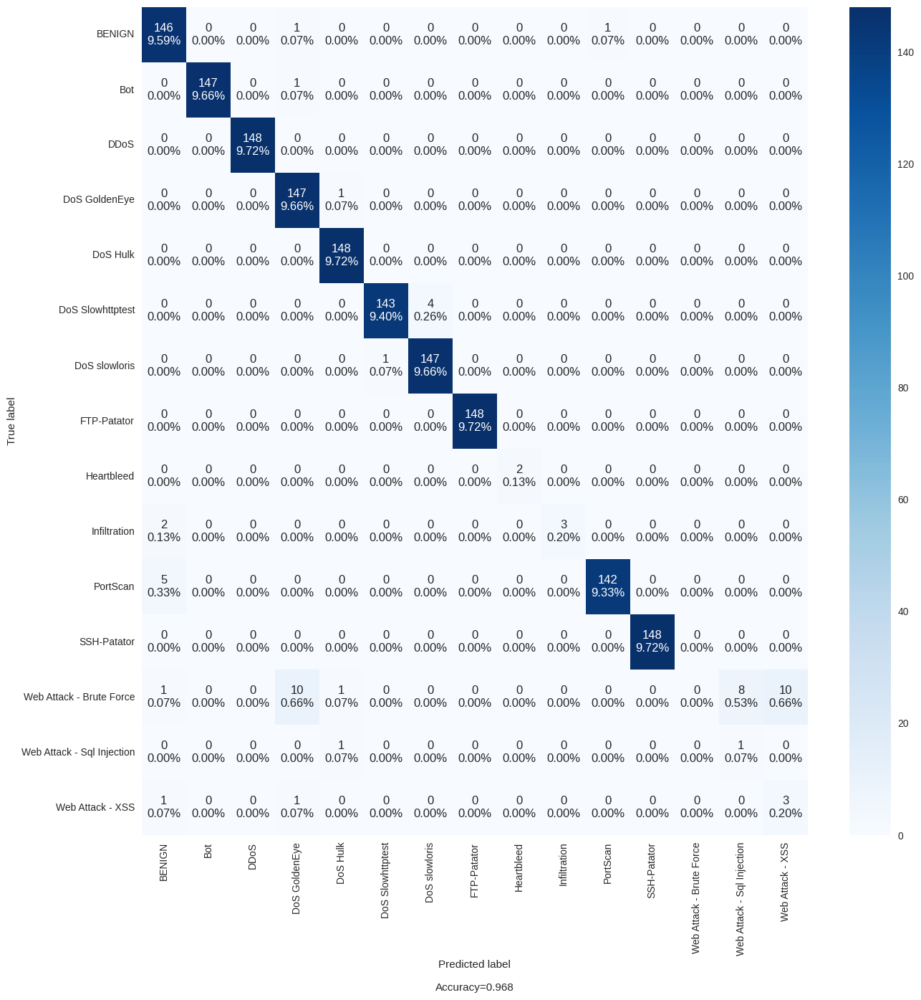

In [64]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [65]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Web Attack - Sql Injection']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.5379670	total: 232ms	remaining: 9.03s
1:	learn: 0.2716491	total: 483ms	remaining: 9.18s
2:	learn: 0.1885398	total: 697ms	remaining: 8.6s
3:	learn: 0.1421004	total: 953ms	remaining: 8.58s
4:	learn: 0.1158514	total: 1.19s	remaining: 8.33s
5:	learn: 0.1022920	total: 1.43s	remaining: 8.12s
6:	learn: 0.0937229	total: 1.68s	remaining: 7.91s
7:	learn: 0.0861988	total: 1.93s	remaining: 7.71s
8:	learn: 0.0805551	total: 2.18s	remaining: 7.5s
9:	learn: 0.0712385	total: 2.44s	remaining: 7.33s
10:	learn: 0.0665772	total: 2.75s	remaining: 7.26s
11:	learn: 0.0644784	total: 3.03s	remaining: 7.07s
12:	learn: 0.0623908	total: 3.31s	remaining: 6.87s
13:	learn: 0.0594787	total: 3.58s	remaining: 6.64s
14:	learn: 0.0558568	total: 3.85s	remaining: 6.41s
15:	learn: 0.0507589	total: 4.17s	remaining: 6.26s
16:	learn: 0.0505028	total: 4.47s	remaining: 6.04s
17:	learn: 0.0492707	total: 4.74s	remaining: 5.79s
18:	learn: 0.0491870	total: 4.87s	remaining: 5.38s
19:	learn: 0.0468619	total: 5.13s	remaining

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.992924,0.982260
1,PRECISION,0.993067,0.981285
2,RECALL,0.992924,0.982260
3,F1 SCORE,0.992918,0.981380


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


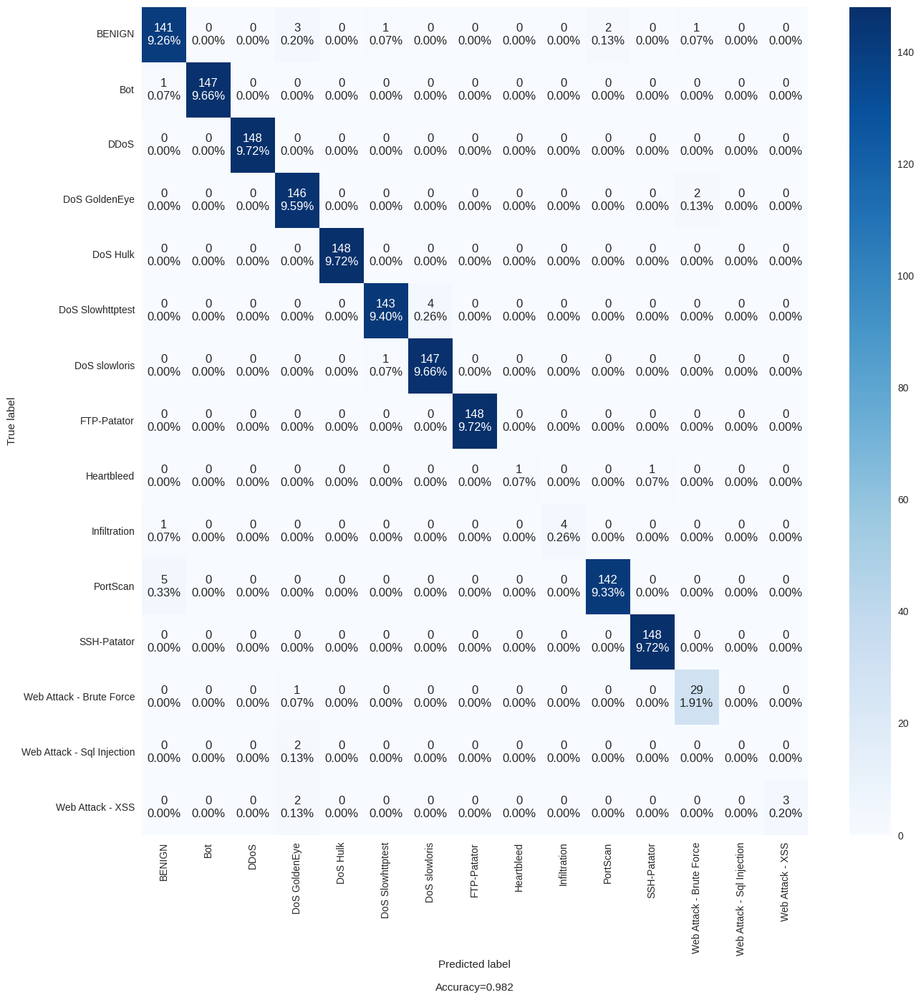

In [66]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [67]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Web Attack - XSS']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.5312836	total: 210ms	remaining: 8.2s
1:	learn: 0.3304557	total: 423ms	remaining: 8.04s
2:	learn: 0.2026665	total: 641ms	remaining: 7.91s
3:	learn: 0.1640228	total: 909ms	remaining: 8.18s
4:	learn: 0.1298765	total: 1.13s	remaining: 7.94s
5:	learn: 0.1067498	total: 1.35s	remaining: 7.67s
6:	learn: 0.0912303	total: 1.58s	remaining: 7.45s
7:	learn: 0.0827722	total: 1.8s	remaining: 7.22s
8:	learn: 0.0765543	total: 2.03s	remaining: 7s
9:	learn: 0.0724335	total: 2.26s	remaining: 6.79s
10:	learn: 0.0670403	total: 2.49s	remaining: 6.57s
11:	learn: 0.0624995	total: 2.72s	remaining: 6.36s
12:	learn: 0.0613589	total: 2.75s	remaining: 5.7s
13:	learn: 0.0577229	total: 2.97s	remaining: 5.52s
14:	learn: 0.0548804	total: 3.21s	remaining: 5.35s
15:	learn: 0.0546871	total: 3.23s	remaining: 4.84s
16:	learn: 0.0513140	total: 3.45s	remaining: 4.67s
17:	learn: 0.0476617	total: 3.68s	remaining: 4.49s
18:	learn: 0.0474721	total: 3.8s	remaining: 4.2s
19:	learn: 0.0454522	total: 4.04s	remaining: 4.04

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.993240,0.978318
1,PRECISION,0.993386,0.974322
2,RECALL,0.993240,0.978318
3,F1 SCORE,0.993244,0.976031


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


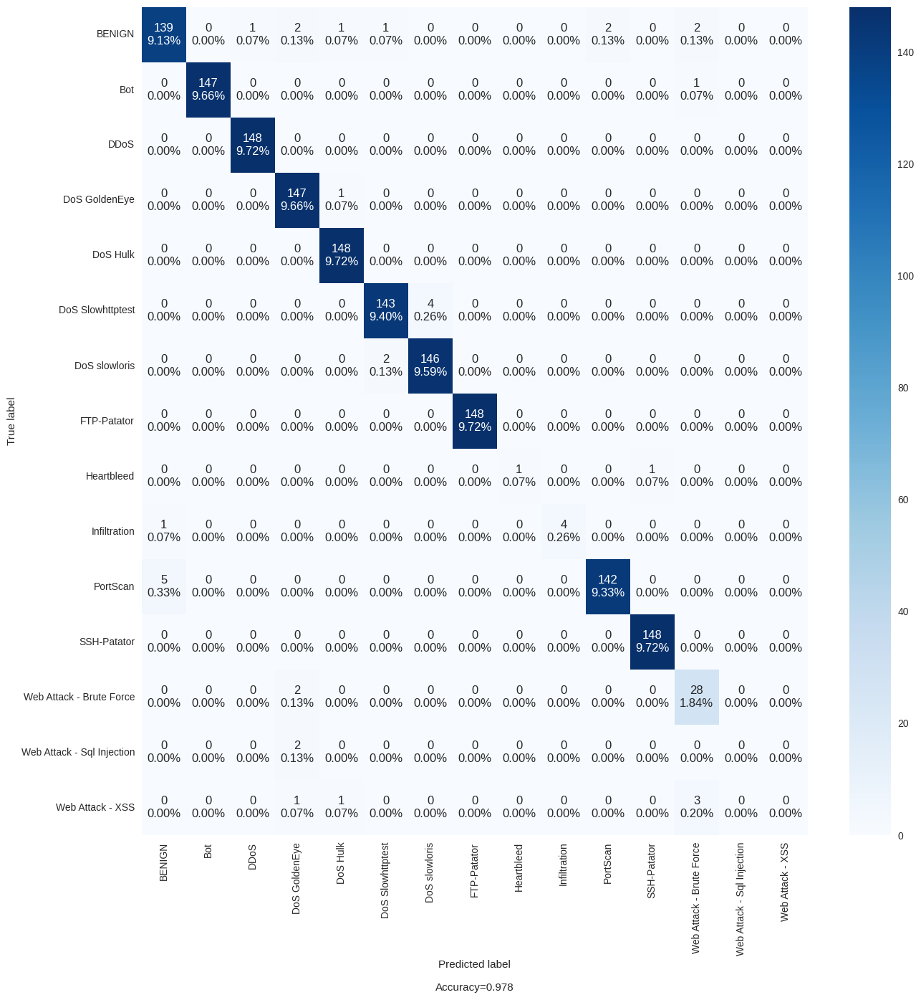

In [68]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))